# Machine Learning Project

Student names and numbers: **Maria Magdalena Michail(293100)** & **Viggo Petersen(314203)**

**Viggo** did parts:

    * 3 Clustering of Handwritten Digits
    * 5 Sentiment Analysis
    * 6 Speech Recognition
    
**Maria** did parts:

    * 1 The IceCat Dataset
    * 2 Flights Departing from NYC
    * 4 The Local Elections

The assignments below should be solved and documented as a project that will form the basis for the
examination. When solving the exercises it is important that you

  * document all relevant results and analyses that you have obtained/performed during the exercises.
  * try to relate your results to the theoretical background of the methods being applied.

Feel free to add cells if you need to.

Please hand in assignment 1-6 in a _**single**_ Jupyter notebook where you retain the questions outlined below. You are welcome to adapt code from the web (e.g. Kaggle kernels), but you **_must_** reference the original source in your notebook. In addition to _clean, well-documented code_ (i.e. functions with <a href="https://www.geeksforgeeks.org/python-docstrings/">docstrings</a>, etc), your notebook will be judged according to how well each step is explained (using Markdown). 

In general, direct questions regarding assignments 1, 4, 5 and 6 to Frederik, and questions regarding assignments 2, 3, and 7 to Richard. 

Last, but not least:
* Looking for an overview of the markdown language? The cheat sheet <a href="https://medium.com/ibm-data-science-experience/markdown-for-jupyter-notebooks-cheatsheet-386c05aeebed">here</a> might help.
* For the Python specific components of the exercises, you should not need constructs beyond those that are already included in the notebooks on the course's web-page (still you should not feel constrained by these, so feel free to be adventurous). You may, however, need to consult the documentation for some of the methods supplied by `sklearn`.

**Groups:** Create your own groups. May be across teams. 2-4 students per group. No one-person groups.


**Submission deadline:** Thursday, December 15 before 13.00 CET (Notebooks + presentation recording)

**Expected workload:** Each student is expected to spend around around 50 hours on the project.

### Deliverables
The teams have to submit three deliverables before the submission deadline: 1) a notebook of assignments 1-6, 2) a notebook of assignment 7, and 3) presentation video uploaded to some online platform e.g. YouTube, Vimeo, etc.

#### Notebook
The notebook contains all the code to explore the dataset, train the final model and documents each step clearly. If code is copied from another codebase such as Github or Stack Overflow it **_must_** be properly referenced.


#### Presentation
The presentation video should be 15 min long and should highlight the problem you are solving, interesting things you found in the data and the step involved in building up your model. At the exam we will discuss the presentation and ask questions about your project and submissions. A link to the video must be placed in the notebook for assignment 7.

### Randomness
For ALL random states, choose state = 69 so we can replicate your work.


In [1]:
# Import all necessary modules here:
%matplotlib inline
import numpy as np
import pandas as pd
import sklearn as sk
import cv2
import matplotlib.pyplot as plt
from collections import Counter
from skimage.color import rgb2lab, deltaE_cie76
import os
import mglearn
from IPython.display import display
import seaborn as sns
import geopandas

import scipy as scipy
from scipy import stats

from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import scale 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn import (datasets, decomposition, ensemble, 
                     metrics, model_selection, preprocessing)

import plotly.express as px #https://plotly.com/python/pca-visualization/
import folium #https://www.python-graph-gallery.com/313-bubble-map-with-folium

import graphviz
from sklearn.tree import export_graphviz
import pydotplus

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

## 1. The IceCat Dataset

__You should be able to do this exercise after Lecture 3.__

The IceCat Dataset, kindly provided to us by Stibo Systems, contains a large amount of data on different office products. As an example of "real-world" data, these data are imperfect and incomplete. As such, this exercise is not so much an exercise in creating a good machine learning model, but places a larger emphasis on "cleaning the data".

We are going to work with a subset of the IceCat Dataset. In particular, you will be provided with a zip file of 5,854 images of office products, each with the name "product ID".jpg. You will also be provided with a list of colors, `colors.txt`, which, when imported using the code below, is a list of tuples of the form `[("product ID", "color"), ...]`. (The code below assumes that `colors.txt` is in the same folder as the jupyter notebook. Feel free to change the code if you prefer a different organization of your files).

In [2]:
import ast
with open("colors.txt","r") as file:
    colors = ast.literal_eval(file.read())

Your task is to clean up the data and construct a simple machine learning model (_e.g._, _k_-nearest neighbor) that can identify the color of a product. You have free hands - there is hardly any one "correct answer" - but you need to argue for your choices. Among other things, you probably need to think about the following as you work with the data:

* All of the images have different sizes.

* Some of the images are RGB images (3 layers), others are CMYK (4 layers), some might even be black-and-white (1 layer).

* Some colors are only represented by very few products.

* Some colors are very similar, such as "Purple" and "Violet".

* A product may have a particular color, but a packaging of a different color. Similarly, the color of, say, a computer monitor may be black, while the image of it could show a monitor that is turned on with a green screensaver.

* Many products are attributed to several colors, such as "Black, Blue" or even "Blue, Green, Orange, Violet, Yellow". Yet others are described as "Multicolor" or "Assorted colors".

Again, you have free hands in how you are going to solve these (and other) challenges, but you must argue for and reflect on your choices as you progress.

Inspired by : https://github.com/kb22/Color-Identification-using-Machine-Learning/blob/master/Color%20Identification%20using%20Machine%20Learning.ipynb

In [3]:
colors_data = pd.DataFrame(colors, columns =['ProductID', 'Color'])

In [4]:
print(colors_data.Color.unique().tolist())

['Blue, White', 'Cream', 'Grey', 'Black', 'Metallic, Transparent', 'Black, Blue, Green, Grey', 'Black, Grey', 'White', 'Transparent', 'Blue', 'Brown', 'Stainless steel', 'Red', 'Black, White', 'Red, Silver', 'Grey, Red', 'Yellow', 'Green', 'Blue, Grey', 'Violet', 'Orange', 'Blue, Transparent', 'Translucent, Yellow', 'Black, Blue, Grey', 'Gold', 'Pink', 'Black, Silver', 'Silver', 'Grey, Yellow', 'Blue, Green, Pink, Purple, Yellow', 'Charcoal', 'Black, Purple', 'Metallic', 'Black, Transparent', 'Blue, Green, Orange, Red, Yellow', 'Green, Grey', 'Grey, Orange', 'Grey, White', 'Transparent, Yellow', 'Blue, Silver', 'Black, Stainless steel', 'Aluminium, Black', 'Black, Grey, Silver', 'Multicolour', 'Black, Blue, Metallic', 'Blue, Green, Pink, Red, Yellow', 'Blue, Translucent', 'Blue, Pink, Yellow', 'Black, Orange', 'Aluminium', 'Black, Blue', 'Black, Blue, Orange', 'Green, Translucent', 'Black, Blue, Green, Red', 'Blue, Green', 'Aluminium, Black, Red', 'Red, White', 'Black, Blue, Pink, Silv

If we keep products with multiple colors we will not be able to accurately train to find the color of the product. The problem is that we do not know how many colors a product should identify. If it has two colors(yellow and red) and it does not know how many colors to guess then it can guess orange which is the combination of those two. We will get a very low testing accuracy. To simplify things we will only keep single colors.

In [5]:
colors_data = colors_data[colors_data["Color"].str.contains(",") == False]

In [6]:
print(colors_data.Color.unique().tolist())

['Cream', 'Grey', 'Black', 'White', 'Transparent', 'Blue', 'Brown', 'Stainless steel', 'Red', 'Yellow', 'Green', 'Violet', 'Orange', 'Gold', 'Pink', 'Silver', 'Charcoal', 'Metallic', 'Multicolour', 'Aluminium', 'Purple', 'Turquoise', 'Wood', 'Ivory', 'Rose', 'Bronze', 'Olive', 'Anthracite', 'Cyan', 'Magenta', 'Beige', 'Chrome', 'Translucent', 'Sand', 'Lime', 'Assorted colours', 'Light grey', 'Bordeaux', 'Multi', 'Navy', 'Platinum', 'Cappuccino', 'Titanium']


We will also remove Multicolour and Assorted colours which describe multiple colours.

In [7]:
colors_data = colors_data.drop(colors_data[(colors_data.Color == 'Multicolour') | (colors_data.Color == 'Assorted colours') | (colors_data.Color == 'Multi')].index)

In [8]:
print(colors_data.Color.unique().tolist())

['Cream', 'Grey', 'Black', 'White', 'Transparent', 'Blue', 'Brown', 'Stainless steel', 'Red', 'Yellow', 'Green', 'Violet', 'Orange', 'Gold', 'Pink', 'Silver', 'Charcoal', 'Metallic', 'Aluminium', 'Purple', 'Turquoise', 'Wood', 'Ivory', 'Rose', 'Bronze', 'Olive', 'Anthracite', 'Cyan', 'Magenta', 'Beige', 'Chrome', 'Translucent', 'Sand', 'Lime', 'Light grey', 'Bordeaux', 'Navy', 'Platinum', 'Cappuccino', 'Titanium']


In [9]:
colors_data['Color'].value_counts()

Black              1034
White               694
Blue                470
Grey                392
Transparent         344
Red                 276
Green               217
Yellow              203
Silver              139
Brown                95
Orange               89
Wood                 71
Pink                 50
Purple               38
Violet               22
Aluminium            21
Turquoise            15
Gold                 15
Stainless steel      14
Metallic             13
Beige                13
Anthracite            6
Platinum              5
Cyan                  4
Light grey            3
Rose                  3
Bronze                3
Bordeaux              3
Magenta               3
Chrome                3
Navy                  2
Cream                 2
Translucent           2
Ivory                 2
Sand                  1
Lime                  1
Olive                 1
Charcoal              1
Cappuccino            1
Titanium              1
Name: Color, dtype: int64

Some of the colours only have a few occurences. That means we will not be able to train our model well for those colours as we do not have enough data to train and test them. We could either add this data to another colour that is similar to them or delete the data. For example, Olive could be renamed to Green. However, we do not know the business logic behind seperating the products in these colours so maybe it is important for having those products as Olive colour and we should not change the colour. Also, we would have to assume which colour is most similar to assume Olive to change to Green and not another colour. As a human would have to make this choice it is possible to make a mistake and change it to a completely different colour like Black, based on the human's assumption that Olive is closer to Green. For this reason we will drop all colours that have less than 10 count frequency.

In [10]:
counts = colors_data['Color'].value_counts()

colors_data_cleaned = colors_data[~colors_data['Color'].isin(counts[counts < 10].index)]

In [14]:
colors_data_cleaned['Color'].value_counts()

Black              1034
White               694
Blue                470
Grey                392
Transparent         344
Red                 276
Green               217
Yellow              203
Silver              139
Brown                95
Orange               89
Wood                 71
Pink                 50
Purple               38
Violet               22
Aluminium            21
Gold                 15
Turquoise            15
Stainless steel      14
Metallic             13
Beige                13
Name: Color, dtype: int64

In [12]:
colors_data_cleaned.shape[0]

4225

There area lot of black products. So that means we need an accuracy of more than 1034/4225(25%) cause if it has 25% means that the algorithm could be trained to always predict black and thus having a 25% accuracy.

In [13]:
colors_data_cleaned.isnull().values.any()

False

No null values so we do not need to further clean our data.

In [15]:
def get_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

get_image gets the image by the path and convert it into RGB to properly read the colours as opposed to the default way colors are read which is in the color order BLUE GREEN RED. 

In [50]:
def get_colors(image, number_of_colors):
    
    modified_image = cv2.resize(image, (100, 100), interpolation = cv2.INTER_AREA)
    modified_image = modified_image.reshape(modified_image.shape[0]*modified_image.shape[1], 3)
    
    clf = KMeans(n_clusters = number_of_colors, random_state=69)
    labels = clf.fit_predict(modified_image)
    
    counts = Counter(labels)
    # sort to ensure correct color percentage
    counts = dict(sorted(counts.items()))
    
    center_colors = clf.cluster_centers_
    
    # We get colors by iterating through the keys
    rgb_colors = [center_colors[i] for i in counts.keys()]

    return rgb_colors

This function first resizes the image. Resizing an image needs a way to calculate pixel values for the new image from the original one. We use the method INTER_AREA. <br>
KMeans expects flattened array as input during its fit method. Thus, we need to reshape the image using numpy. <br>
Then, we can apply KMeans to first fit and then predict on the image to get the results. In our case we only want to predict 1 colour so we will only use 1 cluster however if we wanted to predict 2 colours we would insert 2 number_of_colors. <br>
Then, the cluster colors are identified an arranged in the correct order. We make use of the cluster_centers_ method to find the combination of all colors in the image into one color and get the r, g, b of that color.

In [51]:
products = colors_data_cleaned.copy()

Making a copy so as not to change the cleaned dataframe.

In [52]:
#DO NOT RUN TAKES TOO LONG
resultR = []
resultG = []
resultB = []

for value in products['ProductID']:
    rgb_colors = get_colors(get_image('images/'+ str(value) + '.jpg'), 1)
    resultR.append(rgb_colors[0][0])
    resultG.append(rgb_colors[0][1])
    resultB.append(rgb_colors[0][2])
    
products.loc[:, 'R'] = resultR 
products.loc[:, 'G'] = resultG 
products.loc[:, 'B'] = resultB

We add three new columns in the dataframe of how much red, blue and green each product has.

In [56]:
products[0:5]

,ProductID,Color,R,G,B
2,19832,Grey,216.8748,217.2426,217.9528
3,23112,Black,195.2581,195.4182,197.6199
5,24177,Grey,193.6669,194.1439,195.2082
6,24546,Black,178.8145,176.9948,178.1942
7,48995,Black,226.3001,227.1296,226.8441


Our computer cannot understand text so we need to convert the color column into numbers. We will use Label Encoding and create a new column where instead of text we have numbers that each represents a different color.

In [59]:
le = preprocessing.LabelEncoder()
# converting string labels into numbers. Encode target labels with value between 0 and n_classes-1. 
Color_encoded=le.fit_transform(products["Color"])

In [60]:
products.loc[:, 'ColorNum'] = Color_encoded

In [61]:
products[0:5]

,ProductID,Color,R,G,B,ColorNum
2,19832,Grey,216.8748,217.2426,217.9528,7
3,23112,Black,195.2581,195.4182,197.6199,2
5,24177,Grey,193.6669,194.1439,195.2082,7
6,24546,Black,178.8145,176.9948,178.1942,2
7,48995,Black,226.3001,227.1296,226.8441,2


In [62]:
X = products.iloc[:, [2,3,4]]
Y = products.iloc[:, 5]

In [65]:
X_train, X_test , y_train, y_test = train_test_split(X, Y, test_size=0.5, random_state=69)

knn = KNeighborsClassifier(n_neighbors=15)
knn.fit(X_train, y_train.values.ravel())
print("Model accuracy on the original train data: {}".format(knn.score(X_train,y_train)))
print("Model accuracy on the original test data: {}".format(knn.score(X_test,y_test)))

Model accuracy on the original train data: 0.5833333333333334
Model accuracy on the original test data: 0.5338381448177946


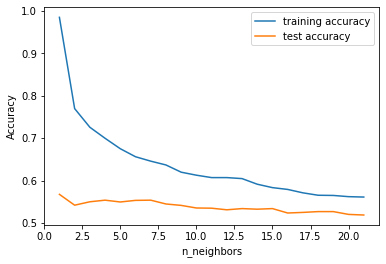

In [66]:
training_accuracy = []
test_accuracy = []

ks = range(1, 22)

for k in ks:
    clf = KNeighborsClassifier(n_neighbors=k)
    clf.fit(X_train, y_train.values.ravel())
    # record training set accuracy
    training_accuracy.append(clf.score(X_train, y_train))
    # record generalization accuracy
    test_accuracy.append(clf.score(X_test, y_test))
    
plt.plot(ks, training_accuracy, label="training accuracy")
plt.plot(ks, test_accuracy, label="test accuracy")
plt.ylabel("Accuracy")
plt.xlabel("n_neighbors")
plt.legend();

It looks like around 15 is where we have a good training and testing accuracy. But we will also use validation set, cross validation, leave one out cross validation and grid_search to find the best hyperparameter.

In [69]:
X_trainval, X_test, y_trainval, y_test = train_test_split(X, Y, random_state=69)
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, random_state=69)

In [70]:
best_score = 0
for num_neighbors in range(1,25):
    # Learn the model with a certain numnber of neighbors
    knn = KNeighborsClassifier(n_neighbors=num_neighbors)
    knn.fit(X_train, y_train)
    
    # Evaluate the model
    score = knn.score(X_val, y_val)
    
    # If improvement, store score and parameter
    if score>best_score:
        best_score = score
        best_num_neighbors = num_neighbors

# Build a model on the combine training and valiation data
knn = KNeighborsClassifier(n_neighbors=best_num_neighbors)
knn.fit(X_trainval, y_trainval)

print("Best number of neighbors found: {}".format(best_num_neighbors))
print("Best score on validation set: {}".format(best_score))
print("Score on training/validation set: {}".format(knn.score(X_trainval, y_trainval)))
print("Score on test set: {}".format(knn.score(X_test, y_test)))

Best number of neighbors found: 1
Best score on validation set: 0.5606060606060606
Score on training/validation set: 0.9804292929292929
Score on test set: 0.6026490066225165


In [72]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import GridSearchCV

In [73]:
X_trainval, X_test, y_trainval, y_test = train_test_split(X, Y, random_state=69)

In [74]:
best_score = 0
for num_neighbors in range(1,25):
    # Set a certain number of neighbors
    knn = KNeighborsClassifier(n_neighbors=num_neighbors)
    
    # Perform cross validation
    scores = cross_val_score(knn, X_trainval, y_trainval, cv=5)
    
    # Compute the mean score
    score = scores.mean()
    
    # If improvement, store score and parameter
    if score>best_score:
        best_score = score
        best_num_neighbors = num_neighbors

# Build a model on the combine training and valiation data
knn = KNeighborsClassifier(n_neighbors=best_num_neighbors)
knn.fit(X_trainval, y_trainval)

print("Best number of neighbors found: {}".format(best_num_neighbors))
print("Best average score: {}".format(best_score))
print("Score on training/validation set: {}".format(knn.score(X_trainval, y_trainval)))
print("Score on test set: {}".format(knn.score(X_test, y_test)))

Best number of neighbors found: 1
Best average score: 0.5874444959409153
Score on training/validation set: 0.9804292929292929
Score on test set: 0.6026490066225165


In [75]:
loo = LeaveOneOut()
best_score = 0
for num_neighbors in range(1,25):
    # Set a certain number of neighbors
    knn = KNeighborsClassifier(n_neighbors=num_neighbors)
    
    # Perform leave-one-out cross ("loo") validation
    scores = cross_val_score(knn, X_trainval, y_trainval, cv=loo) 
    
    # Compute the mean score
    score = scores.mean()
    
    # If improvement, store score and parameter
    if score>best_score:
        best_score = score
        best_num_neighbors = num_neighbors

# Build a model on the combine training and valiation data
knn = KNeighborsClassifier(n_neighbors=best_num_neighbors)
knn.fit(X_trainval, y_trainval)

print("Best number of neighbors found: {}".format(best_num_neighbors))
print("Best average score: {}".format(best_score))
print("Score on training/validation set: {}".format(knn.score(X_trainval, y_trainval)))
print("Score on test set: {}".format(knn.score(X_test, y_test)))

Best number of neighbors found: 1
Best average score: 0.6041666666666666
Score on training/validation set: 0.9804292929292929
Score on test set: 0.6026490066225165


In [76]:
# Fix the parameter space
parameters = {'n_neighbors': range(1,25)}
grid_search = GridSearchCV(KNeighborsClassifier(), parameters, cv=5, return_train_score=True)

In [78]:
# Load the data and divide into train and test
X_train, X_test, y_train, y_test = train_test_split(X, Y, random_state=69)

In [79]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 25)}, return_train_score=True)

In [82]:
print("Test score: {:.2f}".format(grid_search.score(X_test, y_test)))
print("Train score: {:.2f}".format(grid_search.score(X_train, y_train)))
print("Best parameter: {}".format(grid_search.best_params_))
print("Best cross-validation score: {}".format(grid_search.best_score_))
print("Best estimator: {}".format(grid_search.best_estimator_))

Test score: 0.60
Train score: 0.98
Best parameter: {'n_neighbors': 1}
Best cross-validation score: 0.5874444959409153
Best estimator: KNeighborsClassifier(n_neighbors=1)


After various methods to find the best hyperparameter we conclude that the best is when n_neighbors is equal to 1. Train score of 0.98 and test score 0.60.

## 2. Flights Departing from NYC

__You should be able to do this exercise after Lecture 4.__

For this exercise we will be using the famous nycflights13 data which contains the `airlines`, `airports`, `flights`, `planes`, and `weather` datasets. Please see the documentation (`nycflights13.pdf`) for further information.

**(a)** Load all files as pandas dataframes and display the first 5 rows of each dataset.

In [2]:
airlines = pd.read_csv("airlines.csv")
airports = pd.read_csv("airports.csv")
flights = pd.read_csv("flights.csv")
planes = pd.read_csv("planes.csv")
weather = pd.read_csv("weather.csv")

In [3]:
airlines[0:5]

,carrier,name
0,9E,Endeavor Air Inc.
1,AA,American Airlines Inc.
2,AS,Alaska Airlines Inc.
3,B6,JetBlue Airways
4,DL,Delta Air Lines Inc.


In [4]:
airports[0:5]

,faa,name,lat,lon,alt,tz,dst,tzone
0,04G,Lansdowne Airport,41.130472,-80.619583,1044,-5.0,A,America/New_York
1,06A,Moton Field Municipal Airport,32.460572,-85.680028,264,-6.0,A,America/Chicago
2,06C,Schaumburg Regional,41.989341,-88.101243,801,-6.0,A,America/Chicago
3,06N,Randall Airport,41.431912,-74.391561,523,-5.0,A,America/New_York
4,09J,Jekyll Island Airport,31.074472,-81.427778,11,-5.0,A,America/New_York


In [5]:
flights[0:5]

,year,month,day,dep_time,dep_delay,arr_time,arr_delay,carrier,tailnum,flight,origin,dest,air_time,distance,hour,minute
0,2013,1,1,517.0,2.0,830.0,11.0,UA,N14228,1545,EWR,IAH,227.0,1400,5.0,17.0
1,2013,1,1,533.0,4.0,850.0,20.0,UA,N24211,1714,LGA,IAH,227.0,1416,5.0,33.0
2,2013,1,1,542.0,2.0,923.0,33.0,AA,N619AA,1141,JFK,MIA,160.0,1089,5.0,42.0
3,2013,1,1,554.0,-6.0,812.0,-25.0,DL,N668DN,461,LGA,ATL,116.0,762,5.0,54.0
4,2013,1,1,554.0,-4.0,740.0,12.0,UA,N39463,1696,EWR,ORD,150.0,719,5.0,54.0


In [6]:
planes[0:5]

,tailnum,year,type,manufacturer,model,engines,seats,speed,engine
0,N10156,2004.0,Fixed wing multi engine,EMBRAER,EMB-145XR,2,55,NaN,Turbo-fan
1,N102UW,1998.0,Fixed wing multi engine,AIRBUS INDUSTRIE,A320-214,2,182,NaN,Turbo-fan
2,N103US,1999.0,Fixed wing multi engine,AIRBUS INDUSTRIE,A320-214,2,182,NaN,Turbo-fan
3,N104UW,1999.0,Fixed wing multi engine,AIRBUS INDUSTRIE,A320-214,2,182,NaN,Turbo-fan
4,N10575,2002.0,Fixed wing multi engine,EMBRAER,EMB-145LR,2,55,NaN,Turbo-fan


In [7]:
weather[0:5]

,origin,year,month,day,hour,temp,dewp,humid,wind_dir,wind_speed,wind_gust,precip,pressure,visib,time_hour
0,EWR,2013,1,1,0,37.04,21.92,53.97,230.0,10.35702,11.918651,0.0,1013.9,10.0,2013-01-01T00:00:00Z
1,EWR,2013,1,1,1,37.04,21.92,53.97,230.0,13.80936,15.891535,0.0,1013.0,10.0,2013-01-01T01:00:00Z
2,EWR,2013,1,1,2,37.94,21.92,52.09,230.0,12.65858,14.567241,0.0,1012.6,10.0,2013-01-01T02:00:00Z
3,EWR,2013,1,1,3,37.94,23.00,54.51,230.0,13.80936,15.891535,0.0,1012.7,10.0,2013-01-01T03:00:00Z
4,EWR,2013,1,1,4,37.94,24.08,57.04,240.0,14.96014,17.215830,0.0,1012.8,10.0,2013-01-01T04:00:00Z


**(b)** Convert all temperature attributes to degree Celsius. We will be using this in what follows.

In [8]:
weather.isnull().sum()

origin           0
year             0
month            0
day              0
hour             0
temp             1
dewp             1
humid            1
wind_dir       418
wind_speed       3
wind_gust        3
precip           0
pressure      2730
visib            0
time_hour        0
dtype: int64

We see that temperature has one null value so we drop that row.

In [9]:
weather.dropna(subset=['temp'])

,origin,year,month,day,hour,temp,dewp,humid,wind_dir,wind_speed,wind_gust,precip,pressure,visib,time_hour
0,EWR,2013,1,1,0,37.04,21.92,53.97,230.0,10.35702,11.918651,0.0,1013.9,10.0,2013-01-01T00:00:00Z
1,EWR,2013,1,1,1,37.04,21.92,53.97,230.0,13.80936,15.891535,0.0,1013.0,10.0,2013-01-01T01:00:00Z
2,EWR,2013,1,1,2,37.94,21.92,52.09,230.0,12.65858,14.567241,0.0,1012.6,10.0,2013-01-01T02:00:00Z
3,EWR,2013,1,1,3,37.94,23.00,54.51,230.0,13.80936,15.891535,0.0,1012.7,10.0,2013-01-01T03:00:00Z
4,EWR,2013,1,1,4,37.94,24.08,57.04,240.0,14.96014,17.215830,0.0,1012.8,10.0,2013-01-01T04:00:00Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26125,LGA,2013,12,30,19,35.96,19.94,51.78,340.0,13.80936,15.891535,0.0,1017.1,10.0,2013-12-30T19:00:00Z
26126,LGA,2013,12,30,20,33.98,17.06,49.51,330.0,17.26170,19.864419,0.0,1018.8,10.0,2013-12-30T20:00:00Z
26127,LGA,2013,12,30,21,32.00,15.08,49.19,340.0,14.96014,17.215830,0.0,1019.5,10.0,2013-12-30T21:00:00Z
26128,LGA,2013,12,30,22,30.92,12.92,46.74,320.0,17.26170,19.864419,0.0,1019.9,10.0,2013-12-30T22:00:00Z


Making a plot of temperature to check if the temperature is as expected and there is no outlier. That is to check if all rows have valid temperature numbers. There is one temperature between 11000 and 12000 that seems odd.

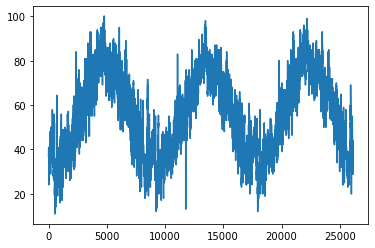

In [10]:
x = np.linspace(start=0, stop=26129, num=26130)
y = weather['temp']
plt.plot(x, y)
plt.show()

In [11]:
weather.loc[(weather['temp']) < 15].loc[11000:12000]

,origin,year,month,day,hour,temp,dewp,humid,wind_dir,wind_speed,wind_gust,precip,pressure,visib,time_hour
11777,JFK,2013,5,9,2,13.1,12.02,95.34,80.0,8.05546,9.270062,0.0,1016.9,10.0,2013-05-09T01:00:00Z


In [12]:
weather[11776:11779]

,origin,year,month,day,hour,temp,dewp,humid,wind_dir,wind_speed,wind_gust,precip,pressure,visib,time_hour
11776,JFK,2013,5,9,1,57.02,48.92,74.27,170.0,11.50780,13.242946,0.0,1017.1,10.0,2013-05-09T00:00:00Z
11777,JFK,2013,5,9,2,13.10,12.02,95.34,80.0,8.05546,9.270062,0.0,1016.9,10.0,2013-05-09T01:00:00Z
11778,JFK,2013,5,9,3,57.20,53.60,87.74,80.0,4.60312,5.297178,0.0,NaN,10.0,2013-05-09T02:00:00Z


There was a drop of 44 degrees in one hour ans then a rise of 44 degrees in the next hour. That seems kinda suspicious. However after researching I found this change can happen so I will keep the value. https://www.wunderground.com/cat6/extreme-short-duration-temperature-changes-us here you can read more about changes in temperature

In [13]:
def convert_to_Celsius(x):
    x = (x - 32) * 5.0/9.0
    return float(x)

In [14]:
weather['temp'] = weather['temp'].apply(convert_to_Celsius)
weather[0:5]

,origin,year,month,day,hour,temp,dewp,humid,wind_dir,wind_speed,wind_gust,precip,pressure,visib,time_hour
0,EWR,2013,1,1,0,2.8,21.92,53.97,230.0,10.35702,11.918651,0.0,1013.9,10.0,2013-01-01T00:00:00Z
1,EWR,2013,1,1,1,2.8,21.92,53.97,230.0,13.80936,15.891535,0.0,1013.0,10.0,2013-01-01T01:00:00Z
2,EWR,2013,1,1,2,3.3,21.92,52.09,230.0,12.65858,14.567241,0.0,1012.6,10.0,2013-01-01T02:00:00Z
3,EWR,2013,1,1,3,3.3,23.00,54.51,230.0,13.80936,15.891535,0.0,1012.7,10.0,2013-01-01T03:00:00Z
4,EWR,2013,1,1,4,3.3,24.08,57.04,240.0,14.96014,17.215830,0.0,1012.8,10.0,2013-01-01T04:00:00Z


**(c)** Using OLS, investigate if flight distance is associated with arrival delay. You should be cautious regarding negative delays.

In [15]:
flights.shape[0]

160754

In [16]:
flights.isnull().sum()

year            0
month           0
day             0
dep_time     2336
dep_delay    2336
arr_time     2479
arr_delay    2827
carrier         0
tailnum      1433
flight          0
origin          0
dest            0
air_time     2827
distance        0
hour         2336
minute       2336
dtype: int64

In [17]:
#There are enough data even if we drop nulls
flights = flights.dropna()

In [18]:
X = flights.loc[:,'distance'].values.reshape(-1,1)
y = flights['arr_delay']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))
print("The coefficents are {} and the intercept is {}".format(ODS.coef_, ODS.intercept_))

R^2 on train data is 0.0005788038321236089 and on test data is 0.00024372663477112422
The coefficents are [-0.00131288] and the intercept is 3.893709244732302


We can see there is no association between flight distance and arrival delay.We can also try with removing negative values

In [19]:
y = flights.loc[(flights['arr_delay'] >= 0)]['arr_delay']
X = flights.loc[(flights['arr_delay'] >= 0)].loc[:,'distance'].values.reshape(-1,1)
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))
print("The coefficents are {} and the intercept is {}".format(ODS.coef_, ODS.intercept_))

R^2 on train data is 3.866442718769569e-06 and on test data is -0.00013829121855768456
The coefficents are [-0.00013177] and the intercept is 35.15555966876695


The negative train score means that the chosen model fits the data really poorly.

**(d)** Using OLS, investigate if departure delay is associated with arrival delay. Again,
   consider what to do with negative delays.

In [20]:
X = flights.loc[:,'dep_delay'].values.reshape(-1,1)
y = flights['arr_delay']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))
print("The coefficents are {} and the intercept is {}".format(ODS.coef_, ODS.intercept_))

R^2 on train data is 0.7965460865263716 and on test data is 0.7906647024883411
The coefficents are [1.01274657] and the intercept is -7.417388777894885


In [21]:
X = flights.loc[(flights['arr_delay'] >= 0) & (flights['dep_delay'] >= 0)].loc[:,'dep_delay'].values.reshape(-1,1)
y = flights.loc[(flights['arr_delay'] >= 0) & (flights['dep_delay'] >= 0)]['arr_delay']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))
print("The coefficents are {} and the intercept is {}".format(ODS.coef_, ODS.intercept_))

R^2 on train data is 0.86842615583126 and on test data is 0.8694226803974141
The coefficents are [0.92914343] and the intercept is 4.675548473699351


It performs well with negative and without negative values. We can conclude that the departure delay and arrival delay are associated.

**(e)** Investigate whether departure delay is associated with weather conditions
   at the origin airport. This includes descriptives, plotting, regression modelling,
   considering missing values etc. For regression, do OLS, Ridge, Lasso, and Elastic Net.
   The analysis should also include seasonality trends as a "weather condition". You could,
   for instance, plot the daily departure delay with the date (or monthly). What are the
   three most important weather conditions when trying to predict departure delays?

Inspired by : https://ethanwicker.com/2021-01-11-multiple-linear-regression-002/

In [22]:
weather.dropna()

,origin,year,month,day,hour,temp,dewp,humid,wind_dir,wind_speed,wind_gust,precip,pressure,visib,time_hour
0,EWR,2013,1,1,0,2.8,21.92,53.97,230.0,10.35702,11.918651,0.0,1013.9,10.0,2013-01-01T00:00:00Z
1,EWR,2013,1,1,1,2.8,21.92,53.97,230.0,13.80936,15.891535,0.0,1013.0,10.0,2013-01-01T01:00:00Z
2,EWR,2013,1,1,2,3.3,21.92,52.09,230.0,12.65858,14.567241,0.0,1012.6,10.0,2013-01-01T02:00:00Z
3,EWR,2013,1,1,3,3.3,23.00,54.51,230.0,13.80936,15.891535,0.0,1012.7,10.0,2013-01-01T03:00:00Z
4,EWR,2013,1,1,4,3.3,24.08,57.04,240.0,14.96014,17.215830,0.0,1012.8,10.0,2013-01-01T04:00:00Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26125,LGA,2013,12,30,19,2.2,19.94,51.78,340.0,13.80936,15.891535,0.0,1017.1,10.0,2013-12-30T19:00:00Z
26126,LGA,2013,12,30,20,1.1,17.06,49.51,330.0,17.26170,19.864419,0.0,1018.8,10.0,2013-12-30T20:00:00Z
26127,LGA,2013,12,30,21,0.0,15.08,49.19,340.0,14.96014,17.215830,0.0,1019.5,10.0,2013-12-30T21:00:00Z
26128,LGA,2013,12,30,22,-0.6,12.92,46.74,320.0,17.26170,19.864419,0.0,1019.9,10.0,2013-12-30T22:00:00Z


In [23]:
flights_weather = flights.merge(right=weather, how='left', on=['origin', 'year', 'month', 'day', 'hour'])  

flights_weather = flights_weather[['dep_delay',
           'origin',
            'year',
            'month',
            'day',
            'hour',
           'temp',
           'dewp',
           'humid',
           'wind_dir',           
           'wind_speed',           
           'wind_gust',
           'precip',
           'pressure',
           'visib']]

flights_weather = flights_weather.dropna()

flights_weather[0:5]

,dep_delay,origin,year,month,day,hour,temp,dewp,humid,wind_dir,wind_speed,wind_gust,precip,pressure,visib
10,-8.0,LGA,2013,1,1,6.0,4.4,26.06,57.33,260.0,13.80936,15.891535,0.0,1011.9,10.0
11,-4.0,EWR,2013,1,1,6.0,3.9,26.06,59.37,270.0,10.35702,11.918651,0.0,1012.0,10.0
12,-4.0,JFK,2013,1,1,6.0,3.9,26.06,59.37,260.0,12.65858,14.567241,0.0,1012.6,10.0
13,0.0,EWR,2013,1,1,6.0,3.9,26.06,59.37,270.0,10.35702,11.918651,0.0,1012.0,10.0
14,11.0,JFK,2013,1,1,6.0,3.9,26.06,59.37,260.0,12.65858,14.567241,0.0,1012.6,10.0


In [24]:
dep_weather = flights_weather[['dep_delay',
           'temp',
           'dewp',
           'humid',
           'wind_dir',           
           'wind_speed',           
           'wind_gust',
           'precip',
           'pressure',
           'visib']]

Text(0.5, 1, 'Flights: Pair Plot')

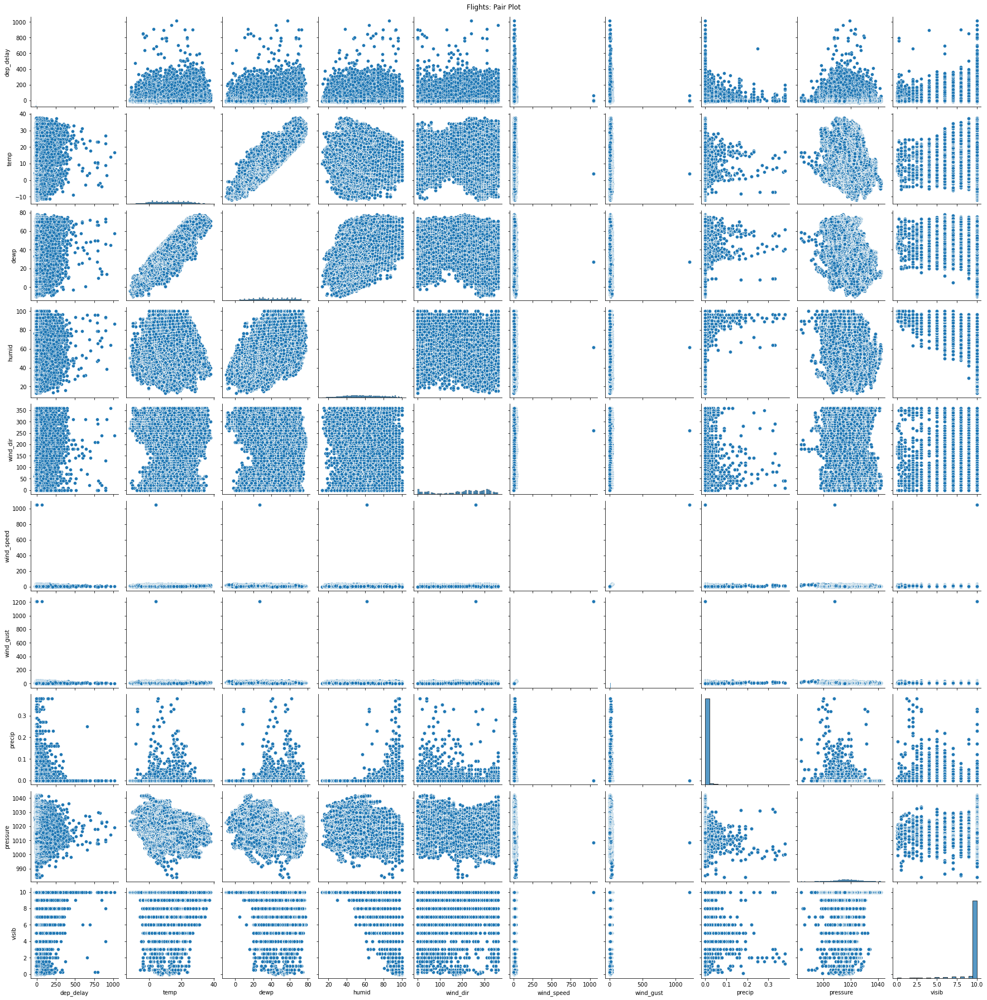

In [25]:
# Creating pair plot
sns.pairplot(dep_weather)\
    .fig.suptitle('Flights: Pair Plot', y=1)

It looks like visibility and departure delay are left skewed. Departure and precipitation is right skewed. There is symmetrical distribution with pressure and departure. For the others there is no clear correlation. Wind speed and wind gust have an outlier which we will remove.

Text(0.5, 1, '10,000 Flights: Pair Plot')

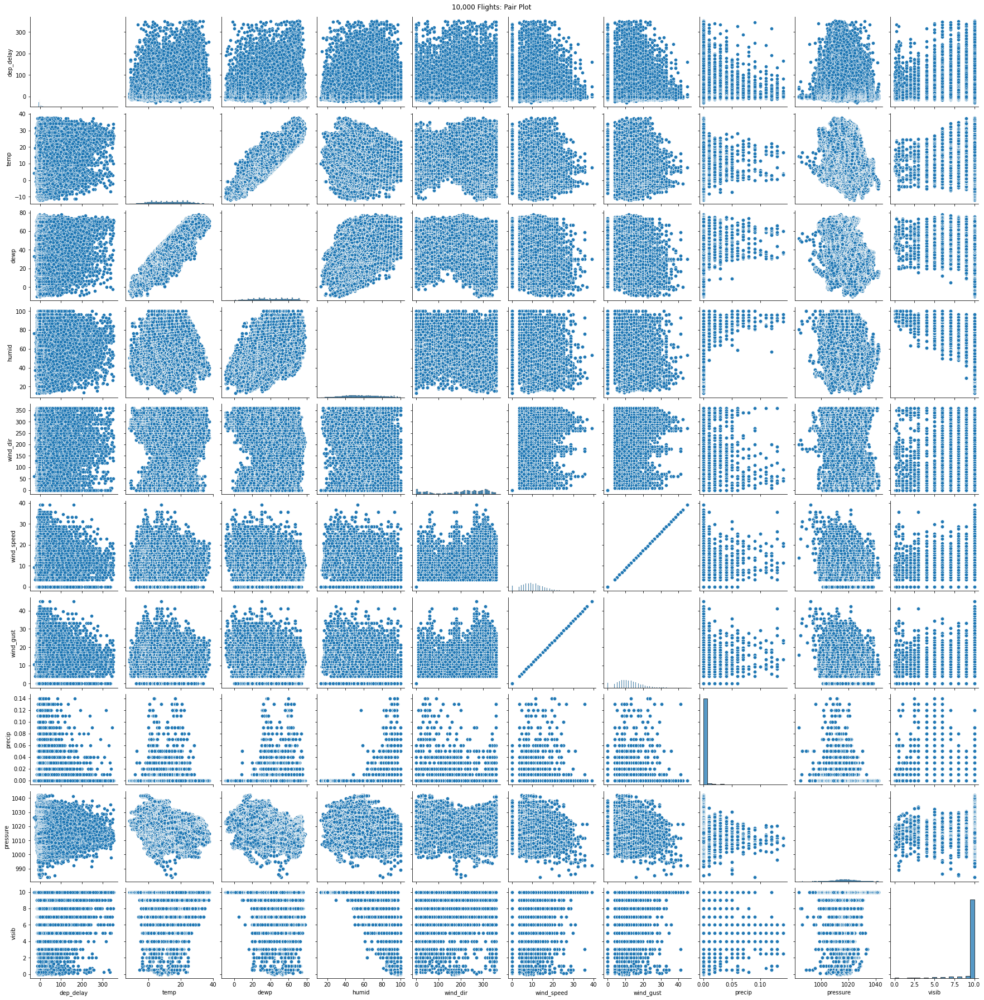

In [26]:
dep_weather_filtered = dep_weather[(np.abs(stats.zscore(dep_weather)) < 10).all(axis=1)]
sns.pairplot(dep_weather_filtered)\
    .fig.suptitle('10,000 Flights: Pair Plot', y=1)

Temp, dewp and humid have kinda the same association with dep_delay. The same goes for wind_speed and wind_gust which seem to be right skewed. 

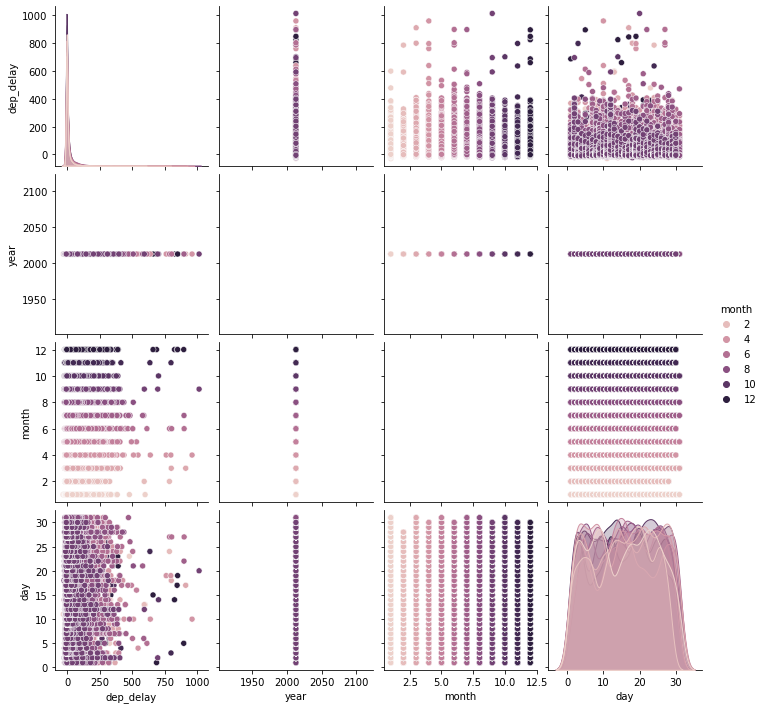

In [27]:
sns.pairplot(flights_weather, vars = ['dep_delay', 'year', 'month', 'day'],  hue = 'month')

We can't see anything from the above plot so we will group by month

Text(0.5, 1, 'Pair Plot of Average Per Month Values')

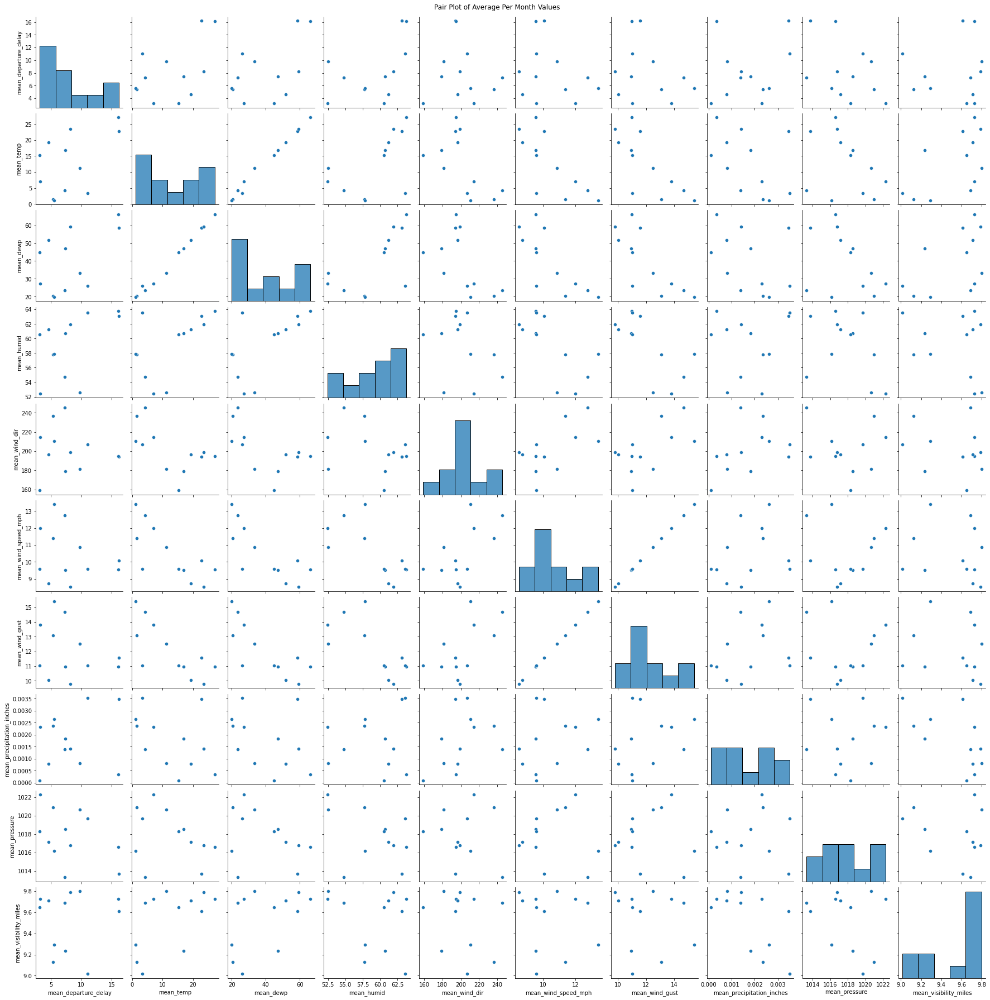

In [28]:
flights_weather_per_month_all_values = \
    flights_weather\
    .groupby(['month'])\
    .agg(mean_departure_delay=('dep_delay', 'mean'),
         mean_temp=('temp', 'mean'),
         mean_dewp=('dewp', 'mean'),
         mean_humid=('humid', 'mean'),
         mean_wind_dir=('wind_dir', 'mean'),
         mean_wind_speed_mph=('wind_speed', 'mean'),
         mean_wind_gust=('wind_gust', 'mean'),
         mean_precipitation_inches=('precip', 'mean'),
         mean_pressure=('pressure', 'mean'),
         mean_visibility_miles=('visib', 'mean'))\
    .reset_index()

flights_weather_per_month = flights_weather_per_month_all_values[['mean_departure_delay', 'mean_temp', 'mean_dewp', 'mean_humid', 'mean_wind_dir', 'mean_wind_speed_mph', 'mean_wind_gust', 'mean_precipitation_inches', 'mean_pressure', 'mean_visibility_miles']]

sns.pairplot(flights_weather_per_month)\
    .fig.suptitle('Pair Plot of Average Per Month Values', y=1)

Text(0.5, 1, 'Pair Plot of Average Per Month Values')

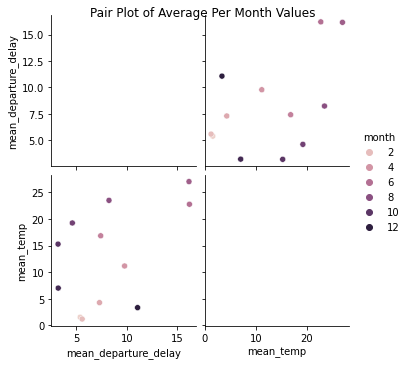

In [29]:
sns.pairplot(flights_weather_per_month_all_values, vars = ['mean_departure_delay', 'mean_temp'],  hue = 'month')\
    .fig.suptitle('Pair Plot of Average Per Month Values', y=1)

By taking one of the weather conditions we can see that some months have an average higher departure delay than others. 

Text(0, 0.5, 'Arrival delay')

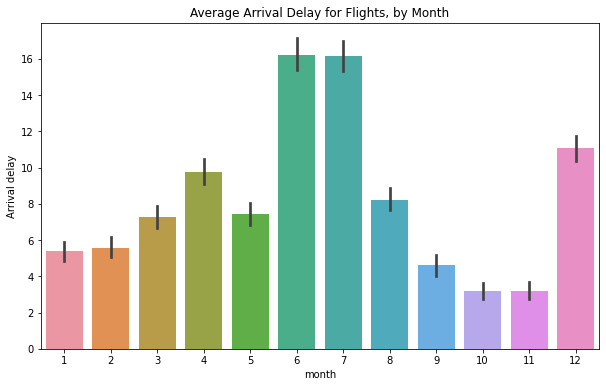

In [30]:
# Set the width and height of the figure
plt.figure(figsize=(10,6))

# Add title
plt.title("Average Arrival Delay for Flights, by Month")

# Bar chart showing average arrival delay by month
sns.barplot(x=flights_weather['month'], y=flights_weather['dep_delay'])

# Add label for vertical axis
plt.ylabel("Arrival delay")

We can see there is correlation of month with departure delay. The holiday months, June, July, December, have the most delays. 

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5]),
 [Text(0.5, 0, 'Departure Delay'),
  Text(1.5, 0, 'Temp'),
  Text(2.5, 0, 'Dewp'),
  Text(3.5, 0, 'Humid'),
  Text(4.5, 0, 'Wind Dir'),
  Text(5.5, 0, 'Wind Speed (MPH)'),
  Text(6.5, 0, 'Wind Gust'),
  Text(7.5, 0, 'Precipitation (in)'),
  Text(8.5, 0, 'Pressure'),
  Text(9.5, 0, 'Visibility (miles)')])

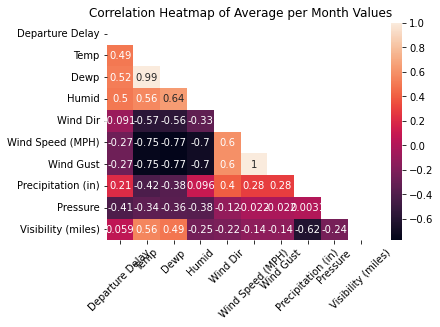

In [31]:
labels =['Departure Delay', 'Temp', 'Dewp', 'Humid', 'Wind Dir', 'Wind Speed (MPH)', 'Wind Gust', 'Precipitation (in)', 'Pressure','Visibility (miles)']

sns\
    .heatmap(flights_weather_per_month.corr(),
             mask=np.triu(np.ones_like(flights_weather_per_month.corr())),
             annot=True,
             xticklabels=labels,
             yticklabels=labels)\
    .set_title('Correlation Heatmap of Average per Month Values')

plt.xticks(rotation=45)

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5]),
 [Text(0.5, 0, 'Departure Delay'),
  Text(1.5, 0, 'Temp'),
  Text(2.5, 0, 'Dewp'),
  Text(3.5, 0, 'Humid'),
  Text(4.5, 0, 'Wind Dir'),
  Text(5.5, 0, 'Wind Speed (MPH)'),
  Text(6.5, 0, 'Wind Gust'),
  Text(7.5, 0, 'Precipitation (in)'),
  Text(8.5, 0, 'Pressure'),
  Text(9.5, 0, 'Visibility (miles)')])

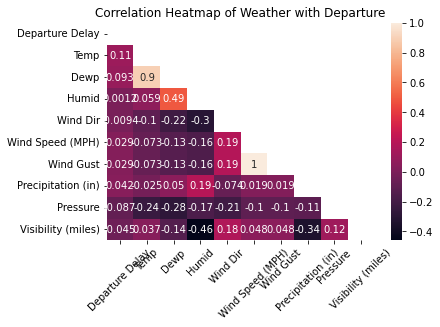

In [32]:
labels =['Departure Delay', 'Temp', 'Dewp', 'Humid', 'Wind Dir', 'Wind Speed (MPH)', 'Wind Gust', 'Precipitation (in)', 'Pressure','Visibility (miles)']

sns\
    .heatmap(dep_weather.corr(),
             mask=np.triu(np.ones_like(dep_weather.corr())),
             annot=True,
             xticklabels=labels,
             yticklabels=labels)\
    .set_title('Correlation Heatmap of Weather with Departure')

plt.xticks(rotation=45)

We can see there is no correlation between weather and departure delay but there is between month and departure delay.

In [33]:
X = flights_weather[['temp', 'dewp', 'humid', 'wind_dir', 'wind_speed', 'wind_gust', 'precip', 'pressure', 'visib']]
y = flights_weather['dep_delay']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))
print("The coefficents are {} and the intercept is {}".format(ODS.coef_, ODS.intercept_))

R^2 on train data is 0.01967853112409046 and on test data is 0.02117250042533325
The coefficents are [ 8.06402188e-02  1.46018746e-01 -1.57886822e-01 -7.66749759e-03
  4.12658066e-02  4.74878649e-02  4.39607999e+01 -3.01225020e-01
 -1.25684926e+00] and the intercept is 329.65473748113675


alhpa = 0.012045035402587835
R^2 on train data is 0.019665436108464718 and on test data is 0.021165829745920184


temp           0.202622
dewp           0.071638
humid         -0.118865
wind_dir      -0.007413
wind_speed     0.048009
wind_gust      0.041718
precip        43.652773
pressure      -0.296228
visib         -1.196673
dtype: float64

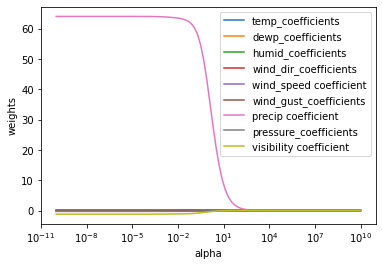

In [34]:
alphas = 10**np.linspace(-10, 10, 100)

ridge = Ridge(normalize = True)
coefs = []

for a in alphas:
    ridge.set_params(alpha = a)
    ridge.fit(X, y)
    coefs.append(ridge.coef_)
    
np.shape(coefs)
temp_coefficients = [coef[0] for coef in coefs]
dewp_coefficients = [coef[1] for coef in coefs]
humid_coefficients = [coef[2] for coef in coefs]
wind_dir_coefficients = [coef[3] for coef in coefs]
wind_speed_coefficients = [coef[4] for coef in coefs]
wind_gust_coefficients = [coef[5] for coef in coefs]
precip_coefficients = [coef[6] for coef in coefs]
pressure_coefficients = [coef[7] for coef in coefs]
visibility_coefficients = [coef[8] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, temp_coefficients, label="temp_coefficients")
ax.plot(alphas, dewp_coefficients, label="dewp_coefficients")
ax.plot(alphas, humid_coefficients, label="humid_coefficients")
ax.plot(alphas, wind_dir_coefficients, label="wind_dir_coefficients")
ax.plot(alphas, wind_speed_coefficients, label="wind_speed coefficient")
ax.plot(alphas, wind_gust_coefficients, label="wind_gust_coefficients")
ax.plot(alphas, precip_coefficients, label="precip coefficient")
ax.plot(alphas, pressure_coefficients, label="pressure_coefficients")
ax.plot(alphas, visibility_coefficients, label="visibility coefficient")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')
    
ridgecv = RidgeCV(alphas = alphas, normalize = True)
ridgecv.fit(X_train, y_train)
ridgecv.alpha_

print("alhpa = {}".format(ridgecv.alpha_))
print("R^2 on train data is {} and on test data is {}".format(ridgecv.score(X_train, y_train), 
                                                              ridgecv.score(X_test,y_test)))

pd.Series(ridgecv.coef_, index=X.columns)

R^2 on train data is 0.01967750020125647 and on test data is 0.021172902748790023


temp           0.118772
dewp           0.122971
humid         -0.146315
wind_dir      -0.007601
wind_speed     0.095692
wind_gust      0.000000
precip        43.675337
pressure      -0.300401
visib         -1.243164
dtype: float64

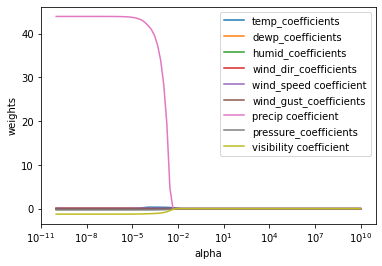

In [35]:
lasso = Lasso(max_iter = 10000, normalize = True)
coefs = []

for a in alphas:
    lasso.set_params(alpha = a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    
np.shape(coefs)
temp_coefficients = [coef[0] for coef in coefs]
dewp_coefficients = [coef[1] for coef in coefs]
humid_coefficients = [coef[2] for coef in coefs]
wind_dir_coefficients = [coef[3] for coef in coefs]
wind_speed_coefficients = [coef[4] for coef in coefs]
wind_gust_coefficients = [coef[5] for coef in coefs]
precip_coefficients = [coef[6] for coef in coefs]
pressure_coefficients = [coef[7] for coef in coefs]
visibility_coefficients = [coef[8] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, temp_coefficients, label="temp_coefficients")
ax.plot(alphas, dewp_coefficients, label="dewp_coefficients")
ax.plot(alphas, humid_coefficients, label="humid_coefficients")
ax.plot(alphas, wind_dir_coefficients, label="wind_dir_coefficients")
ax.plot(alphas, wind_speed_coefficients, label="wind_speed coefficient")
ax.plot(alphas, wind_gust_coefficients, label="wind_gust_coefficients")
ax.plot(alphas, precip_coefficients, label="precip coefficient")
ax.plot(alphas, pressure_coefficients, label="pressure_coefficients")
ax.plot(alphas, visibility_coefficients, label="visibility coefficient")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

lassocv = LassoCV(alphas = None, cv = 10, max_iter = 100000, normalize = True)
lassocv.fit(X_train, y_train)

lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(lassocv.score(X_train, y_train), 
                                                              lassocv.score(X_test,y_test)))

# Some of the coefficients are now reduced to exactly zero.
pd.Series(lasso.coef_, index=X.columns)

C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40676767.151123665, tolerance: 8302.391027292568
  model = cd_fast.enet_coordinate_descent(
C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40665821.867731094, tolerance: 8302.391027292568
  model = cd_fast.enet_coordinate_descent(
C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40648223.207424775, tolerance: 8302.391027292568
  model = cd_fast.enet_coordinate_descent(
C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWar

R^2 on train data is 0.015874909884103006 and on test data is 0.01712278428903602


temp           0.133920
dewp           0.046664
humid         -0.029992
wind_dir      -0.002090
wind_speed     0.035557
wind_gust      0.030898
precip        31.342928
pressure      -0.159276
visib         -0.476551
dtype: float64

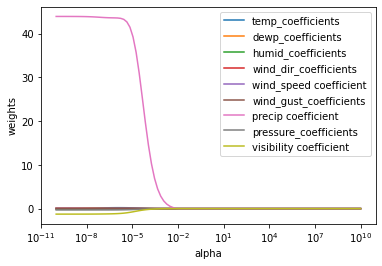

In [36]:
e_net = ElasticNet(max_iter = 1000, normalize = True)
coefs = []

for a in alphas:
    e_net.set_params(alpha = a)
    e_net.fit(X_train, y_train)
    coefs.append(e_net.coef_)
    
np.shape(coefs)
temp_coefficients = [coef[0] for coef in coefs]
dewp_coefficients = [coef[1] for coef in coefs]
humid_coefficients = [coef[2] for coef in coefs]
wind_dir_coefficients = [coef[3] for coef in coefs]
wind_speed_coefficients = [coef[4] for coef in coefs]
wind_gust_coefficients = [coef[5] for coef in coefs]
precip_coefficients = [coef[6] for coef in coefs]
pressure_coefficients = [coef[7] for coef in coefs]
visibility_coefficients = [coef[8] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, temp_coefficients, label="temp_coefficients")
ax.plot(alphas, dewp_coefficients, label="dewp_coefficients")
ax.plot(alphas, humid_coefficients, label="humid_coefficients")
ax.plot(alphas, wind_dir_coefficients, label="wind_dir_coefficients")
ax.plot(alphas, wind_speed_coefficients, label="wind_speed coefficient")
ax.plot(alphas, wind_gust_coefficients, label="wind_gust_coefficients")
ax.plot(alphas, precip_coefficients, label="precip coefficient")
ax.plot(alphas, pressure_coefficients, label="pressure_coefficients")
ax.plot(alphas, visibility_coefficients, label="visibility coefficient")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

e_netCV = ElasticNetCV(alphas = None, max_iter = 1000, normalize = True)
e_netCV.fit(X_train, y_train)

e_net.set_params(alpha=e_netCV.alpha_)
e_net.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(e_netCV.score(X_train, y_train), 
                                                              e_netCV.score(X_test,y_test)))

# Some of the coefficients are now reduced to exactly zero.
pd.Series(e_net.coef_, index=X.columns)

Most important weather conditions seem to be precipitation, visibility, pressure in that order. 

**(f)** Is the age of the plane associated with delay? Do OLS, Ridge, Lasso, and Elastic Net.

In [37]:
flights_planes = \
    flights \
    .merge(right=planes, how='left', on=['tailnum'])

departure_delay_year_plane = flights_planes[['dep_delay',
           'year_y']]

departure_delay_year_plane = departure_delay_year_plane.dropna()

In [38]:
X = departure_delay_year_plane.loc[:,'year_y'].values.reshape(-1,1)
y = departure_delay_year_plane['dep_delay']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))
print("The coefficents are {} and the intercept is {}".format(ODS.coef_, ODS.intercept_))

R^2 on train data is 0.0006183869264494435 and on test data is 0.0004215142146858364
The coefficents are [-0.13256146] and the intercept is 274.56102791480754


R^2 on train data is 0.0006178438902513239 and on test data is 0.00042674732857950204


array([-0.12863319])

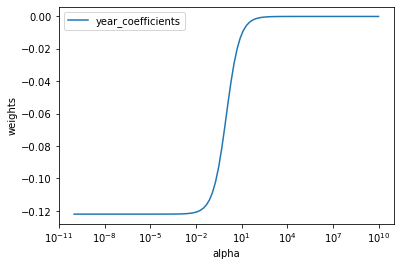

In [39]:
alphas = 10**np.linspace(-10, 10, 100)

ridge = Ridge(normalize = True)
coefs = []

for a in alphas:
    ridge.set_params(alpha = a)
    ridge.fit(X, y)
    coefs.append(ridge.coef_)
    
np.shape(coefs)
year_coefficients = [coef[0] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, year_coefficients, label="year_coefficients")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

ridgecv = RidgeCV(alphas = alphas, normalize = True)
ridgecv.fit(X_train, y_train)
ridgecv.alpha_

print("R^2 on train data is {} and on test data is {}".format(ridgecv.score(X_train, y_train), 
                                                              ridgecv.score(X_test,y_test)))

ridgecv.coef_

R^2 on train data is 0.0006183825638521601 and on test data is 0.0004220274558469628


array([-0.13220937])

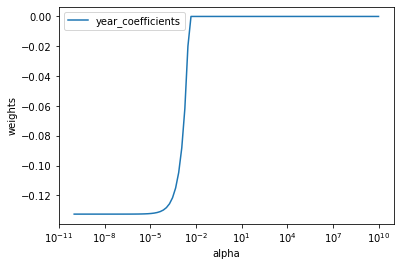

In [40]:
lasso = Lasso(max_iter = 10000, normalize = True)
coefs = []

for a in alphas:
    lasso.set_params(alpha = a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    
np.shape(coefs)
year_coefficients = [coef[0] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, year_coefficients, label="year_coefficients")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

lassocv = LassoCV(alphas = None, cv = 10, max_iter = 100000, normalize = True)
lassocv.fit(X_train, y_train)

lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(lassocv.score(X_train, y_train), 
                                                              lassocv.score(X_test,y_test)))

lasso.coef_

R^2 on train data is 0.000596156135786674 and on test data is 0.0004362909024113737


array([-0.10742729])

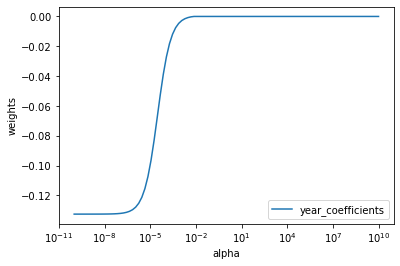

In [41]:
e_net = ElasticNet(max_iter = 1000, normalize = True)
coefs = []

for a in alphas:
    e_net.set_params(alpha = a)
    e_net.fit(X_train, y_train)
    coefs.append(e_net.coef_)
    
np.shape(coefs)
year_coefficients = [coef[0] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, year_coefficients, label="year_coefficients")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

e_netCV = ElasticNetCV(alphas = None, max_iter = 1000, normalize = True)
e_netCV.fit(X_train, y_train)

e_net.set_params(alpha=e_netCV.alpha_)
e_net.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(e_netCV.score(X_train, y_train), 
                                                              e_netCV.score(X_test,y_test)))

e_net.coef_

The age of the plane is not associated with the delay.

**(g)** Do a principal component analysis of the weather at JFK using the following columns:
   temp, dewp, humid, wind_dir, wind_speed, precip, visib.
   How many principal components should be used to capture the variability in the weather data?

In [42]:
weather_JFK = weather.origin == 'JFK'
weather_origin_JFK = weather[weather_JFK]
weather_origin_JFK

,origin,year,month,day,hour,temp,dewp,humid,wind_dir,wind_speed,wind_gust,precip,pressure,visib,time_hour
8708,JFK,2013,1,1,0,3.3,23.00,54.51,240.0,16.11092,18.540125,0.0,1014.4,10.0,2013-01-01T00:00:00Z
8709,JFK,2013,1,1,1,3.3,24.08,57.04,250.0,17.26170,19.864419,0.0,1013.5,10.0,2013-01-01T01:00:00Z
8710,JFK,2013,1,1,2,3.9,24.98,56.77,240.0,19.56326,22.513008,0.0,1013.0,10.0,2013-01-01T02:00:00Z
8711,JFK,2013,1,1,3,3.9,26.06,59.37,240.0,18.41248,21.188714,0.0,1013.2,10.0,2013-01-01T03:00:00Z
8712,JFK,2013,1,1,4,3.9,24.98,56.77,260.0,14.96014,17.215830,0.0,1013.2,10.0,2013-01-01T04:00:00Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17414,JFK,2013,12,30,19,3.3,21.02,50.14,330.0,16.11092,18.540125,0.0,1017.4,10.0,2013-12-30T19:00:00Z
17415,JFK,2013,12,30,20,2.2,17.96,47.57,340.0,17.26170,19.864419,0.0,1018.7,10.0,2013-12-30T20:00:00Z
17416,JFK,2013,12,30,21,1.1,15.98,47.25,330.0,19.56326,22.513008,0.0,1019.5,10.0,2013-12-30T21:00:00Z
17417,JFK,2013,12,30,22,0.0,12.92,44.74,320.0,13.80936,15.891535,0.0,1020.1,10.0,2013-12-30T22:00:00Z


In [43]:
weather_origin_JFK = weather_origin_JFK.dropna()

weather_JFK = weather_origin_JFK[['temp', 'dewp', 'humid', 'wind_dir', 'wind_speed', 'precip', 'visib']]

weather_JFK[0:5]

,temp,dewp,humid,wind_dir,wind_speed,precip,visib
8708,3.3,23.00,54.51,240.0,16.11092,0.0,10.0
8709,3.3,24.08,57.04,250.0,17.26170,0.0,10.0
8710,3.9,24.98,56.77,240.0,19.56326,0.0,10.0
8711,3.9,26.06,59.37,240.0,18.41248,0.0,10.0
8712,3.9,24.98,56.77,260.0,14.96014,0.0,10.0


In [44]:
X = weather_JFK
X_s = preprocessing.StandardScaler().fit_transform(X)
pca7 = decomposition.PCA(n_components=None)
res7 = pca7.fit_transform(X_s)
pca7.explained_variance_ratio_

array([3.78800411e-01, 2.04980335e-01, 1.62167222e-01, 1.05424117e-01,
       8.56196982e-02, 6.26518431e-02, 3.56374562e-04])

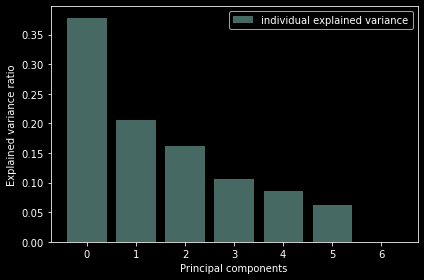

In [45]:
with plt.style.context('dark_background'):
    plt.figure(figsize=(6, 4))

    plt.bar(range(7), pca7.explained_variance_ratio_, alpha=0.5, align='center',
            label='individual explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

How many components we choose is based on what we want to do. If we want to visualize then 2 or 3. If we want an exact amount of variance to be kept then we can specify that. The first component constitutes 37% of the variance. Second 21%, third 17%, fourth 12% and fifth 9%. The sixth is 7% and the seventh is 0%. So we can drop the seventh. As the sixth contains less than 10% of the variance we can also drop it.

In [46]:
#if we want 85% of variance
pca85 = decomposition.PCA(n_components=0.85)
res85 = pca85.fit_transform(X_s)
pca85.explained_variance_ratio_

array([0.37880041, 0.20498033, 0.16216722, 0.10542412])

Below we will visualize using 2 and 3 components.

In [47]:
pca2 = decomposition.PCA(n_components=2)
res2 = pca2.fit_transform(X_s)
pca2.explained_variance_ratio_

array([0.37880041, 0.20498033])

In [48]:
fig = px.scatter(res2, x=0, y=1)
fig.show()

In [49]:
pca3 = decomposition.PCA(n_components=3)
res3 = pca3.fit_transform(X_s)

total_var = pca3.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    res3, x=0, y=1, z=2,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

**(h)** Build regression models (OLS, Ridge, Lasso, and Elastic Net) that associates
   an airports lattitude with weather conditions (temp, dewp, humid, wind_dir, wind_speed,
   precip, visib). Remove all but the three most significant whether conditions and redo
   the analysis.

In [50]:
airport_weather= pd.merge(airports,weather, how='left',left_on=['faa'],right_on=['origin']).dropna()

airport_weather = airport_weather[['lat', 'temp', 'dewp', 'humid', 'wind_dir', 'wind_speed', 'wind_gust', 'precip', 'pressure','visib']]

In [51]:
X = airport_weather.iloc[:, 1:]
y = airport_weather['lat']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))
print("The coefficents are {} and the intercept is {}".format(ODS.coef_, ODS.intercept_))

R^2 on train data is 0.051437879911816364 and on test data is 0.010399155537040183
The coefficents are [-7.14879698e-03  4.30467845e-03 -2.76286897e-03 -3.33726325e-05
 -5.10367311e-04 -5.87320494e-04  5.11994757e-02 -7.92014245e-04
 -2.64850115e-03] and the intercept is 41.636707046569676


R^2 on train data is 0.05143734881500339 and on test data is 0.01044683558186843


temp         -0.007100
dewp          0.004275
humid        -0.002749
wind_dir     -0.000033
wind_speed   -0.000593
wind_gust    -0.000515
precip        0.051072
pressure     -0.000792
visib        -0.002635
dtype: float64

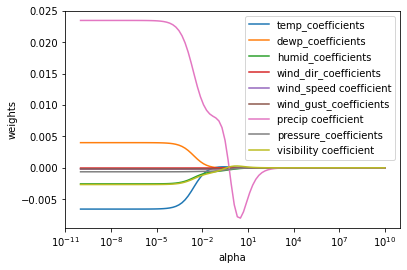

In [52]:
alphas = 10**np.linspace(-10, 10, 100)

ridge = Ridge(normalize = True)
coefs = []

for a in alphas:
    ridge.set_params(alpha = a)
    ridge.fit(X, y)
    coefs.append(ridge.coef_)
    
np.shape(coefs)
temp_coefficients = [coef[0] for coef in coefs]
dewp_coefficients = [coef[1] for coef in coefs]
humid_coefficients = [coef[2] for coef in coefs]
wind_dir_coefficients = [coef[3] for coef in coefs]
wind_speed_coefficients = [coef[4] for coef in coefs]
wind_gust_coefficients = [coef[5] for coef in coefs]
precip_coefficients = [coef[6] for coef in coefs]
pressure_coefficients = [coef[7] for coef in coefs]
visibility_coefficients = [coef[8] for coef in coefs]


ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, temp_coefficients, label="temp_coefficients")
ax.plot(alphas, dewp_coefficients, label="dewp_coefficients")
ax.plot(alphas, humid_coefficients, label="humid_coefficients")
ax.plot(alphas, wind_dir_coefficients, label="wind_dir_coefficients")
ax.plot(alphas, wind_speed_coefficients, label="wind_speed coefficient")
ax.plot(alphas, wind_gust_coefficients, label="wind_gust_coefficients")
ax.plot(alphas, precip_coefficients, label="precip coefficient")
ax.plot(alphas, pressure_coefficients, label="pressure_coefficients")
ax.plot(alphas, visibility_coefficients, label="visibility coefficient")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')
    
ridgecv = RidgeCV(alphas = alphas, normalize = True)
ridgecv.fit(X_train, y_train)
ridgecv.alpha_

print("R^2 on train data is {} and on test data is {}".format(ridgecv.score(X_train, y_train), 
                                                              ridgecv.score(X_test,y_test)))

pd.Series(ridgecv.coef_, index=X.columns)

R^2 on train data is 0.051415826744470094 and on test data is 0.010842175501123874


temp         -6.833383e-03
dewp          4.116562e-03
humid        -2.671611e-03
wind_dir     -3.320128e-05
wind_speed   -1.180612e-03
wind_gust    -6.823088e-17
precip        4.989442e-02
pressure     -7.868953e-04
visib        -2.558555e-03
dtype: float64

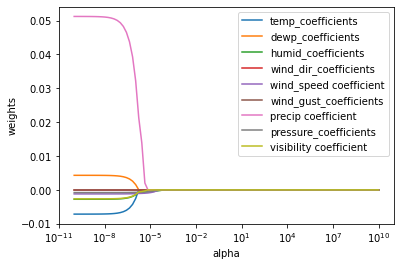

In [53]:
lasso = Lasso(max_iter = 10000, normalize = True)
coefs = []

for a in alphas:
    lasso.set_params(alpha = a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    
np.shape(coefs)
temp_coefficients = [coef[0] for coef in coefs]
dewp_coefficients = [coef[1] for coef in coefs]
humid_coefficients = [coef[2] for coef in coefs]
wind_dir_coefficients = [coef[3] for coef in coefs]
wind_speed_coefficients = [coef[4] for coef in coefs]
wind_gust_coefficients = [coef[5] for coef in coefs]
precip_coefficients = [coef[6] for coef in coefs]
pressure_coefficients = [coef[7] for coef in coefs]
visibility_coefficients = [coef[8] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, temp_coefficients, label="temp_coefficients")
ax.plot(alphas, dewp_coefficients, label="dewp_coefficients")
ax.plot(alphas, humid_coefficients, label="humid_coefficients")
ax.plot(alphas, wind_dir_coefficients, label="wind_dir_coefficients")
ax.plot(alphas, wind_speed_coefficients, label="wind_speed coefficient")
ax.plot(alphas, wind_gust_coefficients, label="wind_gust_coefficients")
ax.plot(alphas, precip_coefficients, label="precip coefficient")
ax.plot(alphas, pressure_coefficients, label="pressure_coefficients")
ax.plot(alphas, visibility_coefficients, label="visibility coefficient")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

lassocv = LassoCV(alphas = None, cv = 10, max_iter = 100000, normalize = True)
lassocv.fit(X_train, y_train)

lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(lassocv.score(X_train, y_train), 
                                                              lassocv.score(X_test,y_test)))


# Some of the coefficients are now reduced to exactly zero.
pd.Series(lasso.coef_, index=X.columns)

C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.552951041630486, tolerance: 0.003721960803501984

C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.49424211708786, tolerance: 0.003721960803501984

C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.401200457240357, tolerance: 0.003721960803501984

C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.25415884108

R^2 on train data is 0.05050682914630389 and on test data is 0.011638733595958684


C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0262078233656311, tolerance: 0.003721960803501984

C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:530: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0262078233656311, tolerance: 0.003721960803501984



temp         -0.005092
dewp          0.003077
humid        -0.002172
wind_dir     -0.000033
wind_speed   -0.000685
wind_gust    -0.000414
precip        0.045360
pressure     -0.000769
visib        -0.002089
dtype: float64

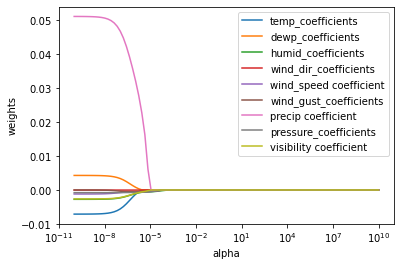

In [54]:
e_net = ElasticNet(max_iter = 1000, normalize = True)
coefs = []

for a in alphas:
    e_net.set_params(alpha = a)
    e_net.fit(X_train, y_train)
    coefs.append(e_net.coef_)
    
np.shape(coefs)
temp_coefficients = [coef[0] for coef in coefs]
dewp_coefficients = [coef[1] for coef in coefs]
humid_coefficients = [coef[2] for coef in coefs]
wind_dir_coefficients = [coef[3] for coef in coefs]
wind_speed_coefficients = [coef[4] for coef in coefs]
wind_gust_coefficients = [coef[5] for coef in coefs]
precip_coefficients = [coef[6] for coef in coefs]
pressure_coefficients = [coef[7] for coef in coefs]
visibility_coefficients = [coef[8] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, temp_coefficients, label="temp_coefficients")
ax.plot(alphas, dewp_coefficients, label="dewp_coefficients")
ax.plot(alphas, humid_coefficients, label="humid_coefficients")
ax.plot(alphas, wind_dir_coefficients, label="wind_dir_coefficients")
ax.plot(alphas, wind_speed_coefficients, label="wind_speed coefficient")
ax.plot(alphas, wind_gust_coefficients, label="wind_gust_coefficients")
ax.plot(alphas, precip_coefficients, label="precip coefficient")
ax.plot(alphas, pressure_coefficients, label="pressure_coefficients")
ax.plot(alphas, visibility_coefficients, label="visibility coefficient")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

e_netCV = ElasticNetCV(alphas = None, max_iter = 1000, normalize = True)
e_netCV.fit(X_train, y_train)

e_net.set_params(alpha=e_netCV.alpha_)
e_net.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(e_netCV.score(X_train, y_train), 
                                                              e_netCV.score(X_test,y_test)))

# Some of the coefficients are now reduced to exactly zero.
pd.Series(e_net.coef_, index=X.columns)

The most important weather conditions seem to be precip, dewp, temp.

In [55]:
X = airport_weather[['precip', 'dewp', 'temp']]
y = airport_weather['lat']

X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)

ODS = LinearRegression()
ODS.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

print("The coefficents are {} and the intercept is {}".format(ODS.coef_, ODS.intercept_))

R^2 on train data is 0.017895237488415483 and on test data is 0.020848861196701374
The coefficents are [ 0.01230641 -0.0008765   0.00173284] and the intercept is 40.71551336227079


R^2 on train data is 0.017894202688071625 and on test data is 0.020823890946998547


precip    0.011635
dewp     -0.000870
temp      0.001720
dtype: float64

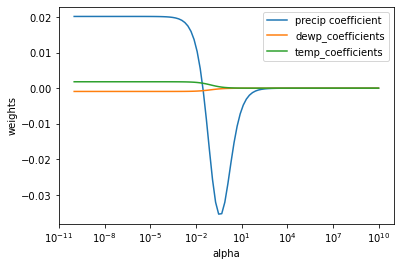

In [56]:
alphas = 10**np.linspace(-10, 10, 100)

ridge = Ridge(normalize = True)
coefs = []

for a in alphas:
    ridge.set_params(alpha = a)
    ridge.fit(X, y)
    coefs.append(ridge.coef_)
    
np.shape(coefs)
precip_coefficients = [coef[0] for coef in coefs]
dewp_coefficients = [coef[1] for coef in coefs]
temp_coefficients = [coef[2] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, precip_coefficients, label="precip coefficient")
ax.plot(alphas, dewp_coefficients, label="dewp_coefficients")
ax.plot(alphas, temp_coefficients, label="temp_coefficients")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')
    
ridgecv = RidgeCV(alphas = alphas, normalize = True)
ridgecv.fit(X_train, y_train)
ridgecv.alpha_

print("R^2 on train data is {} and on test data is {}".format(ridgecv.score(X_train, y_train), 
                                                              ridgecv.score(X_test,y_test)))

pd.Series(ridgecv.coef_, index=X.columns)

R^2 on train data is 0.01786066308749068 and on test data is 0.02067262591951069


precip    0.003588
dewp     -0.000838
temp      0.001658
dtype: float64

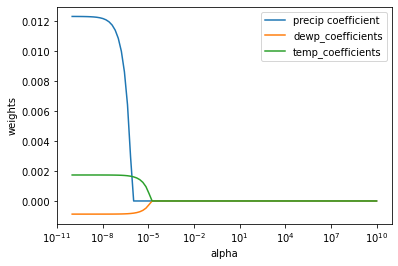

In [57]:
lasso = Lasso(max_iter = 10000, normalize = True)
coefs = []

for a in alphas:
    lasso.set_params(alpha = a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    
np.shape(coefs)
precip_coefficients = [coef[0] for coef in coefs]
dewp_coefficients = [coef[1] for coef in coefs]
temp_coefficients = [coef[2] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, precip_coefficients, label="precip coefficient")
ax.plot(alphas, dewp_coefficients, label="dewp_coefficients")
ax.plot(alphas, temp_coefficients, label="temp_coefficients")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

lassocv = LassoCV(alphas = None, cv = 10, max_iter = 100000, normalize = True)
lassocv.fit(X_train, y_train)

lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(lassocv.score(X_train, y_train), 
                                                              lassocv.score(X_test,y_test)))

# Some of the coefficients are now reduced to exactly zero.
pd.Series(lasso.coef_, index=X.columns)

R^2 on train data is 0.017892706985296658 and on test data is 0.020808430410416356


precip    0.010768
dewp     -0.000866
temp      0.001712
dtype: float64

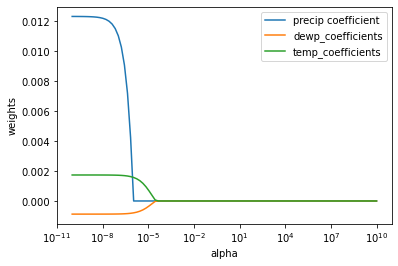

In [58]:
e_net = ElasticNet(max_iter = 1000, normalize = True)
coefs = []

for a in alphas:
    e_net.set_params(alpha = a)
    e_net.fit(X_train, y_train)
    coefs.append(e_net.coef_)
    
np.shape(coefs)
precip_coefficients = [coef[0] for coef in coefs]
dewp_coefficients = [coef[1] for coef in coefs]
temp_coefficients = [coef[2] for coef in coefs]

ax = plt.gca()
ax.set_xscale('log')
ax.plot(alphas, precip_coefficients, label="precip coefficient")
ax.plot(alphas, dewp_coefficients, label="dewp_coefficients")
ax.plot(alphas, temp_coefficients, label="temp_coefficients")
plt.legend()
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

e_netCV = ElasticNetCV(alphas = None, max_iter = 1000, normalize = True)
e_netCV.fit(X_train, y_train)

e_net.set_params(alpha=e_netCV.alpha_)
e_net.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(e_netCV.score(X_train, y_train), 
                                                              e_netCV.score(X_test,y_test)))

# Some of the coefficients are now reduced to exactly zero.
pd.Series(e_net.coef_, index=X.columns)

**(i)** On a map, plot the airports that have flights to them where the points that represent
   airports are relative in size to the average departure delay. You can see an example in "airports.png".

In [59]:
airports_flight= pd.merge(airports,flights, how='left',left_on=['faa'],right_on=['origin']).dropna()
airports_flight = airports_flight[['lat', 'lon', 'dep_delay']]
airports_flight

,lat,lon,dep_delay
460,40.692500,-74.168667,2.0
461,40.692500,-74.168667,-4.0
462,40.692500,-74.168667,-2.0
463,40.692500,-74.168667,-1.0
464,40.692500,-74.168667,-4.0
...,...,...,...
158706,40.777245,-73.872608,-5.0
158707,40.777245,-73.872608,13.0
158708,40.777245,-73.872608,-13.0
158709,40.777245,-73.872608,-12.0


In [60]:
airports_flight_average_dep_delay = \
    airports_flight\
    .groupby(['lat', 'lon'])\
    .agg(mean_dep_delay=('dep_delay', 'mean'))\
    .reset_index()

airports_flight_average_dep_delay

,lat,lon,mean_dep_delay
0,40.639751,-73.778925,8.714430
1,40.692500,-74.168667,11.531618
2,40.777245,-73.872608,7.784164


<AxesSubplot:xlabel='lon', ylabel='lat'>

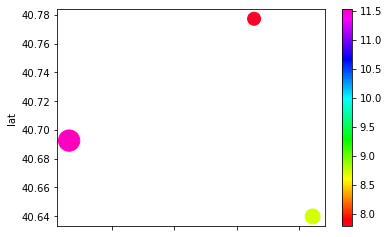

In [62]:
#https://stackoverflow.com/questions/29538559/draw-different-sized-circles-on-a-map
cmap = plt.get_cmap('gist_rainbow')
df = pd.DataFrame(airports_flight_average_dep_delay)

df.plot(x='lon', y='lat', kind="scatter", s=(df['mean_dep_delay']**2.5), c=df['mean_dep_delay'], cmap=cmap)

In [65]:
#https://www.python-graph-gallery.com/313-bubble-map-with-folium
n = folium.Map(location=[40.7,-73.9], tiles="OpenStreetMap", zoom_start=11)
for i in range(0,len(df)):
   folium.CircleMarker(
      location=[df.iloc[i]['lat'], df.iloc[i]['lon']],
      radius=float(df.iloc[i]['mean_dep_delay'])**2,
      color='#69b3a2',
      fill=True,
      fill_color='#69b3a2'
   ).add_to(n)
n

 **(j)** These questions require no code.
 - Suppose you are using Ridge Regression and you notice that the training error and the validation error are almost equal and fairly high. Would you say that the model suffers from high bias or high variance? Should you increase the regularization hyperparameter or reduce it?

- Why would you want to use:
        > Ridge Regression instead of plain Linear Regression (i.e. without any regularization)?
        > Lasso instead of Ridge Regression?
        > Elastic Net instead of Lasso?

When both the training error and validation error are equal and high we are underfitting. This means we have a high bias and low variance and the model is too simplified. Regularization means better generalization. As we are overfitting that means the hyperparameter is high. We should reduce it to increase the performance. <br>
* Ridge Regression uses regularization which means it restrics a model to avoid overfitting which we might have in a Linear Regression. We would use it if we are interested in generalization performance and making the model more simple to avoid overfitting. This is more important when we have small subsets of data, because when we have a lot of data points regularization is less important as the training and testing score are similar in both algorithms.
* Lasso uses L1 regularizarion instead of L2 that Ridge uses which means that the coefficients can be zero, where in Ridge they can't. We use Lasso when we have a lot of features and only a few are important so we use it like a form of automatic feature selection. This makes the model much easier to understand as we only have to focus on only the important features.
* ElasticNet is a combination of Ridge and Lasso. It is a better method than both because it solves the limitation of both methods. It removes unecessary coefficients but keeps the informative ones.

## 3. Clustering of Handwritten Digits

__You should be able to do this exercise after Lecture 5.__

This exercise will depart from the famous MNIST dataset, and we are exploring several clustering techniques with it.. This is a ".mat" file, in order to load this file in an ipynb you have to use loadmat() function from scipy.io. (replace my path).

In [14]:
%matplotlib inline
from scipy.io import loadmat
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from sklearn.metrics.cluster import adjusted_rand_score
from scipy.cluster.hierarchy import dendrogram, ward, single, average
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import matplotlib.pyplot as plt
import mglearn
from sklearn.utils import resample
from sklearn.decomposition import PCA

mnist = loadmat('mnist-original')
mnist_data = mnist["data"].T
mnist_label = mnist["label"][0]
import numpy as np
print("Number of datapoints: {}\n".format(mnist_data.shape[0]))
print("Number of features: {}\n".format(mnist_data.shape[1]))
print("List of labels: {}\n".format(np.unique(mnist_label)))

Number of datapoints: 70000

Number of features: 784

List of labels: [0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]



There are 70,000 images, and each image has 784 features. This is because each image is 28×28 pixels,
and each feature simply represents one pixel’s intensity, from 0 (white) to 255 (black). Let’s take a peek at one digit from the dataset. All you need to do is grab an instance’s feature vector, reshape it to a 28×28 array, and display it using Matplotlib’s `imshow()` function:

Value of datapoint no. 4:
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0  46 105 254 254 254 254 255 239  41
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  37
 118 222 254 253 253 253 253 253 253 211  54   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0  14 200 253 253 254 253 253 253 253 253
 253 253 116   0   0   0   0   0   0   0   0   0   0   0   0   0  16 160
 236 253 253 253 254 253 

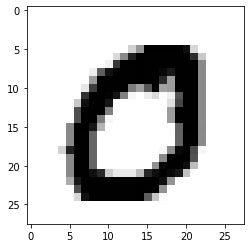

In [2]:
index = 4
print("Value of datapoint no. {}:\n{}\n".format(index,mnist_data[index]))
print("As image:\n")
plt.imshow(mnist_data[index].reshape(28,28),cmap=plt.cm.gray_r)
plt.show()

**(a)** Perform k-means clustering with k=10 on this dataset.

When training the k-means algorithm we should scale the data. For this we use a MinMax scaler

In [3]:
k = 10

scaler = MinMaxScaler()
scaler.fit(mnist_data)
scaled_data = scaler.transform(mnist_data)

kmeansCluster = KMeans(n_clusters=k, random_state=69, n_init=15, init='k-means++')
kmeansCluster.fit(scaled_data)

KMeans(n_clusters=10, n_init=15, random_state=69)

**(b)** Using visualization techniques analogous to what we have done in the Clustering notebook
   for the faces data, can you determine the 'nature' of the 10 constructed clusters?
   Do the clusters (roughly) coincide with the 10 different actual digits?
   
   The algorithm clearly created clusters representing the numbers, however some of the numbers are there twice and some are missing. This is because some of the same numbers are written slightly differently.

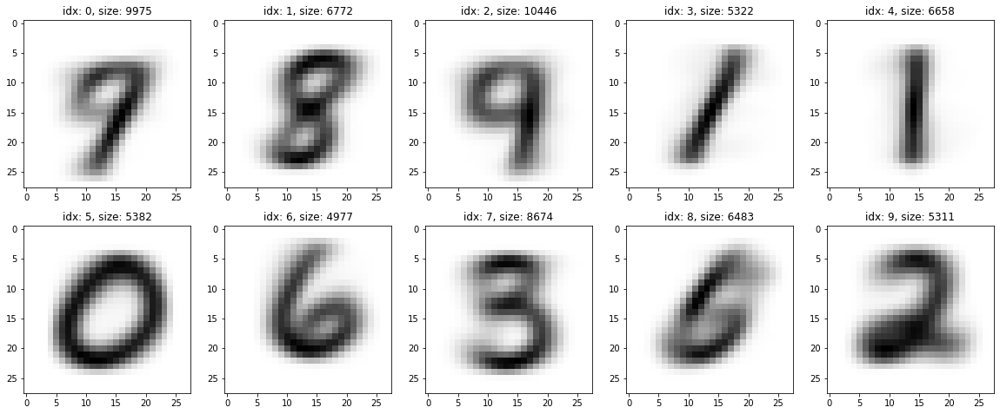

In [4]:
rows=int(k/5)
fig,axes = plt.subplots(rows,5,figsize=(20,4*rows))
for ax,cc,i in zip (axes.ravel(),kmeansCluster.cluster_centers_,np.arange(axes.ravel().size)):
    ax.set_title("idx: {}, size: {}".format(i,len(np.where(kmeansCluster.labels_==i)[0])))
    ax.imshow(cc.reshape(28,28),cmap=plt.cm.gray_r)
plt.show()

**(c)** Perform a supervised clustering evaluation using adjusted rand index.
   Are the results stable, when you perform several random restarts of k-means?

In [5]:
from sklearn.metrics.cluster import adjusted_rand_score

fit_pred = kmeansCluster.fit_predict(scaled_data)

adjusted_rand_score(mnist_label, fit_pred)

0.36520869228069386

Run 1: 0.36520869228069386

Run 2: 0.36523930151098133

Run 3: 0.3654675097713884

Running the rand score multiple times shows that the score is very consistant (remove random_state=69).

**(d)** Now perform hierarchical clustering on the data.
   (in order to improve visibility in the constructed dendrograms, you can also use a
   much reduced dataset as constructed using sklearn.utils.resample shown below).
   Does the visual analysis of the dendrogram indicate a natural number of clusters?

In [7]:
small_mnist_data, small_mnist_label = resample(mnist_data,
                                               mnist_label,
                                               n_samples=500,
                                               replace='false',
                                               random_state=69)
small_mnist_data

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

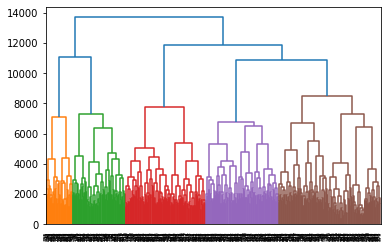

In [9]:
linkage_array = ward(small_mnist_data)
dendrogram(linkage_array)

plt.show()

Generating the dendrogram with different resamplings with 500-3000 samples, indicates four or five clusters, typically five.

**(e)** Using different cluster distance metrics (ward,single,average, etc.),
   what do the clusterings look like that are produced at the level of k=10 clusters?
   See the Clustering notebook for the needed Python code, including the fcluster
   method to retrieve 'plain' clusterings from the hierarchical clustering.

Ward:


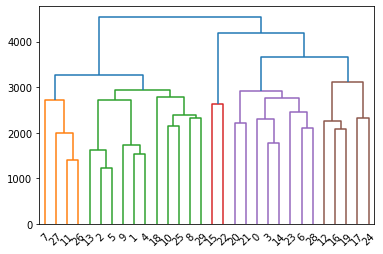

Single:


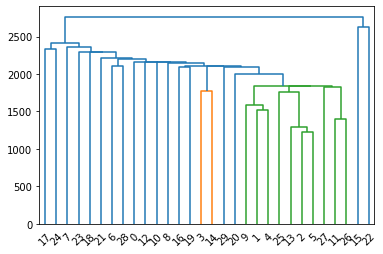

Average:


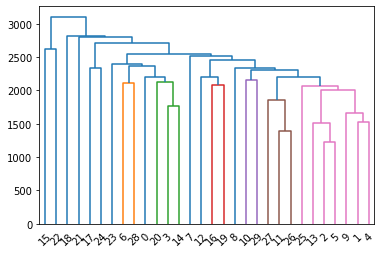

In [10]:
small_mnist_data, small_mnist_label = resample(mnist_data,
                                               mnist_label,
                                               n_samples=30,
                                               replace='false',
                                               random_state=69)

print("Ward:")
linkage_array = ward(small_mnist_data)
dendrogram(linkage_array)
plt.show()

print("Single:")
linkage_array = single(small_mnist_data)
dendrogram(linkage_array)
plt.show()

print("Average:")
linkage_array = average(small_mnist_data)
dendrogram(linkage_array)
plt.show()

The Ward has much more distinct clusters and branches earlier than the other two. Both single and average seem to generate one main cluster and multiple much smaller ones. Even at larger sample sizes such as 500, it seems that single and average generates one main cluster.

**(f)** Do a DBSCAN clustering of the small dataset. Tweak the different parameters.

In [13]:
small_mnist_data, small_mnist_label = resample(mnist_data,
                                               mnist_label,
                                               n_samples=1000,
                                               replace='false',
                                               random_state=69)

scaler = MinMaxScaler()
#scaler = StandardScaler()
scaler.fit(small_mnist_data)
scaled_data = scaler.transform(small_mnist_data)

# Estimate best eps and min_sample values
for i in range(1,10):
    for j in range(2,10):
        dbscan = DBSCAN(eps=i,min_samples=j)
        clusters = dbscan.fit_predict(scaled_data)
        # remove all noise (-1)
        cluster_count = [ i for i in clusters if i >= 0]
        if len(cluster_count)/len(clusters) > 0.9:
            percentage = "{:.2f}".format(len(cluster_count)/len(clusters)*100)
            print(f"{percentage}% good clusters with eps={i}, min_samples={j}, cluster_count: {len(np.unique(cluster_count))}")

97.70% good clusters with eps=8, min_samples=2, cluster_count: 1
97.70% good clusters with eps=8, min_samples=3, cluster_count: 1
97.50% good clusters with eps=8, min_samples=4, cluster_count: 1
97.40% good clusters with eps=8, min_samples=5, cluster_count: 1
97.40% good clusters with eps=8, min_samples=6, cluster_count: 1
97.30% good clusters with eps=8, min_samples=7, cluster_count: 1
96.90% good clusters with eps=8, min_samples=8, cluster_count: 1
96.80% good clusters with eps=8, min_samples=9, cluster_count: 1
99.90% good clusters with eps=9, min_samples=2, cluster_count: 1
99.90% good clusters with eps=9, min_samples=3, cluster_count: 1
99.90% good clusters with eps=9, min_samples=4, cluster_count: 1
99.90% good clusters with eps=9, min_samples=5, cluster_count: 1
99.90% good clusters with eps=9, min_samples=6, cluster_count: 1
99.90% good clusters with eps=9, min_samples=7, cluster_count: 1
99.90% good clusters with eps=9, min_samples=8, cluster_count: 1
99.90% good clusters with

From the simple test above we can see that eps=8 or above provide the least noise with the fewest clusters

**(g)** Try to compare the different clustering methods on the MNIST dataset in the same way
   the book does on the faces dataset on pp. 195-206.

In [15]:
small_mnist_data, small_mnist_label = resample(mnist_data,
                                               mnist_label,
                                               n_samples=10000,
                                               replace='false',
                                               random_state=69)

pca = PCA(n_components=100, whiten=True, random_state=69)
X_pca = pca.fit_transform(small_mnist_data)

In [16]:
# apply DBSCAN with default parameters
dbscan = DBSCAN(eps=15, min_samples=3)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [0]


In [17]:
print("Number of points per cluster: {}".format(np.bincount(labels + 1)))

Number of points per cluster: [    0 10000]


In [18]:
for eps in [1, 3, 5, 7, 9, 11, 13]:
    print("\neps={}".format(eps))
    dbscan = DBSCAN(eps=eps, min_samples=3)
    labels = dbscan.fit_predict(X_pca)
    print("Number of clusters: {}".format(len(np.unique(labels))))
    print("Cluster sizes: {}".format(np.bincount(labels + 1)))


eps=1
Number of clusters: 31
Cluster sizes: [9910    3    3    3    3    3    3    3    3    3    3    3    3    3
    3    3    3    3    3    3    3    3    3    3    3    3    3    3
    3    3    3]

eps=3
Number of clusters: 69
Cluster sizes: [9637   13   14    3    9   13   10    3   33    4    3    3   31    8
    3    3    3    3    4   20    3    3    3    3   12    4    3    8
    9    3    3    5    3    3    3    3    3    3    3    6    3    3
    5    3    3    4    3    4    3    4    3    3    3    3    3    3
    3    5    3    3    3    3    3    3    3    3    3    3    3]

eps=5
Number of clusters: 51
Cluster sizes: [8841 1000    3    3    3    3    3    3    4    3    3    3    3    3
    3    4    3    3    3    3    3    4    3    3    3    3    3    3
    3   10    3    3    3    3    3    3    3    3    3    3    3    5
    3    3    3    3    3    3    3    3    3]

eps=7
Number of clusters: 104
Cluster sizes: [7477 2110   12   18    3    3    3    4    3    

As shown above, eps=7 is quite interesting as it has many clusters and no noise.

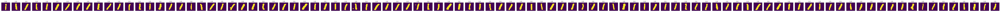

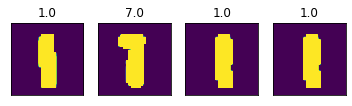

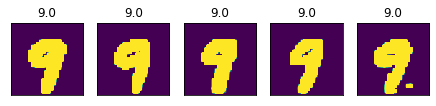

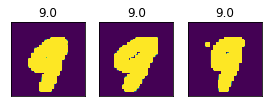

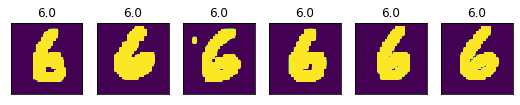

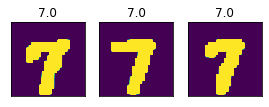

In [19]:
# Have to use an even smaller dataset as plot throws and my kernel stops
small_mnist_data, small_mnist_label = resample(mnist_data,
                                               mnist_label,
                                               n_samples=1000,
                                               replace='false',
                                               random_state=69)

pca = PCA(n_components=100, whiten=True, random_state=69)
X_pca = pca.fit_transform(small_mnist_data)
dbscan = DBSCAN(min_samples=3, eps=7)
labels = dbscan.fit_predict(X_pca)

for cluster in range(max(labels) + 1):
    mask = labels == cluster
    n_images =  np.sum(mask)
    fig, axes = plt.subplots(1, n_images, figsize=(n_images * 1.5, 4),
                             subplot_kw={'xticks': (), 'yticks': ()})
    for image, label, ax in zip(small_mnist_data[mask], small_mnist_label[mask], axes):

        ax.imshow(image.reshape(28,28), vmin=0, vmax=1)
        ax.set_title(label)

We can see on the above data that the algorithm classifies a few different writing of the same characters.

In [20]:
small_mnist_data, small_mnist_label = resample(mnist_data,
                                               mnist_label,
                                               n_samples=10000,
                                               replace='false',
                                               random_state=69)

pca = PCA(n_components=100, whiten=True, random_state=69)
X_pca = pca.fit_transform(small_mnist_data)

# extract clusters with k-Means
km = KMeans(n_clusters=10, random_state=0)
labels_km = km.fit_predict(X_pca)
print("Cluster sizes k-means: {}".format(np.bincount(labels_km)))

Cluster sizes k-means: [ 651  901  882  844 1022  443 1017  489 2832  919]


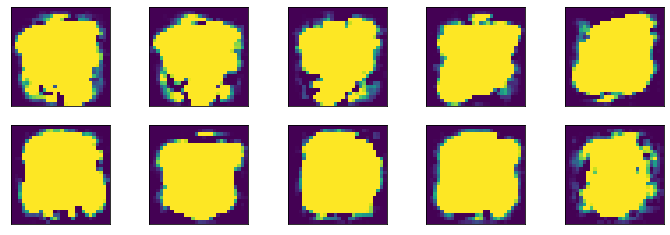

In [21]:
fig, axes = plt.subplots(2, 5, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(12, 4))
for center, ax in zip(km.cluster_centers_, axes.ravel()):
    ax.imshow(pca.inverse_transform(center).reshape(28,28),
              vmin=0, vmax=1)

Looking at the K-means clusters with Principle Component Analysis, they are completely useless as it smashes all of the digits together into incomprehensible blobs.

In [22]:
small_mnist_data, small_mnist_label = resample(mnist_data,
                                               mnist_label,
                                               n_samples=10000,
                                               replace='false',
                                               random_state=69)

pca = PCA(n_components=100, whiten=True, random_state=69)
X_pca = pca.fit_transform(small_mnist_data)

# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=10)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(
       np.bincount(labels_agg)))

cluster sizes agglomerative clustering: [3077 1486 1256  861  866  513  873  434  376  258]


In [23]:
print("ARI: {:.2f}".format(adjusted_rand_score(labels_agg, labels_km)))

ARI: 0.21


Text(0, 0.5, 'Cluster distance')

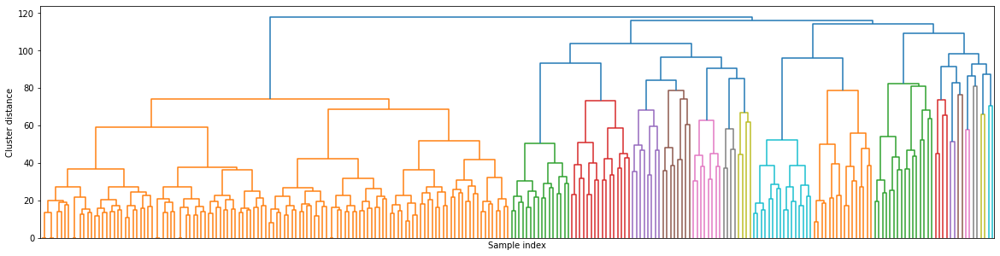

In [24]:
linkage_array = ward(X_pca)
# now we plot the dendrogram for the linkage_array
# containing the distances between clusters
plt.figure(figsize=(20, 5))
dendrogram(linkage_array, p=7, truncate_mode='level', no_labels=True)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")

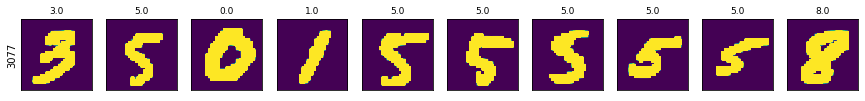

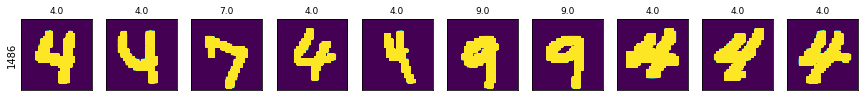

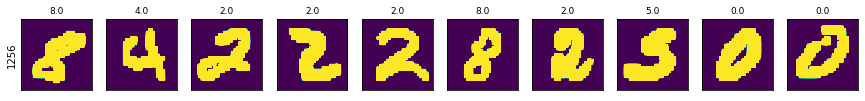

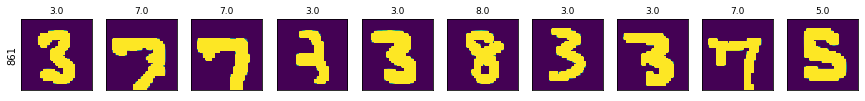

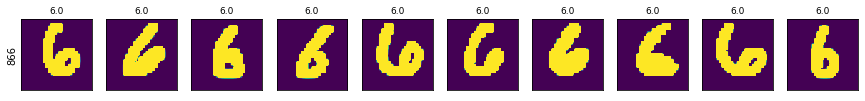

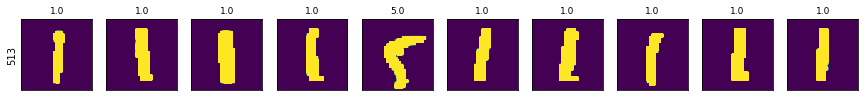

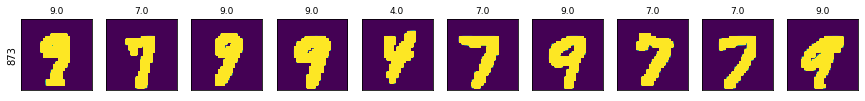

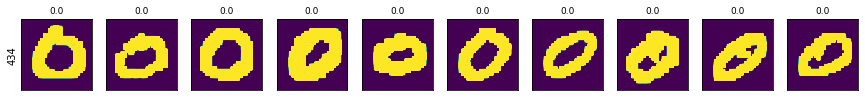

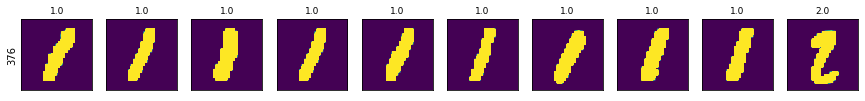

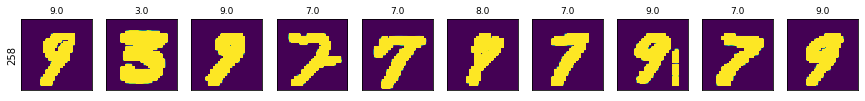

In [25]:
n_clusters = 10
# Run through clusters and plot the correct hits.
for cluster in range(n_clusters):
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 10, subplot_kw={'xticks': (), 'yticks': ()},
                             figsize=(15, 8))
    axes[0].set_ylabel(np.sum(mask))
    for image, label, asdf, ax in zip(small_mnist_data[mask], small_mnist_label[mask],
                                      labels_agg[mask], axes):
        ax.imshow(image.reshape(28,28), vmin=0, vmax=1)
        ax.set_title(label, fontdict={'fontsize': 9})

As seen above, using PCA with AgglomerativeClustering accomplishes much better results. Even the third to last entry was classified correctly despite the weird vertical line in the bottom right.

cluster sizes agglomerative clustering: [381 325 435 336 165 179 434 469 153 258 507 742 295 232 230 156 279 174
 376 255 208 154 234  99 126  67 293 120 366 345 186 143 112 180 139 148
 160 190 189 160]


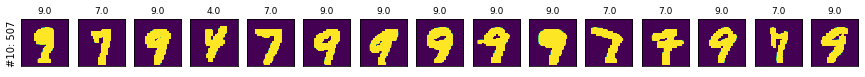

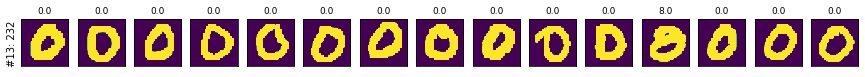

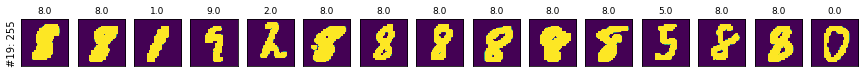

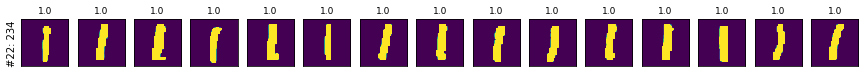

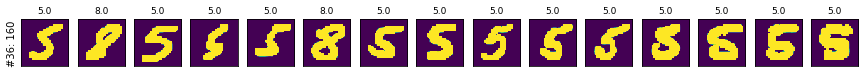

In [26]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=40)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(np.bincount(labels_agg)))

n_clusters = 40
for cluster in [10, 13, 19, 22, 36]: # hand-picked "interesting" clusters
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 15, subplot_kw={'xticks': (), 'yticks': ()},
                             figsize=(15, 8))
    cluster_size = np.sum(mask)
    axes[0].set_ylabel("#{}: {}".format(cluster, cluster_size))
    for image, label, asdf, ax in zip(small_mnist_data[mask], small_mnist_label[mask],
                                      labels_agg[mask], axes):
        ax.imshow(image.reshape(28,28), vmin=0, vmax=1)
        ax.set_title(label, fontdict={'fontsize': 9})
    for i in range(cluster_size, 15):
        axes[i].set_visible(False)

## 4. The Local Elections

__You should be able to do this exercise after Lecture 6.__

In the local elections of 2021, around 100 candidates stood for election for the city council of Horsens. 83 of them represented a national party, had more than one candidate and provided answers to the <a href="https://www.dr.dk/nyheder/politik/kandidattest">DR Candidate Test</a>, a test designed to help voters find out who they should vote for. In this test, the candidates answered 18 questions, which we will use as features in the following. The politicians belong to 9 parties, which will be our classes.

The numpy files `X_Horsens.npy` and `Y_Horsens.npy` contains the data. `Y_Horsens.npy` contains a letter representing the party to which each candidate belongs. The following parties are represented:

| Party letter | Party name | Party name (English) | Political position | Party color |
| :-: | :-: | :-: | :-: | :-: |
| A | Socialdemokratiet | Social Democrats | Centre-left | Red |
| B | Radikale Venstre | Social Liberal Party | Centre-left | Indigo |
| C | Det Konservative Folkeparti | Conservative People's Party | Right-wing | Green |
| D | Nye Borgerlige | New Right | Far-right | Black |
| F | Socialistisk Folkeparti | Socialist People's Party | Left-wing | Fuchsia |
| I | Liberal Alliance | Liberal Alliance | Right-wing | Cyan |
| O | Dansk Folkeparti | Danish People's Party | Far-right | Yellow |
| V | Venstre | Danish Liberal Party | Centre-right | Blue |
| Z* | Enhedslisten | Red-Green Alliance | Far-left | Dark red |

*_Note that, although the party letter of Enhedslisten is actually Ø, we will here use Z to avoid any complications with the wonderful Danish letters Æ, Ø and Å. Feel free to change the Z back to an Ø if you find that it does not cause any problems._

Meanwhile, `X_Horsens.npy` contains the answers to the test as numbers between -1.5 and 1.5, such that -1.5 is "Strongly disagree", -0.5 is "Disagree", 0.5 is "Agree" and 1.5 is "Strongly agree". The 18 questions concern, in order, subdivision, schools, windmills, building permits, tall buildings, housing, child care, culture, nursing homes, taxes, sports, refugees, nursing homes (again), public transportation, meat-free days, welfare, privatization, and religious minorities.

Both files can be imported using `numpy.load`.

__(a)__ How well do you (intuitively) expect that we can predict the partisan affiliation of a candidate based on their answers to the test?

I think we can predict it with a high accuracy considering that the questions are about what each party promises if they get ellected. The result will not always be accurate because some parties are similar (Far-left, Left-wing) and it is possible that the answers to the questions will be similar.

__(b)__ Based on the answers from all 83 candidates for the Horsens city council, perform a Principal Component Analysis with 2 principal components. Plot the results in a figure using these 2 components as the axes. Label the points with the party letter and the appropriate color.

In [66]:
X_Horsens = np.load('X_Horsens.npy')
Y_Horsens = np.load('Y_Horsens.npy')
X_Databorg = np.load('X_Databorg.npy')
Y_Databorg = np.load('Y_Databorg.npy')

features = ['subdivision', 'schools', 'windmills', 'building permits', 'tall buildings', 'housing', 'child care', 'culture', 'nursing homes', 'taxes', 'sports', 'refugees', 'nursing homes (again)', 'public transportation', 'meat-free days', 'welfare', 'privatization', 'religious minorities']

X_Hor = pd.DataFrame(X_Horsens, columns=features)
Y_Hor = pd.DataFrame(Y_Horsens, columns=['Party'])

In [109]:
X_s = preprocessing.StandardScaler().fit_transform(X_Hor)
pca2 = decomposition.PCA(n_components=2)
res2 = pca2.fit_transform(X_s)
pca2.explained_variance_ratio_

array([0.39525751, 0.11060418])

In [110]:
pca2Df = pd.DataFrame(data = res2
             , columns = ['principal component 1', 'principal component 2'])

pca2Dfinal = pd.concat([pca2Df, Y_Hor[['Party']]], axis = 1)

Inspired by: https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60

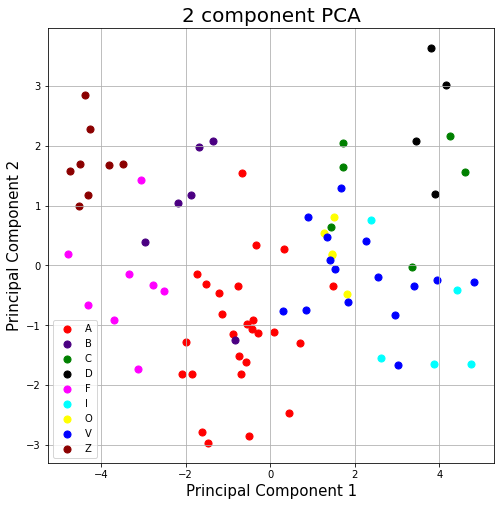

In [111]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = ['A', 'B', 'C', 'D', 'F', 'I', 'O', 'V', 'Z']
colors = ['red', 'indigo', 'green', 'black', 'fuchsia', 'cyan', 'yellow', 'blue', 'darkred']
for target, color in zip(targets,colors):
    indicesToKeep = pca2Dfinal['Party'] == target
    ax.scatter(pca2Dfinal.loc[indicesToKeep, 'principal component 1']
               , pca2Dfinal.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

__(c)__ Comment on the results. You may consider the following questions for inspiration: Can the political parties be separated? Can the typical distinction of "left-wing" and "right-wing" be discerned? Which of the 18 questions (features) are most important?

It seems like there is a distinction between the parties. The right parties seems to be on the right side of the plot and the left on the left. The center parties lean towards the center. Inspired by:https://stackoverflow.com/questions/50796024/feature-variable-importance-after-a-pca-analysis

In [112]:
pd.Series(abs( pca2.components_ )[0], index=features)

subdivision              0.150294
schools                  0.041177
windmills                0.225587
building permits         0.211652
tall buildings           0.048277
housing                  0.217779
child care               0.256121
culture                  0.228058
nursing homes            0.193362
taxes                    0.318774
sports                   0.061752
refugees                 0.296982
nursing homes (again)    0.261643
public transportation    0.322831
meat-free days           0.235702
welfare                  0.279074
privatization            0.315304
religious minorities     0.275889
dtype: float64

The most important features are public transportation, taxes, privatization.

In [114]:
pca2Dfinal['Colors'] = pca2Dfinal['Party'].replace(targets, colors)

We can also visualize it in a biplot. The importance of each feature is reflected by the magnitude of the corresponding values in the eigenvectors.

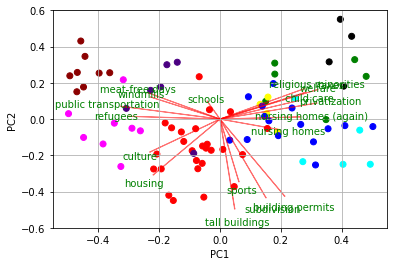

In [115]:
def myplot(score,coeff,labels=features):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley, c = pca2Dfinal['Colors'])
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')

            
plt.xlim(-0.55,0.55)
plt.ylim(-0.6,0.6)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
plt.grid()

#Call the function. Use only the 2 PCs.
myplot(res2[:,0:2],np.transpose(pca2.components_[0:2, :]))
plt.show()

The number of candidates (83) is on the (very) low side when we want to do machine learning. Luckily, the neighbouring city of Databorg had no less than 8,300 candidates standing for election, with a political environment similar to that of Horsens. In the following, we will use the data from Databorg. These are stored in the numpy files `X_Databorg.npy` and `Y_Databorg.npy` in same format as the Horsens data.

__(d)__ Once again, perform a Principal Component Analysis and visualize the results. Compare the results to those of the Horsens data.

In [116]:
X_Data = pd.DataFrame(X_Databorg, columns=features)
Y_Data = pd.DataFrame(Y_Databorg, columns=['Party'])

X_s = preprocessing.StandardScaler().fit_transform(X_Data)
pca2 = decomposition.PCA(n_components=2)
res2 = pca2.fit_transform(X_s)
pca2.explained_variance_ratio_

array([0.22986656, 0.08216892])

In [117]:
pca2Df = pd.DataFrame(data = res2
             , columns = ['principal component 1', 'principal component 2'])

pca2Dfinal = pd.concat([pca2Df, Y_Data[['Party']]], axis = 1)

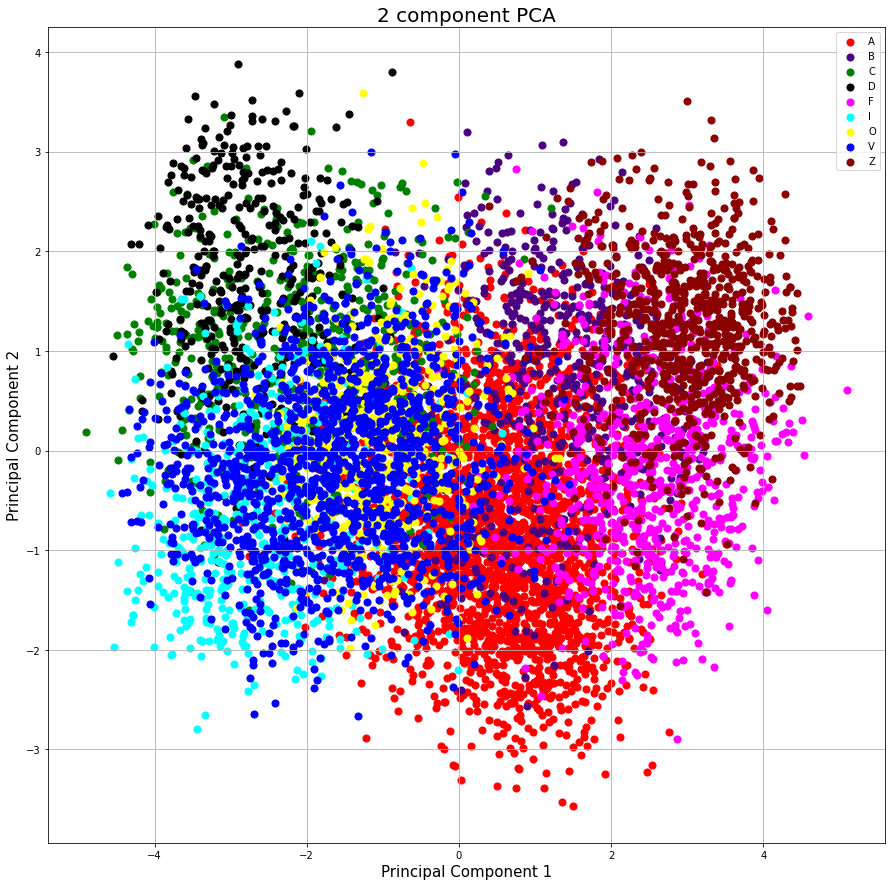

In [118]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = ['A', 'B', 'C', 'D', 'F', 'I', 'O', 'V', 'Z']
colors = ['red', 'indigo', 'green', 'black', 'fuchsia', 'cyan', 'yellow', 'blue', 'darkred']
for target, color in zip(targets,colors):
    indicesToKeep = pca2Dfinal['Party'] == target
    ax.scatter(pca2Dfinal.loc[indicesToKeep, 'principal component 1']
               , pca2Dfinal.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

The total variance explained by the first two components are less than in the Horsens example. It is around 30% while in the Horsens it was 40%. There seems to be seperation between parties but similar parties overlap (Left-Wing and Centr-Left for example).

Confident that we can predict the partisan affiliation of a politician reasonably well based on their answers to the test, we want to build a model that will allow us to distinguish between the 9 political parties. For this purpose, we split the data into a training and a validation set.

__(e)__ Split the data into a training and a validation set, with appropriate fractions.

In [135]:
X_train, X_test, y_train, y_test = train_test_split(X_Data, Y_Data, test_size=0.5, random_state=69)

First, we assume that a Naive Bayes approach is sufficient for our purposes.

__(f)__ Comment on the basic assumption of the Naive Bayes approach. Is this a reasonable assumption for the problem at hand?

Naive Bayes is suitable for multi-class classification and as our problem is a multi-class clasification it is a good approach.

__(g)__ Classify the instances of the validation set using a Naive Bayes approach. Comment on the results.

In [136]:
nb = GaussianNB()
nb.fit(X_train, y_train.values.ravel()) 

print("Model accuracy on the test data: {}".format(nb.score(X_test,y_test)))
print("Model accuracy on the train data: {}".format(nb.score(X_train,y_train)))

Model accuracy on the test data: 0.7055421686746988
Model accuracy on the train data: 0.7255421686746988


Assume instead that a _k_-nearest neighbour approach is sufficient for our  needs.

__(h)__ Using default settings of the _k_-NN classifier, classify the instances of the validation set. Comment on the performance.

In [137]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train.values.ravel())
print("Model accuracy on the test data: {}".format(knn.score(X_test,y_test)))
print("Model accuracy on the train data: {}".format(knn.score(X_train,y_train)))

Model accuracy on the test data: 0.7450602409638554
Model accuracy on the train data: 1.0


__(i)__ Play around with different values of _k_. Decide on a "good" value of _k_. Comment on the results.

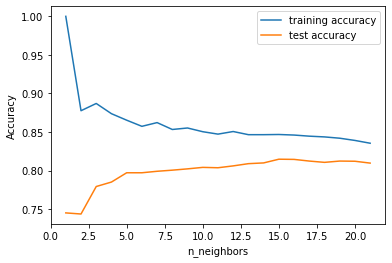

In [138]:
training_accuracy = []
test_accuracy = []

ks = range(1, 22)

for k in ks:
    clf = KNeighborsClassifier(n_neighbors=k)
    clf.fit(X_train, y_train.values.ravel())
    # record training set accuracy
    training_accuracy.append(clf.score(X_train, y_train))
    # record generalization accuracy
    test_accuracy.append(clf.score(X_test, y_test))
    
plt.plot(ks, training_accuracy, label="training accuracy")
plt.plot(ks, test_accuracy, label="test accuracy")
plt.ylabel("Accuracy")
plt.xlabel("n_neighbors")
plt.legend();

In [140]:
knn = KNeighborsClassifier(n_neighbors=15)
knn.fit(X_train, y_train.values.ravel())
print("Model accuracy on the test data: {}".format(knn.score(X_test,y_test)))
print("Model accuracy on the train data: {}".format(knn.score(X_train,y_train)))

Model accuracy on the test data: 0.8146987951807229
Model accuracy on the train data: 0.8467469879518073


By changing the parameter we avoid overfitting and we have increased the testing score. It is a good result as the training and testing accuracy are both high and around the same.

We now try to use a decision tree instead.

__(j)__ What is the _minimum_ depth of an appropriate decision tree? Why?

9 parties. So we need 9 leaf nodes. That means we need 8 questions to have 9 leaf nodes. 8 + 9 = 17. From the formula 2^(d+1)−1 if we put the depth as 3 then we get 15 which is less than 17. For depth is 4 the result is 31. So the minimum depth is 4. 

__(k)__ Build a decision tree with at least the depth from above. Play around with the tree depth. Include a figure that shows some relevant measure of the performance as a function of the tree depth. Comment on any issues of over-fitting. Decide on a tree which you will keep for later use. Can you do better than the _k_-NN classifier?

In [142]:
clf = DecisionTreeClassifier(max_depth=4, random_state=69)
clf.fit(X_train, y_train)

print("Accuracy on training data: {}".format(clf.score(X_train, y_train)))
print("Accuracy on testing data: {}".format(clf.score(X_test, y_test)))

Accuracy on training/validation data: 0.5559036144578313
Accuracy on testing data: 0.5267469879518072


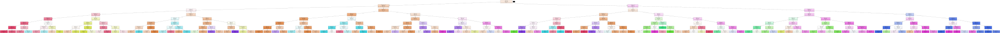

In [174]:
dot_data = export_graphviz(clf, out_file=None,
                           class_names=["A","B","C","D","F","I","O","V","Z"],
                           feature_names=features,
                           filled=True)
pydot_graph = pydotplus.graph_from_dot_data(dot_data)
pydot_graph.set_size('"180,5!"')
gvz_graph = graphviz.Source(pydot_graph.to_string())
gvz_graph

In [144]:
clf = DecisionTreeClassifier(random_state=69)
clf.fit(X_train, y_train)
print("Accuracy on training data: {}".format(clf.score(X_train, y_train)))
print("Accuracy on testing data: {}".format(clf.score(X_test, y_test)))

Accuracy on training/validation data: 1.0
Accuracy on testing data: 0.6209638554216868


If we do not set the depth we can clearly see we are overfitting.

In [145]:
clf = DecisionTreeClassifier(max_depth=7, random_state=69)
clf.fit(X_train, y_train)
print("Accuracy on training data: {}".format(clf.score(X_train, y_train)))
print("Accuracy on testing data: {}".format(clf.score(X_test, y_test)))

Accuracy on training data: 0.7197590361445784
Accuracy on testing data: 0.6404819277108433


We get the best accuracy with depths of 5, 6, 7 however they are not better than knn.

__(l)__ What are the most important features? Visualize this in an appropriate way. Does it match what you would expect? Compare to the results of the PCA analysis. Do we expect them to be the same? Why/why not?

In [146]:
print("Feature importances:\n{}".format(clf.feature_importances_))

Feature importances:
[0.06622078 0.05612545 0.02913786 0.07641093 0.06522329 0.06459801
 0.03324005 0.01476483 0.01689238 0.18049505 0.07678652 0.07246727
 0.02397572 0.01189122 0.01865541 0.04489502 0.11933055 0.02888966]


Inspired by: https://datascience.stackexchange.com/questions/69572/how-to-determine-which-features-matter-the-most

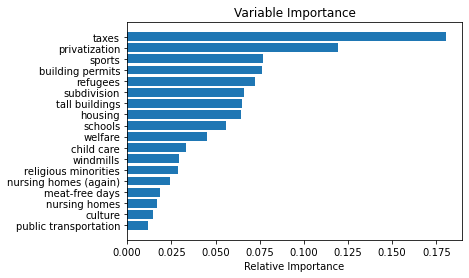

In [147]:
feature_names=['subdivision', 'schools', 'windmills', 'building permits', 'tall buildings', 'housing', 'child care', 'culture', 'nursing homes', 'taxes', 'sports', 'refugees', 'nursing homes (again)', 'public transportation', 'meat-free days', 'welfare', 'privatization', 'religious minorities']

def plot_feature_importances_sorted(model):
    features = np.array(feature_names)
    importances = model.feature_importances_
    sorted_idx = np.argsort(importances)
    padding = np.arange(len(features)) + 0.5
    plt.barh(padding, importances[sorted_idx], align='center')
    plt.yticks(padding, features[sorted_idx])
    plt.xlabel("Relative Importance")
    plt.title("Variable Importance")
    plt.show()

plot_feature_importances_sorted(clf)

We don't expect them to be the same. Random forest is a supervised method which selects features that are better to discriminate between the parties. PCA is an unsupervised method that selects features that have the highest variance. 

We know that decision trees suffer from certain problems that may be solved by using decision forests.

__(m)__ Build a decision forest. Play around with the number of trees in the forest. Decide on a forest.

In [164]:
forest = RandomForestClassifier(n_estimators=100, max_depth=7, max_features=8, random_state=69)
forest.fit(X_train, y_train.values.ravel())

print("Accuracy on training set: {:.3f}".format(forest.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(forest.score(X_test, y_test)))

Accuracy on training set: 0.825
Accuracy on test set: 0.732


__(n)__ Extract the most important features. Comment and compare with previously obtained results.

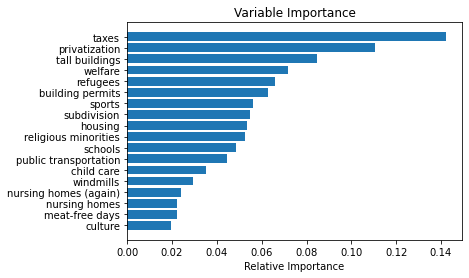

In [163]:
plot_feature_importances_sorted(forest)

The results are similar. They both have the same three most important features. That is expected as they are both supervised methods.

Finally, we want to compare the models we have worked with so far (i.e., Naive Bayes, _k_-NN, decision tree and decision forest).

__(o)__ Compare the results of the in terms of confusion matrices, accuracy, precision, recall, and f-score. How well can we predict the partisan affiliation of a candidate based on their answers to a test? How does this compare with your intuition? 

Inspired by: https://vitalflux.com/accuracy-precision-recall-f1-score-python-example/

The confusion matrix for a multiclass clasification looks differently than a binary classification. The diagonal shows the true positives for each class. To calculate the other values we must follow these rules:
* FN: The sum of values of corresponding rows except the TP value
* FP : The sum of values of corresponding column except the TP value.
* TN: The sum of values of all columns and row except the values of that class that we are calculating the values

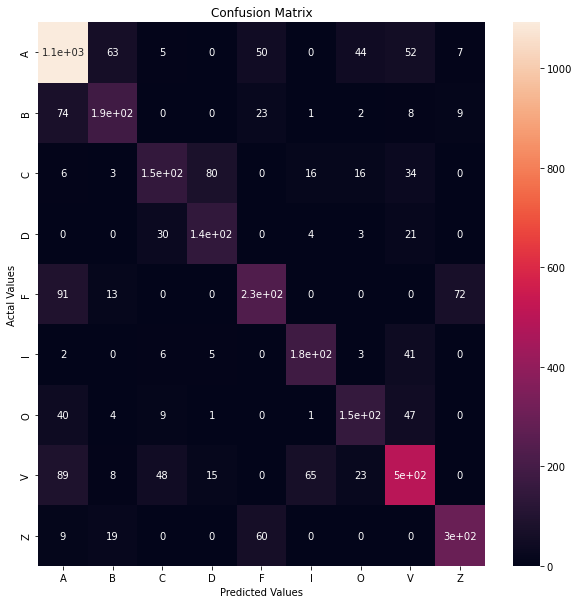

Accuracy: 0.7055421686746988
F1 score: 0.7027568677482584
Recall: 0.7055421686746988
Precision: 0.7029188757634899


In [187]:
nb = GaussianNB()
nb.fit(X_train, y_train.values.ravel()) 

# Get the predictions
#
y_pred = nb.predict(X_test)
#
# Calculate the confusion matrix
#
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)

cm_df = pd.DataFrame(conf_matrix,
                     index = targets, 
                     columns = targets)
#Plotting the confusion matrix
plt.figure(figsize=(10,10))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()


print('Accuracy:', accuracy_score(y_test, y_pred))
print('F1 score:', f1_score(y_test, y_pred,average='weighted'))
print('Recall:', recall_score(y_test, y_pred, average='weighted'))
print('Precision:', precision_score(y_test, y_pred, average='weighted'))

We can calculate the TP, TN, FP, FN of the first class. 
* TP=1100
* FN=63+5+0+50+0+44+52+7=221
* FP=74+6+0+91+2+40+89+9=311
* TN=2530

##### Precision Score = TP / (FP + TP)
If we want to minimise the false negatives then we choose a model with high precision. 
##### Recall Score = TP / (FN + TP)
The higher the recall score, the better the model is at identifying true positives out of all positives.
##### Accuracy score =  (TP + TN)/ (TP + FN + TN + FP)
How often our model predicts the correct outcome.
##### F1 score = 2* Precision Score * Recall Score/ (Precision Score + Recall Score/)
It is an alternative to accuracy score and provides information about the quality of the model.

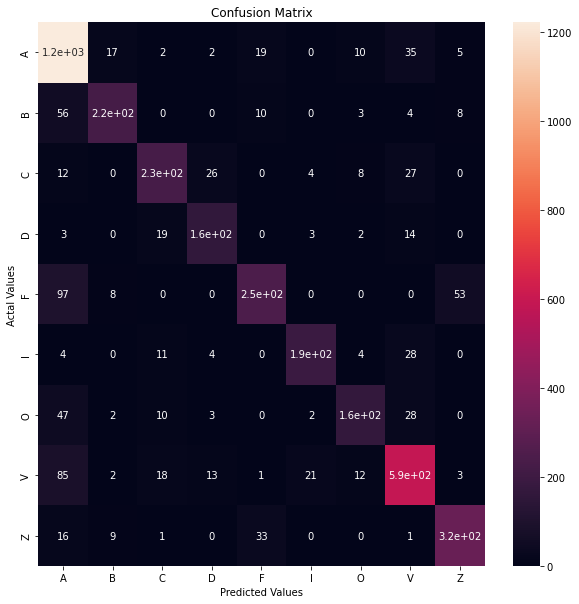

Accuracy: 0.8060240963855422
F1 score: 0.8025645661959813
Recall: 0.8060240963855422
Precision: 0.8073095346058096


In [188]:
knn = KNeighborsClassifier(n_neighbors=12)
knn.fit(X_train, y_train.values.ravel())

# Get the predictions
#
y_pred = knn.predict(X_test)
#
# Calculate the confusion matrix
#
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)

cm_df = pd.DataFrame(conf_matrix,
                     index = targets, 
                     columns = targets)
#Plotting the confusion matrix
plt.figure(figsize=(10,10))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

print('Accuracy:', accuracy_score(y_test, y_pred))
print('F1 score:', f1_score(y_test, y_pred,average='weighted'))
print('Recall:', recall_score(y_test, y_pred, average='weighted'))
print('Precision:', precision_score(y_test, y_pred, average='weighted'))

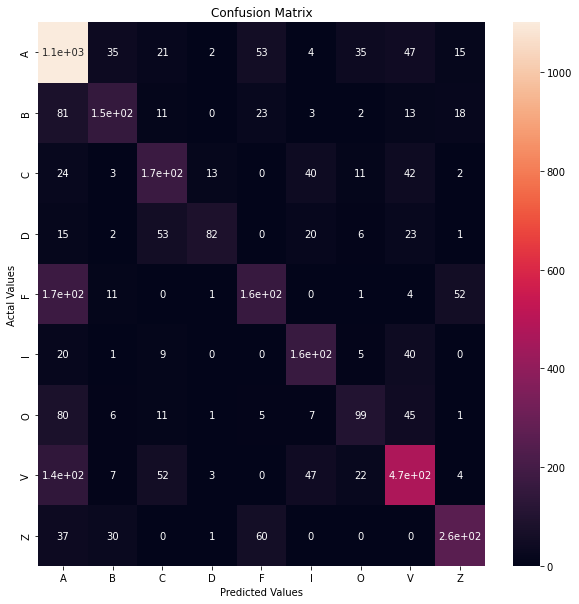

Accuracy: 0.6404819277108433
F1 score: 0.6313135033383749
Recall: 0.6404819277108433
Precision: 0.6407787727724296


In [189]:
clf = DecisionTreeClassifier(max_depth=7, random_state=69)
clf.fit(X_train, y_train)

# Get the predictions
#
y_pred = clf.predict(X_test)
#
# Calculate the confusion matrix
#
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)

cm_df = pd.DataFrame(conf_matrix,
                     index = targets, 
                     columns = targets)
#Plotting the confusion matrix
plt.figure(figsize=(10,10))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

print('Accuracy:', accuracy_score(y_test, y_pred))
print('F1 score:', f1_score(y_test, y_pred,average='weighted'))
print('Recall:', recall_score(y_test, y_pred, average='weighted'))
print('Precision:', precision_score(y_test, y_pred, average='weighted'))

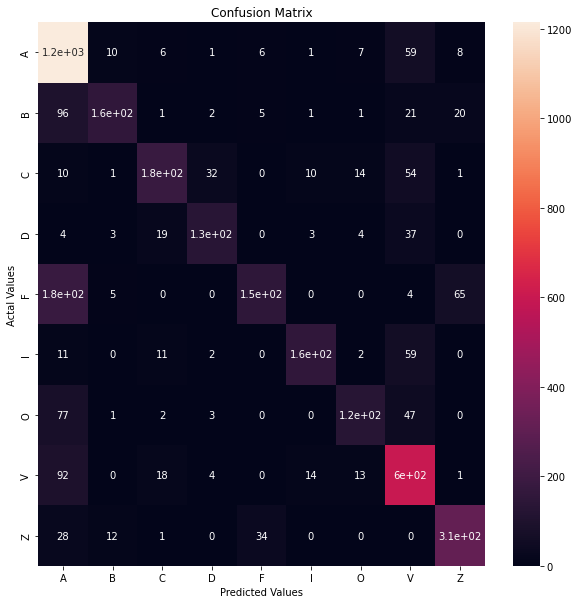

Accuracy: 0.7291566265060241
F1 score: 0.716148132747576
Recall: 0.7291566265060241
Precision: 0.7399058242082975


In [190]:
forest = RandomForestClassifier(n_estimators=100, max_depth=7, max_features=9, random_state=69)
forest.fit(X_train, y_train.values.ravel())

# Get the predictions
#
y_pred = forest.predict(X_test)
#
# Calculate the confusion matrix
#
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_pred)

cm_df = pd.DataFrame(conf_matrix,
                     index = targets, 
                     columns = targets)
#Plotting the confusion matrix
plt.figure(figsize=(10,10))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

print('Accuracy:', accuracy_score(y_test, y_pred))
print('F1 score:', f1_score(y_test, y_pred,average='weighted'))
print('Recall:', recall_score(y_test, y_pred, average='weighted'))
print('Precision:', precision_score(y_test, y_pred, average='weighted'))

From the above measurements we can see that the best models are first KNN, second Random Forest, third Naive Bayes and last Decision Tree. If we choose KNN we have a 80% chance of predicting the correct Party. This is better than I expected cause some of the parties have similar values and I would expect our model to confuse between similar parties more often.

## 5. Sentiment Analysis

__You should be able to do this exercise after Lecture 8.__

In this exercise we use the IMDb-dataset, which we will use to perform a sentiment analysis. The code below assumes that the data is placed in the same folder as this notebook. We see that the reviews are loaded as a pandas dataframe, and print the beginning of the first few reviews.

In [28]:
%matplotlib inline

import pandas as pd
import numpy as np
from numpy.random import seed
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import regularizers, optimizers
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer

reviews = pd.read_csv('reviews.txt', header=None)
labels = pd.read_csv('labels.txt', header=None)
Y = (labels=='positive').astype(np.int_)

print(type(reviews))
print(reviews.head())

<class 'pandas.core.frame.DataFrame'>
                                                   0
0  bromwell high is a cartoon comedy . it ran at ...
1  story of a man who has unnatural feelings for ...
2  homelessness  or houselessness as george carli...
3  airport    starts as a brand new luxury    pla...
4  brilliant over  acting by lesley ann warren . ...


First we load the reviews and labels, and convert the labels from positive and negative to numerical values 0 and 1.

**(a)** Split the reviews and labels in test, train and validation sets. The train and validation sets will be used to train your model and tune hyperparameters, the test set will be saved for testing.

In [29]:
X_train_val, X_test, Y_train_val, Y_test = train_test_split(reviews, labels, random_state=69, stratify=labels)
X_train, X_val, Y_train, Y_val = train_test_split(X_train_val, Y_train_val, random_state=69)
print("Size of training set:{}".format(X_train.shape[0]))
print("Size of validation set:{}".format(X_val.shape[0]))
print("Size of test set:{}".format(X_test.shape[0]))
X_train.head()

Size of training set:14062
Size of validation set:4688
Size of test set:6250


,0
3720,i always follow the dakar so when my husband ...
21332,as with that film we follow the implausible if...
16618,one of several musicals about sailors on leave...
9428,whereas the hard boiled detective stories of ...
3067,when i first watched robotboy i found it fres...


**(b)** Use the `CountVectorizer` from `sklearn.feature_extraction.text` to create a Bag-of-Words representation of the reviews. (See an example of how to do this in chapter 7 of "Muller and Guido"). Only use the 10,000 most frequent words (use the `max_features`-parameter of `CountVectorizer`).

In [30]:
vect = CountVectorizer(max_features=10_000).fit(X_train[0])
X_train = vect.transform(X_train[0])
X_val = vect.transform(X_val[0])
X_test = vect.transform(X_test[0])

**(c)** Explore the representation of the reviews. How is a single word represented? How about a whole review?

Each review will be vectorized into an array of how many times each word is present in the review. I.e. [0,1,1] means that the 2nd and 3rd word in the bag of words is present. This is shown below, where the 7th review is shown (index 6) and it has a '1' on index 2, which means the word 'abandoned' is present.

In [31]:
display(X_train[0].toarray())
display(vect.get_feature_names_out())

array([[0, 0, 0, ..., 0, 0, 0]], dtype=int64)

array(['aaron', 'abandon', 'abandoned', ..., 'zooms', 'zorro', 'zu'],
      dtype=object)

**(d)** Train a neural network with a single hidden layer on the dataset, tuning the relevant hyperparameters to optimize accuracy. 

In [32]:
X_train, X_test, Y_train, Y_test = train_test_split(reviews, labels, random_state=69, stratify=labels)

# Transform T_train and Y_test to dummy data
Y_train_dummies = pd.get_dummies(Y_train)
Y_train = Y_train_dummies['0_positive'].values
Y_test_dummies = pd.get_dummies(Y_test)
Y_test = Y_test_dummies['0_positive'].values

vect = CountVectorizer(max_features=10_000).fit(X_train[0])
X_train = vect.transform(X_train[0])
X_test = vect.transform(X_test[0])

We already split the dataset into test, train and validation, however, this is not nessecary as tensorflow already has a validation split parameter we can use. Therefore in the above code we simply split the dataset into test and train, and later in the fit function we set the validation_split=0.2 to 20% validation set.

We will also use early stopping, which allows the algorithm to stop at an optimal point where the accuracy is at its peak.

In [33]:
seed(69)
tf.random.set_seed(69)
input_size = 10_000

callback = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 3)

#initialize a neural network
model = Sequential()
# hidden layer
model.add(Dense(units=512, activation='tanh', input_dim=input_size, kernel_regularizer=regularizers.l2(0.001)))
# output layer
model.add(Dense(units=2, activation='softmax'))

sgd = optimizers.SGD(learning_rate = 0.1)

model.compile(loss='sparse_categorical_crossentropy', optimizer = sgd, metrics = ['accuracy'])

history = model.fit(X_train.toarray(), Y_train, epochs=50, batch_size=50, verbose=1, validation_split=0.2, callbacks=[callback])

Epoch 1/50
300/300 [==============================] - 8s 26ms/step - loss: 1.6788 - accuracy: 0.6258 - val_loss: 1.3535 - val_accuracy: 0.7904
Epoch 2/50
300/300 [==============================] - 8s 25ms/step - loss: 1.3686 - accuracy: 0.7376 - val_loss: 1.4351 - val_accuracy: 0.6640
Epoch 3/50
300/300 [==============================] - 8s 26ms/step - loss: 1.2165 - accuracy: 0.7799 - val_loss: 1.1108 - val_accuracy: 0.8067
Epoch 4/50
300/300 [==============================] - 8s 25ms/step - loss: 1.1018 - accuracy: 0.7995 - val_loss: 1.0508 - val_accuracy: 0.8011
Epoch 5/50
300/300 [==============================] - 8s 26ms/step - loss: 1.0020 - accuracy: 0.8172 - val_loss: 0.9783 - val_accuracy: 0.8203
Epoch 6/50
300/300 [==============================] - 8s 25ms/step - loss: 0.9211 - accuracy: 0.8304 - val_loss: 0.8456 - val_accuracy: 0.8603
Epoch 7/50
300/300 [==============================] - 8s 26ms/step - loss: 0.8507 - accuracy: 0.8346 - val_loss: 0.8314 - val_accuracy: 0.8357

As we can see above, the model stopped early after 33 Epoch, instead of the 50 we specified.

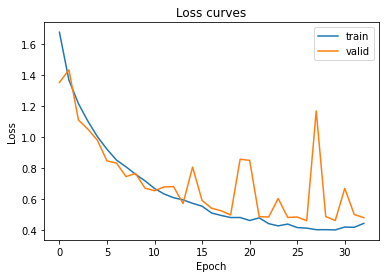

In [35]:
plt.figure()
plt.title("Loss curves")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.plot(history.history['loss'], label = 'train')
plt.plot(history.history['val_loss'], label = 'valid')
plt.legend()
plt.show()

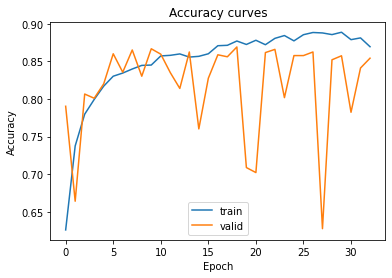

In [36]:
plt.figure()
plt.title("Accuracy curves")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.plot(history.history['accuracy'], label = 'train')
plt.plot(history.history['val_accuracy'], label = 'valid')
plt.legend()
plt.show()

After running the model we can evaluate the loss and accuracy. We can see that our model stops with a final validation accuracy of 85% and a loss of 0.4779. As can be seen on the diagrams the scores varies and spikes a lot. lowering the learning rate or adding more layers could help this and smooth out the curves.

We can do another run with a learning rate of 0.05 and 50 Epochs to see the effect.

In [37]:
input_size = 10_000

callback = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 3)

#initialize a neural network
model2 = Sequential()
# hidden layer
model2.add(Dense(units=512, activation='tanh', input_dim=input_size, kernel_regularizer=regularizers.l2(0.001)))
# output layer
model2.add(Dense(units=2, activation='softmax'))

sgd = optimizers.SGD(learning_rate = 0.05)

model2.compile(loss='sparse_categorical_crossentropy', optimizer = sgd, metrics = ['accuracy'])

history = model2.fit(X_train.toarray(), Y_train, epochs=50, batch_size=50, verbose=1, validation_split=0.2, callbacks=[callback])

Epoch 1/50
300/300 [==============================] - 8s 26ms/step - loss: 1.6052 - accuracy: 0.6733 - val_loss: 1.3675 - val_accuracy: 0.8155
Epoch 2/50
300/300 [==============================] - 7s 23ms/step - loss: 1.3893 - accuracy: 0.7682 - val_loss: 1.3758 - val_accuracy: 0.7429
Epoch 3/50
300/300 [==============================] - 7s 23ms/step - loss: 1.2808 - accuracy: 0.7995 - val_loss: 1.2289 - val_accuracy: 0.8117
Epoch 4/50
300/300 [==============================] - 7s 24ms/step - loss: 1.2065 - accuracy: 0.8180 - val_loss: 1.1505 - val_accuracy: 0.8384
Epoch 5/50
300/300 [==============================] - 7s 24ms/step - loss: 1.1310 - accuracy: 0.8341 - val_loss: 1.1554 - val_accuracy: 0.8221
Epoch 6/50
300/300 [==============================] - 7s 24ms/step - loss: 1.0742 - accuracy: 0.8438 - val_loss: 1.0239 - val_accuracy: 0.8640
Epoch 7/50
300/300 [==============================] - 7s 24ms/step - loss: 1.0294 - accuracy: 0.8470 - val_loss: 1.0010 - val_accuracy: 0.8517

We can see that with a lower learning rate, the final accuracy was 84% and loss 0.5461, which is very close to the previous run.

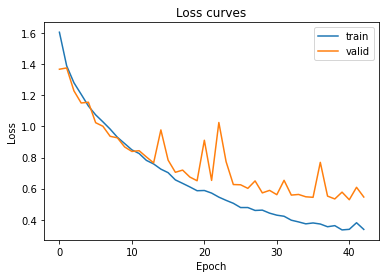

In [38]:
plt.figure()
plt.title("Loss curves")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.plot(history.history['loss'], label = 'train')
plt.plot(history.history['val_loss'], label = 'valid')
plt.legend()
plt.show()

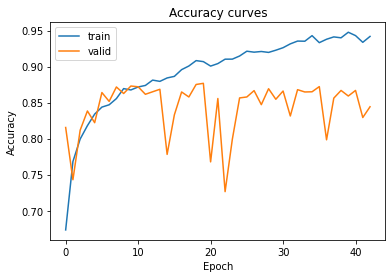

In [39]:
plt.figure()
plt.title("Accuracy curves")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.plot(history.history['accuracy'], label = 'train')
plt.plot(history.history['val_accuracy'], label = 'valid')
plt.legend()
plt.show()

The second run is about the same as the previous, it is still spiky and the accuracy scores is about the same. Both runs stopped early, however the first run stopped earlier.

**(e)** Test your sentiment-classifier on the test set.

We can evaluate both of our models to validate the accuracy and loss. First we validate the initial run and then the second run.

In [41]:
print("Loss + accuracy on train data: {}".format(model.evaluate(X_train, Y_train)))
print("Loss + accuracy on test data: {}".format(model.evaluate(X_test, Y_test)))
print()
print("Loss + accuracy on train data: {}".format(model2.evaluate(X_train, Y_train)))
print("Loss + accuracy on test data: {}".format(model2.evaluate(X_test, Y_test)))

586/586 [==============================] - 5s 8ms/step - loss: 0.3704 - accuracy: 0.9052
Loss + accuracy on train data: [0.3704445958137512, 0.9052266478538513]
196/196 [==============================] - 2s 8ms/step - loss: 0.4705 - accuracy: 0.8547
Loss + accuracy on test data: [0.470451682806015, 0.8547199964523315]

586/586 [==============================] - 5s 8ms/step - loss: 0.3782 - accuracy: 0.9207
Loss + accuracy on train data: [0.3781760036945343, 0.9207466840744019]
196/196 [==============================] - 2s 8ms/step - loss: 0.5395 - accuracy: 0.8454
Loss + accuracy on test data: [0.5395370125770569, 0.8454399704933167]


Doing a final evaluation on the training and test sets, we can compare them and see that the first model did ever so slightly better.

**(h)** Use the classifier to classify a few sentences you write yourselves. 

In [42]:
my_reviews = [
    "I don't like whatever the thing I am reviewing is about, it is simply terrible. Nothing about it is good it's all bad.",
    "I like whatever I am reviewing as it is very nice and fun. It has a good theme and pacing i believe."
]
my_reviews = vect.transform(my_reviews)

# Expects first review to be negative and second one positive.
model.predict(my_reviews)

1/1 [==============================] - 0s 77ms/step


array([[0.9821811 , 0.01781893],
       [0.0144371 , 0.9855629 ]], dtype=float32)

As the prediction show, the first review is 98% negative and the second review is 99% positive, which is very good.

## 6. Speech Recognition

__You should be able to do this exercise after Lecture 9.__

In this exercise, we will work with the <a href="https://arxiv.org/pdf/1804.03209.pdf">Google Speech Command Dataset</a>, which can be downloaded from <a href="http://download.tensorflow.org/data/speech_commands_v0.02.tar.gz">here</a> (note: you do not need to download the full dataset, but it will allow you to play around with the raw audiofiles). This dataset contains 105,829 one-second long audio files with utterances of 35 common words.

We will use a subset of this dataset as indicated in the table below.

| Word | How many? | Class # |
| :-: | :-: | :-: |
| Yes | 4,044 | 3 |
| No | 3,941 | 1 |
| Stop | 3,872 | 2 |
| Go | 3,880 | 0 |

The data is given in the files `XSound.npy` and `YSound.npy`, both of which can be imported using `numpy.load`. `XSound.npy` contains spectrograms (_e.g._, matrices with a time-axis and a frequency-axis of size 62 (time) x 65 (frequency)). `YSound.npy` contains the class number, as indicated in the table above.

In [44]:
import numpy as np
import matplotlib.pyplot as plot
import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import optimizers

from numpy.random import seed

from sklearn.model_selection import train_test_split

seed(69)
tf.random.set_seed(69)

X = np.load('XSound.npy')
Y = np.load('YSound.npy')

In [45]:
## Helper functions ##
words = ['go', 'no', 'stop', 'yes']

def flatten(l):
    '''
    Flattens given array
    '''
    return [item[0] for sublist in l for item in sublist]

def doublePlotSpecgram(dataIndexes):
    '''
    Draw a list of spectrograms based on data indexes [1,3,7,13]
    '''
    # create list of data sets containing [[ X_data, Y_data ], ...]
    dataSets = [[X_train[i], Y_train[i]] for i in dataIndexes]
    fig, axes = plot.subplots(ncols=len(dataSets), figsize=(15, 2))
    for i in range(len(dataSets)):
        X = dataSets[i][0]
        Y = dataSets[i][1]
        axes[i].title.set_text(f'Spectrogram of index {dataIndexes[i]}  \'{words[Y]}\'')
        flat = flatten(X)
        axes[i].specgram(flat, Fs=1, NFFT=64, noverlap=0, cmap="rainbow")
        axes[i].set_xlabel('Time')
        axes[i].set_ylabel('Frequency')

We can define some helper functions for visualizing the data. flatten simply flattens arrays into a single array. doublePlotSpecgram displays multiple spectrograms side-by-side.

__(a)__ Explore and prepare the data, including splitting the data in training, validation and testing data, handling outliers, perhaps taking logarithms, etc. Data preparation is - as always - quite important. Document what you do.

'0/13844 sounds files contain zeros'

'new x has 13844 elements and Y has 13844'

'has zeros 0'

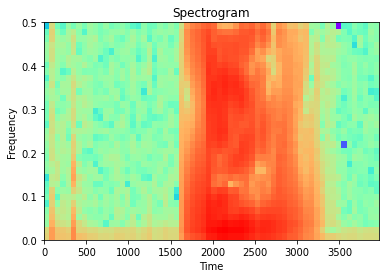

In [47]:
# plot a known entry with zeros
a = X[13]
plot.subplot(211)
plot.subplot()
plot.title('Spectrogram')
flat = flatten(a)
plot.specgram(flat, Fs=1, NFFT=64, noverlap=0, cmap="rainbow")
plot.xlabel('Time')
plot.ylabel('Frequency')

# locate all zeros and remove them
n = 0
x_len = len(X)
hasZeros = []
for a in range(x_len):
    if 0 in X[a].reshape(-1):
        n += 1
        hasZeros.append(a)

X = np.delete(X, hasZeros, axis=0)
Y = np.delete(Y, hasZeros, axis=0)

display(f"{n}/{x_len} sounds files contain zeros")
display(f"new x has {len(X)} elements and Y has {len(Y)}")
display(f"has zeros {len(hasZeros)}")

As can be seen in the above output, 1893 entries were found to have missing data or zeros.

In [48]:
# I will not separate X_train into a validation set because we can use the validation_split parameter in the model.fit()
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, stratify = Y, random_state=69)

__(b)__ Visualize a few examples of yes's, no's, stop's and go's, so that you have a reasonable intuitive understanding of the difference between the words.

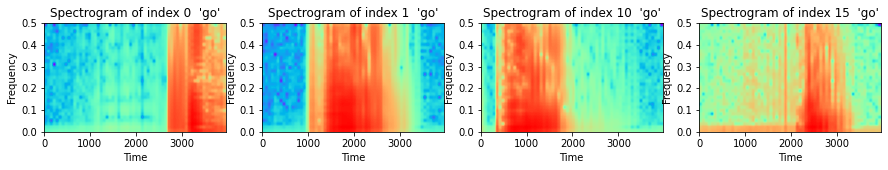

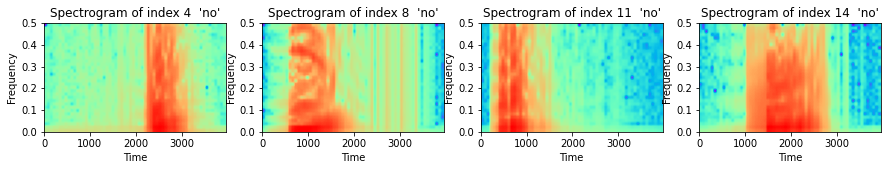

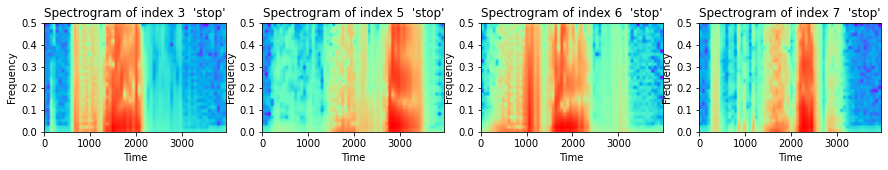

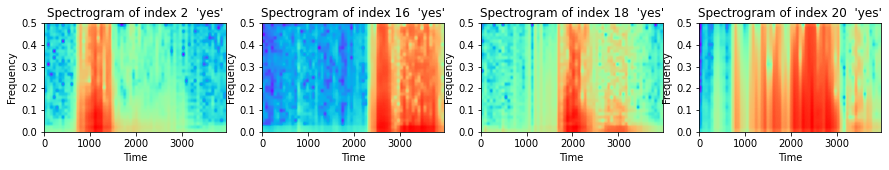

In [49]:
# use helper function to plot a few of each word
for i in range(4):
    indexes = np.where(Y_train == i)[0][0:4]
    doublePlotSpecgram(indexes)

As can be seen above, some of the words have semi-distinct features. 'go' seems to mostly have a single column of frequencies and a very sharp edge on the left side as the word begins. The same goes for 'no'.

Both 'stop' and 'yes' seem to have multiple columns and a lot more noise around the columns. This is likely from the 's' sound.

__(c)__ Train a neural network and at least one other algorithm on the data. Find a good set of hyperparameters for each model. Do you think a neural network is suitable for this kind of problem? Why/why not?

In [50]:
Y_train_categorical = to_categorical(Y_train, 4)

model = Sequential()

model.add(Conv2D(62, (3,3), activation='tanh', input_shape=X_train[0].shape)) #32 feature maps, 3*3 local receptive fields
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dense(units=4, activation='softmax')) #fully connected output layer

sgd = optimizers.SGD(learning_rate=0.1)
model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

history = model.fit(X_train, Y_train_categorical, epochs=10, batch_size=50, verbose=1, validation_split=0.3)

Epoch 1/10
146/146 [==============================] - 10s 70ms/step - loss: 0.8496 - accuracy: 0.6695 - val_loss: 1.3178 - val_accuracy: 0.6462
Epoch 2/10
146/146 [==============================] - 10s 71ms/step - loss: 0.6066 - accuracy: 0.7768 - val_loss: 0.8294 - val_accuracy: 0.7101
Epoch 3/10
146/146 [==============================] - 10s 72ms/step - loss: 0.4986 - accuracy: 0.8118 - val_loss: 0.6533 - val_accuracy: 0.7551
Epoch 4/10
146/146 [==============================] - 10s 70ms/step - loss: 0.4078 - accuracy: 0.8458 - val_loss: 0.5785 - val_accuracy: 0.7891
Epoch 5/10
146/146 [==============================] - 10s 68ms/step - loss: 0.3360 - accuracy: 0.8742 - val_loss: 0.7032 - val_accuracy: 0.7509
Epoch 6/10
146/146 [==============================] - 10s 69ms/step - loss: 0.2958 - accuracy: 0.8921 - val_loss: 0.7565 - val_accuracy: 0.7544
Epoch 7/10
146/146 [==============================] - 10s 68ms/step - loss: 0.2473 - accuracy: 0.9117 - val_loss: 0.5625 - val_accuracy:

I believe Neural Networks is suite for data like this, because each there are so many features and many of the entries in the dataset are very distinct.

In [51]:
# k-means algorithm
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.cluster import adjusted_rand_score
k = 16
X_flat = [i.reshape(-1) for i in X]

scaler = MinMaxScaler()
scaler.fit(X_flat)
scaled_data = scaler.transform(X_flat)
kmeansCluster = KMeans(n_clusters=k, random_state=69, n_init=15, init='k-means++')
kmeansCluster.fit(scaled_data)

fit_pred = kmeansCluster.fit_predict(scaled_data)
adjusted_rand_score(Y, fit_pred)

0.009768063313093727

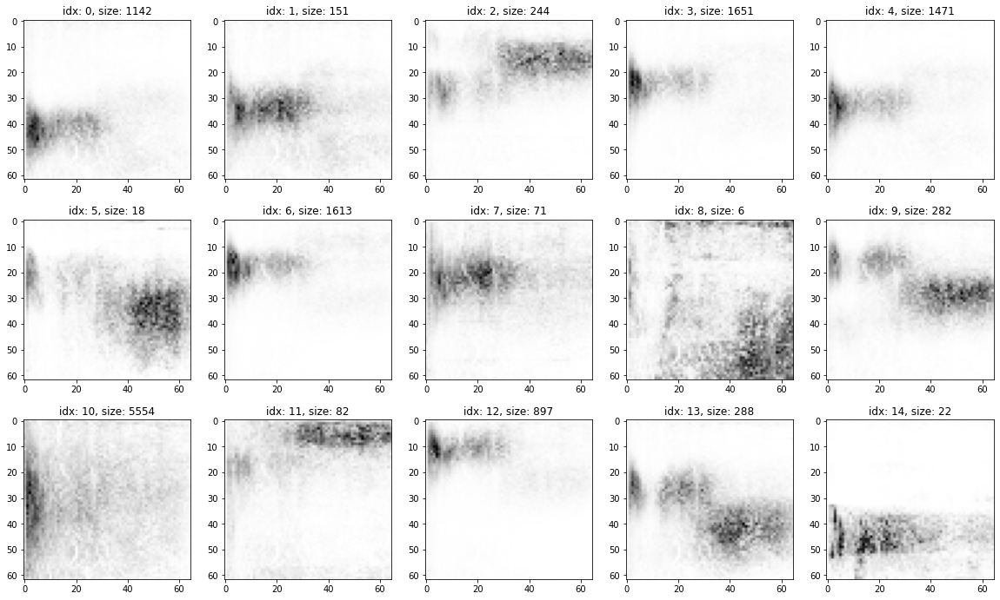

In [52]:
rows=int(k/5)
fig,axes = plt.subplots(rows,5,figsize=(20,4*rows))
for ax,cc,i in zip (axes.ravel(),kmeansCluster.cluster_centers_,np.arange(axes.ravel().size)):
    ax.set_title("idx: {}, size: {}".format(i,len(np.where(kmeansCluster.labels_==i)[0])))
    ax.imshow(cc.reshape(62,65),cmap=plt.cm.gray_r)
plt.show()

Looking at the K-means algorithm above we can immediately see a problem. The clusters repeat a lot with slightly different positions, such as index 0, 1, 3, 4, 6 and 12. We would have to use a lot of clusters in order to predict the words. So in this case the Neural Network is a better fit.

__(d)__ Classify instances of the validation set using your models. Comment on the results in terms of metrics you have learned in the course.

In [53]:
Y_test_categorical = to_categorical(Y_test, 4)
print("Accuracy on training data: {}".format(model.evaluate(X_train, Y_train_categorical)))
print("Accuracy on test data: {}".format(model.evaluate(X_test, Y_test_categorical)))

325/325 [==============================] - 3s 10ms/step - loss: 0.2358 - accuracy: 0.9266
Accuracy on training data: [0.2357618659734726, 0.9266108274459839]
109/109 [==============================] - 1s 10ms/step - loss: 0.4728 - accuracy: 0.8339
Accuracy on test data: [0.4727990925312042, 0.8338630199432373]


Text(0, 0.5, 'Accuracy')

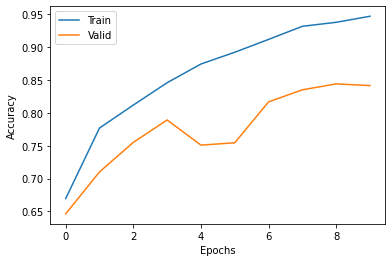

In [54]:
steps = len(history.history['accuracy'])
plt.plot(np.arange(steps), history.history['accuracy'], label = 'Train')
plt.plot(np.arange(steps), history.history['val_accuracy'], label = 'Valid')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

Looking at the above scores and diagram, we can see that the Convolutional model does well, with an accuracy of 83% for the test data. It is also visible from the diagram, that the score may be able to be better if the algorithm runs more Epochs and is allowed to even out or even use early stopping so the score doesn't drop.

__(e)__ Identify (a few) misclassified words, including what they are misclassified as. Visualize them as before, and compare with your intuitive understanding of how the words look. Do you find the misclassified examples surprising?

In [55]:
def doublePlotSpecgramTestData(dataIndexes):
    dataSets = [[X_test[i], Y_test[i]] for i in dataIndexes]
    fig, axes = plot.subplots(ncols=len(dataSets), figsize=(15, 2))
    for i in range(len(dataSets)):
        X = dataSets[i][0]
        Y = dataSets[i][1]
        axes[i].title.set_text(f'Spectrogram of index {dataIndexes[i]}  \'{words[Y]}\'')
        flat = flatten(X)
        axes[i].specgram(flat, Fs=1, NFFT=64, noverlap=0, cmap="rainbow")
        axes[i].set_xlabel('Time')
        axes[i].set_ylabel('Frequency')

4/4 [==============================] - 0s 8ms/step
index 1 predicts	'stop',	real 'go'
index 4 predicts	'no',	real 'stop'
index 17 predicts	'yes',	real 'no'
index 24 predicts	'no',	real 'stop'
index 27 predicts	'no',	real 'stop'
index 35 predicts	'yes',	real 'no'
index 36 predicts	'go',	real 'no'
index 43 predicts	'stop',	real 'go'
index 80 predicts	'go',	real 'no'
index 86 predicts	'yes',	real 'go'
index 90 predicts	'go',	real 'stop'
index 91 predicts	'no',	real 'stop'
index 92 predicts	'no',	real 'go'
index 94 predicts	'no',	real 'go'
index 98 predicts	'go',	real 'no'


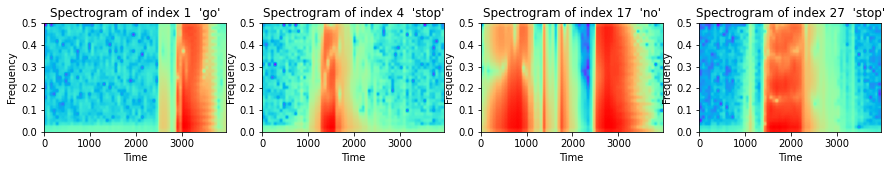

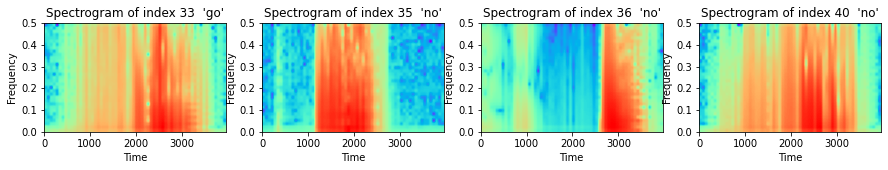

In [56]:
a = model.predict(X_test[0:100])
for i in range(len(a)):
    pred = list(a[i]).index(max(a[i]))
    if pred != Y_test[i]:
        print(f"index {i} predicts\t'{words[pred]}',\treal '{words[Y_test[i]]}'")

doublePlotSpecgramTestData([1,4,17,27])
doublePlotSpecgramTestData([33,35,36,40])

Above are the first 8 mis-predicted spectrograms. They show that not only does no/go get mis-predicted but all the words sometimes get mis-predicted for another.

However a common theme for the spectrograms above is the amount of noise. Many of them have a either a lot of noise (e.g. index 40) or very little actual data (e.g. index 4).

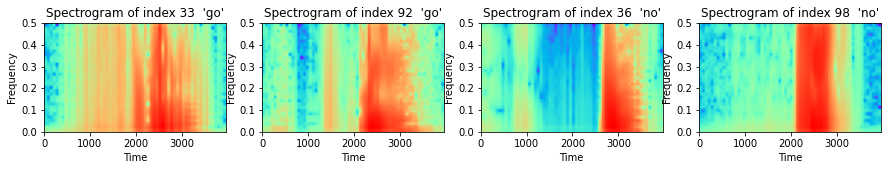

In [57]:
# code from the doublePlotSpecgram helper function, but using test data instead of train
doublePlotSpecgramTestData([33,92,36,98])

It would make sense for no/go to get mis-predicted somewhat often, because they are very similar. Looking at the spectrograms above we can see that index 33 and 92 have some noise, but 36 and 98 don't have much noise, meaning they were likely mispredicted based on the similarity of the words.

## 7. Group Assignment & Presentation



__You should be able to start up on this exercise after Lecture 1.__

*This exercise must be a group effort. That means everyone must participate in the assignment.*

In this assignment you will solve a data science problem end-to-end, pretending to be recently hired data scientists in a company. To help you get started, we've prepared a checklist to guide you through the project. Here are the main steps that you will go through:

1. Frame the problem and look at the big picture
2. Get the data
3. Explore and visualise the data to gain insights
4. Prepare the data to better expose the underlying data patterns to machine learning algorithms
5. Explore many different models and short-list the best ones
6. Fine-tune your models
7. Present your solution 

In each step we list a set of questions that one should have in mind when undertaking a data science project. The list is not meant to be exhaustive, but does contain a selection of the most important questions to ask. We will be available to provide assistance with each of the steps, and will allocate some part of each lesson towards working on the projects.

Your group must submit a _**single**_ Jupyter notebook, structured in terms of the first 6 sections listed above (the seventh will be a video uploaded to some streaming platform, e.g. YouTube, Vimeo, etc.).

1. The problem we will discuss is the reason some countries are considered happier than others.
2. Find if there is association between happiness and the features (Economy, Family, Health, Freedom, Trust, Generosity, Beer, Spirit and Wine consumption)
3. Supervised learning because the data has a right answer, how happy each country is. It is continuous cause happiness has inifinite possible values.
4. By looking at the accuracy of various machine learning algorithms.

### 1. Analysis: Frame the problem and look at the big picture
1. Find a problem/task that everyone in the group finds interesting
2. Define the objective in business terms
3. How should you frame the problem (supervised/unsupervised etc.)?
4. How should performance be measured?

### 2. Get the data
1. Find and document where you can get the data from
2. Get the data
3. Check the size and type of data (time series, geographical etc)

There are two datasets we will use. One has the hapiness score, and data that usually are used to explain why a country's happiness is higher, like economy and health. The other database has the alcohol per capita consumption by country. Both of the datasets results were created in 2016. The datasets url:
https://www.kaggle.com/datasets/cssouza91/hapiness?select=2016.csv

https://www.kaggle.com/datasets/marcospessotto/happiness-and-alcohol-consumption

In [58]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn
from scipy import stats
from sklearn.preprocessing import scale 
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.metrics import mean_squared_error
import plotly.graph_objs as go
from plotly.offline import iplot

from sklearn.preprocessing import MinMaxScaler, Normalizer, StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor

In [59]:
happiness = pd.read_csv("2016.csv")
happiness.head()

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Denmark,Western Europe,1,7.526,7.460,7.592,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171,2.73939
1,Switzerland,Western Europe,2,7.509,7.428,7.590,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083,2.69463
2,Iceland,Western Europe,3,7.501,7.333,7.669,1.42666,1.18326,0.86733,0.56624,0.14975,0.47678,2.83137
3,Norway,Western Europe,4,7.498,7.421,7.575,1.57744,1.12690,0.79579,0.59609,0.35776,0.37895,2.66465
4,Finland,Western Europe,5,7.413,7.351,7.475,1.40598,1.13464,0.81091,0.57104,0.41004,0.25492,2.82596


In [60]:
print("It has {} rows and {} columns.".format(happiness.shape[0], happiness.shape[1]))
happiness.dtypes

It has 157 rows and 13 columns.


Country                           object
Region                            object
Happiness Rank                     int64
Happiness Score                  float64
Lower Confidence Interval        float64
Upper Confidence Interval        float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Trust (Government Corruption)    float64
Generosity                       float64
Dystopia Residual                float64
dtype: object

The dataset has data from 2016 like the happiness dataset. There are a few duplicate columns, which we are not interested in keeping, so we drop them before merging.

In [61]:
alcoholCSV = pd.read_csv("HappinessAlcoholConsumption.csv")
alcoholCSV = alcoholCSV.drop(["Region", "Hemisphere", "HappinessScore", "HDI", "GDP_PerCapita"], axis=1)
alcoholCSV.head()

,Country,Beer_PerCapita,Spirit_PerCapita,Wine_PerCapita
0,Denmark,224,81,278
1,Switzerland,185,100,280
2,Iceland,233,61,78
3,Norway,169,71,129
4,Finland,263,133,97


In [62]:
print("It has {} rows and {} columns.".format(alcoholCSV.shape[0], alcoholCSV.shape[1]))
alcoholCSV.dtypes

It has 122 rows and 4 columns.


Country             object
Beer_PerCapita       int64
Spirit_PerCapita     int64
Wine_PerCapita       int64
dtype: object

In [63]:
combinedDatasets = happiness.merge(alcoholCSV, left_on="Country", right_on="Country")
combinedDatasets.head()

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Beer_PerCapita,Spirit_PerCapita,Wine_PerCapita
0,Denmark,Western Europe,1,7.526,7.460,7.592,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171,2.73939,224,81,278
1,Switzerland,Western Europe,2,7.509,7.428,7.590,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083,2.69463,185,100,280
2,Iceland,Western Europe,3,7.501,7.333,7.669,1.42666,1.18326,0.86733,0.56624,0.14975,0.47678,2.83137,233,61,78
3,Norway,Western Europe,4,7.498,7.421,7.575,1.57744,1.12690,0.79579,0.59609,0.35776,0.37895,2.66465,169,71,129
4,Finland,Western Europe,5,7.413,7.351,7.475,1.40598,1.13464,0.81091,0.57104,0.41004,0.25492,2.82596,263,133,97


### 3. Explore the data
1. Create a copy of the data for explorations (sampling it down to a manageable size if necessary)
2. Create a Jupyter notebook to keep a record of your data exploration
3. Study each feature and its characteristics:
    * Name
    * Type (categorical, int/float, bounded/unbounded, text, structured, etc)
    * Percentage of missing values
    * Check for outliers, rounding errors etc
4. For supervised learning tasks, identify the target(s)
5. Visualise the data
6. Study the correlations between features
7. Identify the promising transformations you may want to apply (e.g. convert skewed targets to normal via a log transformation)
8. Document what you have learned

#### 1 Creating copy

In [64]:
dataset = combinedDatasets.copy()
print("It has {} rows and {} columns.".format(dataset.shape[0], dataset.shape[1]))
dataset.dtypes

It has 118 rows and 16 columns.


Country                           object
Region                            object
Happiness Rank                     int64
Happiness Score                  float64
Lower Confidence Interval        float64
Upper Confidence Interval        float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Trust (Government Corruption)    float64
Generosity                       float64
Dystopia Residual                float64
Beer_PerCapita                     int64
Spirit_PerCapita                   int64
Wine_PerCapita                     int64
dtype: object

#### 2 Jupyter Notebook

#### 3 Features description

Feature description
1. Country: Name of the country
2. Region: The region the country belongs to
3. Happiness Rank: Rank of the country based on the Happiness Score
4. Happiness Score: A metric measured in 2016 by asking the sampled people the question: "How would you rate your happiness on a scale of 0 to 10 where 10 is the happiest"
5. Lower Confidence Interval: indication of how much uncertainty there is in our estimate on the lower boundary
6. Upper Confidence Interval: indication of how much uncertainty there is in our estimate on the upper boundary
7. Economy (GDP per Capita): Country's GDP per capita
8. Family: Strong relationship with a partner, family, friends
9. Health (Life Expectancy): Longer and healthier life
10. Freedom: Freedom to make life choices
11. Trust (Government Corruption): The level of social trust in a society
12. Generosity: How generous people are
13. Dystopia Residual: Dystopia is a hypothetical country ranked lower than the lowest ranking country. Dystopia residual is the sum of the dystopia country's happiness score plus each country’s own prediction error, which measures the extent to which life evaluations are higher or lower than those predicted
14. Beer_PerCapita the beer consumptions per capita in liters
14. Spirit_PerCapita the spirit consumptions per capita in liters
14. Wine_PerCapita the wine consumptions per capita in liters

Data taken from https://worldhappiness.report/ed/2022/happiness-benevolence-and-trust-during-covid-19-and-beyond/

In [65]:
dataset.isnull().sum()

Country                          0
Region                           0
Happiness Rank                   0
Happiness Score                  0
Lower Confidence Interval        0
Upper Confidence Interval        0
Economy (GDP per Capita)         0
Family                           0
Health (Life Expectancy)         0
Freedom                          0
Trust (Government Corruption)    0
Generosity                       0
Dystopia Residual                0
Beer_PerCapita                   0
Spirit_PerCapita                 0
Wine_PerCapita                   0
dtype: int64

In [66]:
dataset.dtypes

Country                           object
Region                            object
Happiness Rank                     int64
Happiness Score                  float64
Lower Confidence Interval        float64
Upper Confidence Interval        float64
Economy (GDP per Capita)         float64
Family                           float64
Health (Life Expectancy)         float64
Freedom                          float64
Trust (Government Corruption)    float64
Generosity                       float64
Dystopia Residual                float64
Beer_PerCapita                     int64
Spirit_PerCapita                   int64
Wine_PerCapita                     int64
dtype: object

In [67]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 118 entries, 0 to 117
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        118 non-null    object 
 1   Region                         118 non-null    object 
 2   Happiness Rank                 118 non-null    int64  
 3   Happiness Score                118 non-null    float64
 4   Lower Confidence Interval      118 non-null    float64
 5   Upper Confidence Interval      118 non-null    float64
 6   Economy (GDP per Capita)       118 non-null    float64
 7   Family                         118 non-null    float64
 8   Health (Life Expectancy)       118 non-null    float64
 9   Freedom                        118 non-null    float64
 10  Trust (Government Corruption)  118 non-null    float64
 11  Generosity                     118 non-null    float64
 12  Dystopia Residual              118 non-null    flo

In [68]:
dataset.iloc[:, 3:].describe()

,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Beer_PerCapita,Spirit_PerCapita,Wine_PerCapita
count,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000
mean,5.557195,5.459975,5.654415,1.021216,0.840081,0.594344,0.383215,0.134977,0.229399,2.353952,138.906780,97.067797,68.093220
std,1.145853,1.153111,1.139521,0.381773,0.251482,0.222809,0.145206,0.114400,0.125321,0.519255,105.090599,78.595658,89.066189
min,3.069000,2.936000,3.202000,0.087090,0.000000,0.000000,0.005890,0.000000,0.000000,0.817890,1.000000,1.000000,1.000000
25%,4.640000,4.515250,4.767250,0.817762,0.708878,0.478178,0.275750,0.052440,0.140220,2.090750,42.000000,32.000000,5.000000
50%,5.553000,5.469500,5.677500,1.088420,0.877970,0.643315,0.404725,0.098535,0.211335,2.300940,127.500000,85.500000,16.000000
75%,6.480250,6.396750,6.570750,1.308817,1.041250,0.775190,0.502933,0.177445,0.303113,2.694330,224.750000,142.500000,115.250000
max,7.526000,7.460000,7.669000,1.824270,1.183260,0.947190,0.608480,0.480490,0.586960,3.559060,376.000000,373.000000,370.000000


<AxesSubplot:>

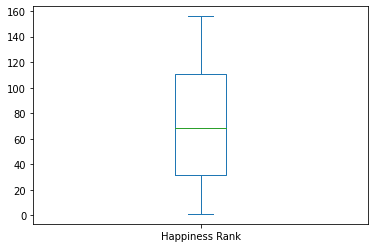

In [69]:
dataset.iloc[:, :3].plot.box()

<AxesSubplot:>

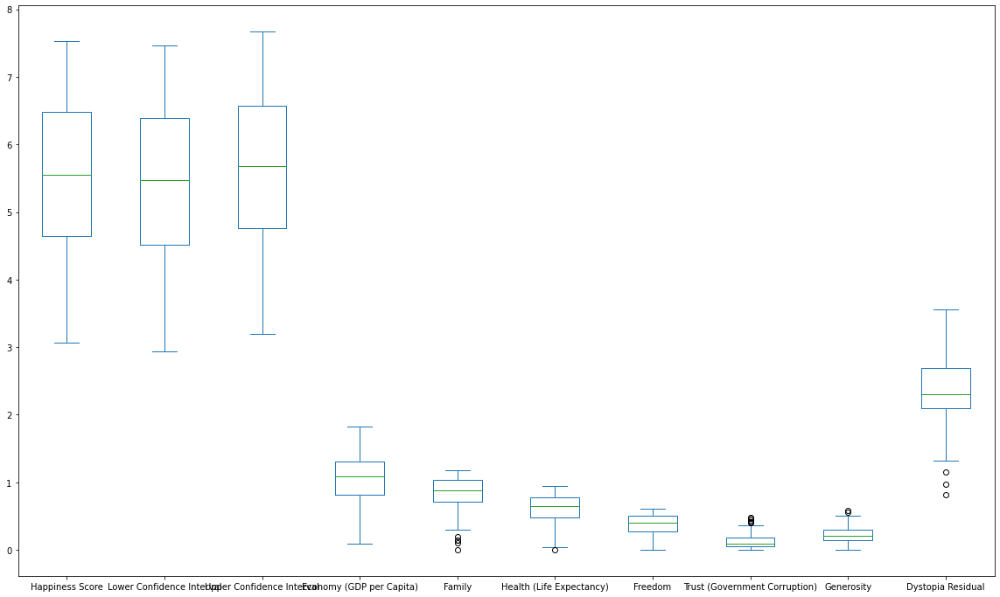

In [70]:
dataset.iloc[:, 3:13].plot.box(figsize=(20,12))

Family, Trust, Generosity and Dystopia Residual have outliers. We do not care about Dystopian Residual as it will not be used for our learning algorithms. However we will decide if to drop the outliers on the first three.

In [71]:
def outliers(column):
    '''
    Return outliers for a given column name
    '''
    Q1 = dataset[column].quantile(0.25)
    Q3 = dataset[column].quantile(0.75)
    IQR = Q3 - Q1    #IQR is interquartile range. 
    return dataset[(dataset[column] < Q1 - 1.5 * IQR) | (dataset[column] > Q3 + 1.5 *IQR)]

outliers("Family")

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Beer_PerCapita,Spirit_PerCapita,Wine_PerCapita
97,Georgia,Central and Eastern Europe,126,4.252,4.164,4.340,0.83792,0.19249,0.64035,0.32461,0.31880,0.06786,1.87031,52,100,149
101,Malawi,Sub-Saharan Africa,132,4.156,4.041,4.271,0.08709,0.14700,0.29364,0.41430,0.07564,0.30968,2.82859,8,11,1
115,Benin,Sub-Saharan Africa,153,3.484,3.404,3.564,0.39499,0.10419,0.21028,0.39747,0.06681,0.20180,2.10812,34,4,13
116,Togo,Sub-Saharan Africa,155,3.303,3.192,3.414,0.28123,0.00000,0.24811,0.34678,0.11587,0.17517,2.13540,36,2,19
117,Syria,Middle East and Northern Africa,156,3.069,2.936,3.202,0.74719,0.14866,0.62994,0.06912,0.17233,0.48397,0.81789,5,35,16


In [72]:
outliers("Trust (Government Corruption)")

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Beer_PerCapita,Spirit_PerCapita,Wine_PerCapita
0,Denmark,Western Europe,1,7.526,7.460,7.592,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171,2.73939,224,81,278
1,Switzerland,Western Europe,2,7.509,7.428,7.590,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083,2.69463,185,100,280
4,Finland,Western Europe,5,7.413,7.351,7.475,1.40598,1.13464,0.81091,0.57104,0.41004,0.25492,2.82596,263,133,97
7,New Zealand,Australia and New Zealand,8,7.334,7.264,7.404,1.36066,1.17278,0.83096,0.58147,0.41904,0.49401,2.47553,203,79,175
9,Sweden,Western Europe,10,7.291,7.227,7.355,1.45181,1.08764,0.83121,0.58218,0.40867,0.38254,2.54734,152,60,186
20,Singapore,Southeastern Asia,22,6.739,6.674,6.804,1.64555,0.86758,0.94719,0.48770,0.46987,0.32706,1.99375,60,12,11
32,Qatar,Middle East and Northern Africa,36,6.375,6.178,6.572,1.82427,0.87964,0.71723,0.56679,0.48049,0.32388,1.58224,1,42,7


In [73]:
outliers("Generosity")

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Beer_PerCapita,Spirit_PerCapita,Wine_PerCapita
28,Malta,Western Europe,30,6.488,6.409,6.567,1.30782,1.09879,0.80315,0.54994,0.17554,0.56237,1.99032,149,100,120
31,Thailand,Southeastern Asia,33,6.474,6.396,6.552,1.08930,1.04477,0.64915,0.49553,0.02833,0.58696,2.57960,99,258,1


We can plot the data too see how similar the countries' alcohol consumption is and look for outlisers. There are a few outliers, especially for wine consumtion, where 50% of the data is very low, indicating that many countries drink little to no wine.

<AxesSubplot:>

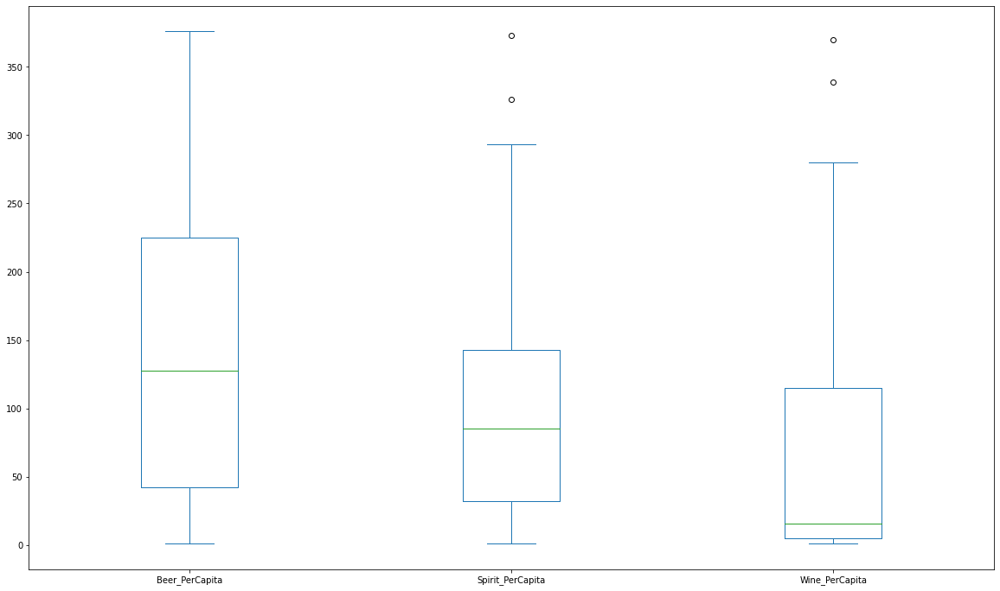

In [74]:
dataset.iloc[:, 13:].plot.box(figsize=(20,12))

Below is the happiness score, because it does not fit on the above scale. There are no outliers.

In [75]:
outliers('Spirit_PerCapita')

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Beer_PerCapita,Spirit_PerCapita,Wine_PerCapita
53,Belarus,Central and Eastern Europe,61,5.802,5.723,5.881,1.13062,1.04993,0.63104,0.29091,0.17457,0.13942,2.38582,142,373,42
104,Haiti,Latin America and Caribbean,136,4.028,3.893,4.163,0.34097,0.29561,0.27494,0.12072,0.14476,0.47958,2.37116,1,326,1


In [76]:
outliers('Wine_PerCapita')

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Beer_PerCapita,Spirit_PerCapita,Wine_PerCapita
30,France,Western Europe,32,6.478,6.397,6.559,1.39488,1.00508,0.83795,0.46562,0.17808,0.12160,2.47440,127,151,370
78,Portugal,Western Europe,94,5.123,5.030,5.216,1.27607,0.94367,0.79363,0.44727,0.01521,0.11691,1.53015,194,67,339


In [78]:
dataset[(dataset['Wine_PerCapita'] < 3)]

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Beer_PerCapita,Spirit_PerCapita,Wine_PerCapita
31,Thailand,Southeastern Asia,33,6.474,6.396,6.552,1.08930,1.04477,0.64915,0.49553,0.02833,0.58696,2.57960,99,258,1
34,Guatemala,Latin America and Caribbean,39,6.324,6.213,6.435,0.83454,0.87119,0.54039,0.50379,0.08701,0.28808,3.19863,53,69,2
40,El Salvador,Latin America and Caribbean,46,6.068,5.967,6.169,0.87370,0.80975,0.59600,0.37269,0.10613,0.08877,3.22134,52,69,2
41,Nicaragua,Latin America and Caribbean,48,5.992,5.877,6.107,0.69384,0.89521,0.65213,0.46582,0.16292,0.29773,2.82428,78,118,1
66,Jordan,Middle East and Northern Africa,80,5.303,5.187,5.419,0.99673,0.86216,0.60712,0.36023,0.13297,0.14262,2.20142,6,21,1
68,Philippines,Southeastern Asia,82,5.279,5.160,5.398,0.81217,0.87877,0.47036,0.54854,0.11757,0.21674,2.23484,71,186,1
80,Vietnam,Southeastern Asia,96,5.061,4.991,5.131,0.74037,0.79117,0.66157,0.55954,0.11556,0.25075,1.94180,111,2,1
84,Nigeria,Sub-Saharan Africa,103,4.875,4.750,5.000,0.75216,0.64498,0.05108,0.27854,0.03050,0.23219,2.88586,42,5,2
85,Honduras,Latin America and Caribbean,104,4.871,4.750,4.992,0.69429,0.75596,0.58383,0.26755,0.06906,0.20440,2.29551,69,98,2
88,Sierra Leone,Sub-Saharan Africa,111,4.635,4.505,4.765,0.36485,0.62800,0.00000,0.30685,0.08196,0.23897,3.01402,25,3,2


#### 4 Identify
The target is happiness score. We will take the columns, Economy, Family, Health, Freedom, Trust and Generosity to see if there is any association between those values and happiness.
From the second dataset the target is happiness score and we will try to find association with the columns: Beer_PerCapita, Beer_PerCapita, Wine_PerCapita.

#### 5 Visualize

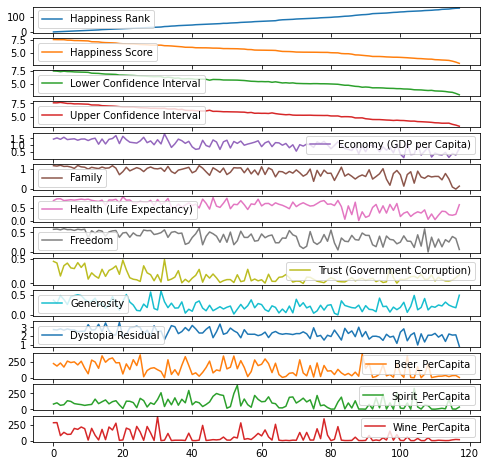

In [79]:
dataset.plot(subplots=True, figsize=(8, 8));

In [80]:
#https://levelup.gitconnected.com/plotting-choropleth-maps-in-python-b74c53b8d0a6
def featureWorldMap(feature, title):
    '''
    Returns a world heatmap of a given feature
    '''
    return go.Figure(
        data = {
            'type':'choropleth',
            'locations':dataset['Country'],
            'locationmode':'country names',
            'colorscale':["darkred","red","lightcoral","white", "palegreen","green","darkgreen"],
            'z':dataset[feature],
            'colorbar':{'title': title},
            'marker': {
                'line': {
                    'color':'rgb(255,255,255)',
                    'width':2
                }
            }
        },     
        layout = {      
          'geo':{
              'scope':'world', 
          }  
        }
    )

In [81]:
featureWorldMap("Happiness Score", "Happiness Score")

In [82]:
featureWorldMap("Beer_PerCapita", "Beer consumption")

In [83]:
featureWorldMap("Spirit_PerCapita", "Spirit  consumption")

In [84]:
featureWorldMap("Wine_PerCapita", "Wine  consumption")

#### 6 Correlation between features

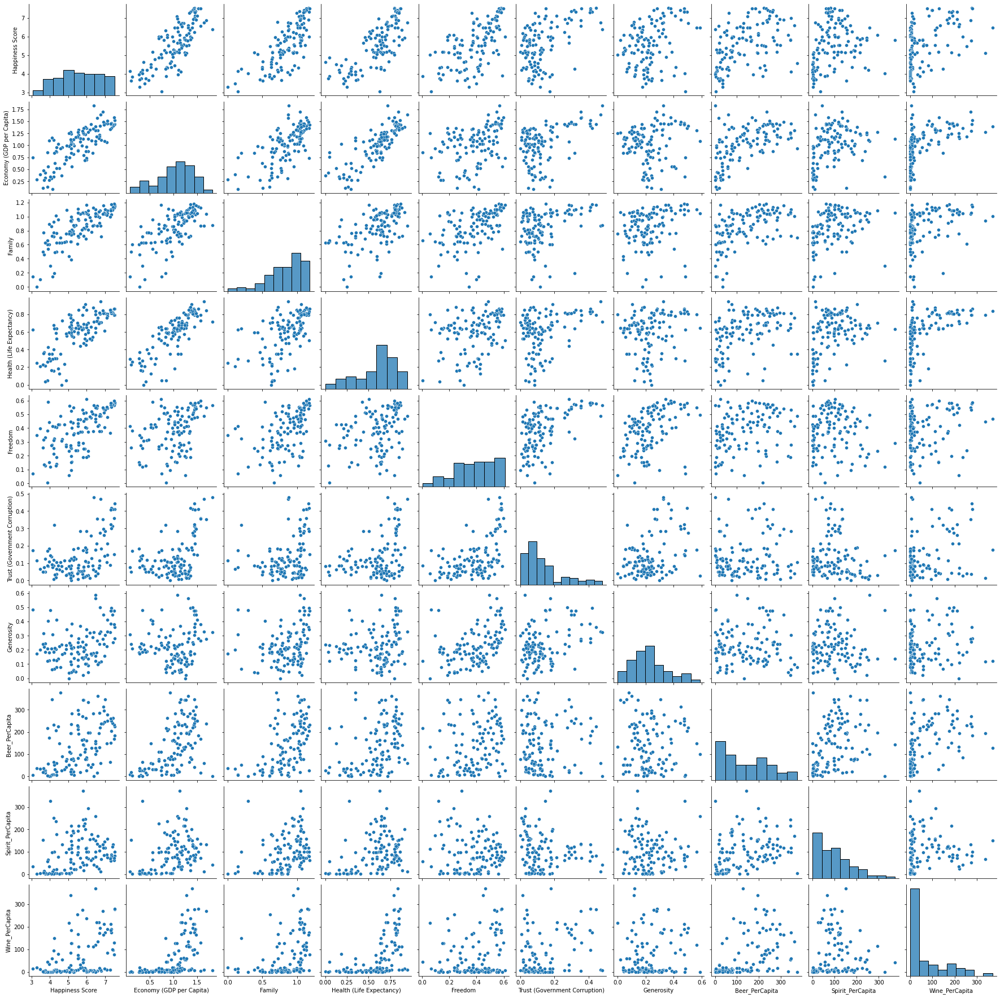

In [85]:
data_corr = dataset.iloc[:,[3,6,7,8,9,10,11,13,14,15]]
# pairplot
seaborn.pairplot(data_corr)
# to show
plt.show()

In [86]:
print("happiness and Economy\t correlation is {}.".format(dataset.iloc[:,3].corr(dataset.iloc[:,6])))
print("happiness and Family\t correlation is {}.".format(dataset.iloc[:,3].corr(dataset.iloc[:,7])))
print("happiness and Health\t correlation is {}.".format(dataset.iloc[:,3].corr(dataset.iloc[:,8])))
print("happiness and Freedom\t correlation is {}.".format(dataset.iloc[:,3].corr(dataset.iloc[:,9])))
print("happiness and Trust\t correlation is {}.".format(dataset.iloc[:,3].corr(dataset.iloc[:,10])))
print("happiness and Generosity correlation is {}.".format(dataset.iloc[:,3].corr(dataset.iloc[:,11])))
print("happiness and Beer\t correlation is {}.".format(dataset.iloc[:,3].corr(dataset.iloc[:,13])))
print("happiness and Spirit\t correlation is {}.".format(dataset.iloc[:,3].corr(dataset.iloc[:,14])))
print("happiness and Wine\t correlation is {}.".format(dataset.iloc[:,3].corr(dataset.iloc[:,15])))

happiness and Economy	 correlation is 0.7896671254192654.
happiness and Family	 correlation is 0.7509180595792792.
happiness and Health	 correlation is 0.7470862678123842.
happiness and Freedom	 correlation is 0.6183532344146925.
happiness and Trust	 correlation is 0.5161251180353214.
happiness and Generosity correlation is 0.3067203229436911.
happiness and Beer	 correlation is 0.4807494310940025.
happiness and Spirit	 correlation is 0.23063681111279222.
happiness and Wine	 correlation is 0.44042535523016324.


We can also see the correlation in a heatmap.

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5]),
 [Text(0.5, 0, 'Happiness Score'),
  Text(1.5, 0, 'Economy (GDP per Capita)'),
  Text(2.5, 0, 'Family'),
  Text(3.5, 0, 'Health (Life Expectancy)'),
  Text(4.5, 0, 'Freedom'),
  Text(5.5, 0, 'Trust (Government Corruption)'),
  Text(6.5, 0, 'Generosity'),
  Text(7.5, 0, 'Beer_PerCapita'),
  Text(8.5, 0, 'Spirit_PerCapita'),
  Text(9.5, 0, 'Wine_PerCapita')])

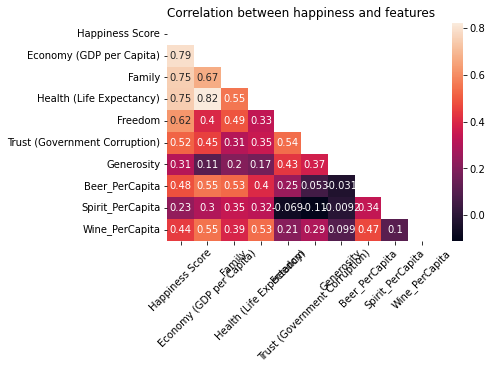

In [87]:
labels = data_corr.columns

seaborn.heatmap(data_corr.corr(),
             mask=np.triu(np.ones_like(data_corr.corr())),
             annot=True,
             xticklabels=labels,
             yticklabels=labels)\
    .set_title('Correlation between happiness and features')

plt.xticks(rotation=45)

#### 7 Identify transformations
**Happiness data:** We will remove some of the columns that are not part of our research. The columns that will be dropped are Lower Confidence Interval, Upper Confidence Interval, Dystopia Residual and Happiness Rank.
The outliers of the columns Trust and Generosity after taking a look seemed to be normal numbers so they will not be dropped. The Family outlier was a suspicious number as it was the only 0 in that column. However we had 0 values in all other features columns even though they were not marked as outliers so we will assume it is a real value and keep it.

**Alcohol data:** Some duplicate columns were already removed when merging the datasets.
Looking at the outliers for alcohol consumptions and comparing them to neighbouring countries on the country heatmap, they don't look overly suspicious. Only Haiti seems a little out of place, but may be due to high consumtions of Rum or Agave based drinks such as tequilla, commonly brewed in central and South America.

#### 8 Document
We can see that Economy, Health, Family and Freedom play a big role for a country's happiness. Trust is also important although not so much. Generosity is not associated with how much happy a country is.
From the alcohol data, it appears that beer and wine contribute the most to the happiness of a country, however the correlations are not very high. Spirit correlates very little to the happiness of a country.

### 4. Prepare the data
Notes:
* Work on copies of the data (keep the original dataset intact).
* Write functions for all data transformations you apply, for three reasons:
    * So you can easily prepare the data the next time you run your code
    * So you can apply these transformations in future projects
    * To clean and prepare the test set
    
    
1. Data cleaning:
    * Fix or remove outliers (or keep them)
    * Fill in missing values (e.g. with zero, mean, median, regression ...) or drop their rows (or columns)
2. Feature selection (optional):
    * Drop the features that provide no useful information for the task (e.g. a customer ID is usually useless for modelling).
3. Feature engineering, where appropriate:
    * Discretize continuous features
    * Use one-hot encoding if/when relevant
    * Add promising transformations of features (e.g. $\log(x)$, $\sqrt{x}$, $x^2$, etc)
    * Aggregate features into promising new features
4. Feature scaling: standardise or normalise features

In [89]:
df_hap = dataset.iloc[:,[3,6,7,8,9,10,11,13,14,15]]
df_hap.head()

,Happiness Score,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Beer_PerCapita,Spirit_PerCapita,Wine_PerCapita
0,7.526,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171,224,81,278
1,7.509,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083,185,100,280
2,7.501,1.42666,1.18326,0.86733,0.56624,0.14975,0.47678,233,61,78
3,7.498,1.57744,1.12690,0.79579,0.59609,0.35776,0.37895,169,71,129
4,7.413,1.40598,1.13464,0.81091,0.57104,0.41004,0.25492,263,133,97


Because the alcohol consumption is in liters the values range from 1 to 376, but we would like to scale this data using a MinMax scaler so the values are between 0 and 1.

In [90]:
X = df_hap.iloc[:,1:]
y = df_hap['Happiness Score']
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8
0,1.106305,1.292497,0.904595,1.356911,2.717426,1.060275,0.813166,-0.205308,2.366801
1,1.331347,1.218619,1.211045,1.399515,2.432123,0.412142,0.440475,0.037467,2.389352
2,1.066532,1.370448,1.230427,1.265826,0.129687,1.982390,0.899172,-0.460860,0.111704
3,1.463163,1.145381,0.907975,1.472272,1.955712,1.198428,0.287576,-0.333084,0.686753
4,1.012132,1.176289,0.976126,1.299023,2.414654,0.204512,1.185857,0.459128,0.325938
...,...,...,...,...,...,...,...,...,...
113,-1.445914,-0.254981,-1.069776,-0.453799,-0.737281,0.683720,-0.983395,-1.163628,-0.756509
114,-2.404715,-1.343978,-1.634764,-0.869597,-0.758964,0.089999,-1.145850,0.701902,-0.745233
115,-1.647307,-2.938698,-1.731085,0.098592,-0.598405,-0.221166,-1.002508,-1.189184,-0.621203
116,-1.946556,-3.354769,-1.560574,-0.251987,-0.167730,-0.434566,-0.983395,-1.214739,-0.553550


In [91]:
# To more easily refer to the columns in the scaled dataset we'll use these variables.
ECO,FAM,HEALTH,FREE,TRUST,GEN,BEER,SPIRIT,WINE = 0,1,2,3,4,5,6,7,8

### 5. Short-list promising models
We expect you to do some additional research and train at **least one model per team member**.

1. Train mainly quick and dirty models from different categories (e.g. linear, SVM, Random Forests etc) using default parameters
2. Measure and compare their performance
3. Analyse the most significant variables for each algorithm
4. Analyse the types of errors the models make
5. Have a quick round of feature selection and engineering if necessary
6. Have one or two more quick iterations of the five previous steps
7. Short-list the top three to five most promising models, preferring models that make different types of errors

In [92]:
X = df_hap.iloc[:,1:]
y = df_hap['Happiness Score']
Xcolumns = X.columns
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)
pd.DataFrame(X)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)

In [93]:
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Linear Regression: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

alphas = 10**np.linspace(-10, 10, 100)

ridgecv = RidgeCV(alphas = alphas)
ridgecv.fit(X_train, y_train)

print("Ridge: R^2 on train data is {} and on test data is {}".format(ridgecv.score(X_train, y_train), 
                                                              ridgecv.score(X_test,y_test)))

lassocv = LassoCV(alphas = None, cv = 10, max_iter = 100000)
lassocv.fit(X_train, y_train)

print("Lasso: R^2 on train data is {} and on test data is {}".format(lassocv.score(X_train, y_train), 
                                                              lassocv.score(X_test,y_test)))

e_netCV = ElasticNetCV(alphas = None, max_iter = 10000)
e_netCV.fit(X_train, y_train)

print("Elastic Net: R^2 on train data is {} and on test data is {}".format(e_netCV.score(X_train, y_train), 
                                                              e_netCV.score(X_test,y_test)))

regressor = DecisionTreeRegressor(random_state = 69)
regressor.fit(X_train, y_train)
print("Decision Tree: R^2 on train data is {} and on test data is {}".format(regressor.score(X_train, y_train), 
                                                              regressor.score(X_test,y_test)))


regressor_forest = RandomForestRegressor(random_state = 69)
regressor_forest.fit(X_train, y_train)
regressor_forest.score(X_test,y_test)
print("Random Forest: R^2 on train data is {} and on test data is {}".format(regressor_forest.score(X_train, y_train), 
                                                              regressor_forest.score(X_test,y_test)))


boost = GradientBoostingRegressor(random_state=69)
boost.fit(X_train,y_train)
print("Gradient: R^2 on train data is {} and on test data is {}".format(boost.score(X_train, y_train), 
                                                              boost.score(X_test,y_test)))

ada = AdaBoostRegressor(random_state=69)
ada.fit(X_train,y_train)
print("Ada Boost: R^2 on train data is {} and on test data is {}".format(ada.score(X_train, y_train), 
                                                              ada.score(X_test,y_test)))

Linear Regression: R^2 on train data is 0.8157205480939402 and on test data is 0.7391470750274364
Ridge: R^2 on train data is 0.809673655221876 and on test data is 0.7631040176342635
Lasso: R^2 on train data is 0.8157052280359876 and on test data is 0.7398946689393139
Elastic Net: R^2 on train data is 0.8141391042735131 and on test data is 0.7491176402712683
Decision Tree: R^2 on train data is 1.0 and on test data is 0.3604399134387075
Random Forest: R^2 on train data is 0.9623496313759795 and on test data is 0.7036447808712301
Gradient: R^2 on train data is 0.9991994231578427 and on test data is 0.7218707180251747
Ada Boost: R^2 on train data is 0.9328801636791149 and on test data is 0.7141860938231955


Below is a table of the scores from above, with the top 4 highlighted: Ridge, Elastic Net, Lasso and Linear Regression.

| Model | Train score | Test score |
|-------|-------------|------------|
**Linear Regression** | 0.81572 | **0.73915** |
**Ridge** | 0.80967 | **0.76310** |
**Lasso** | 0.81571 | **0.73989** |
**Elastic Net** | 0.81414 | **0.74912** |
Decision Tree | 1.00000 | 0.36044 |
Random Forest | 0.96235 | 0.70364 |
Gradient | 0.99919 | 0.72187 |
Ada Boost | 0.93288 | 0.71419 |

Tuning some algorithms to reduce overfitting


In [95]:
regressor_forest = RandomForestRegressor(random_state = 69, max_depth=2)
regressor_forest.fit(X_train, y_train)
regressor_forest.score(X_test,y_test)
print("Random Forest: R^2 on train data is {} and on test data is {}".format(regressor_forest.score(X_train, y_train), 
                                                              regressor_forest.score(X_test,y_test)))

boost = GradientBoostingRegressor(random_state=69, max_depth=1)
boost.fit(X_train,y_train)
print("Gradient: R^2 on train data is {} and on test data is {}".format(boost.score(X_train, y_train), 
                                                              boost.score(X_test,y_test)))

Random Forest: R^2 on train data is 0.8329602273895879 and on test data is 0.6623605120584957
Gradient: R^2 on train data is 0.9231823253002066 and on test data is 0.7372596902493713


We will also try to see which are the most important features using random forest regression.

In [96]:
def plot_feature_importances_sorted(model):
    features = np.array(Xcolumns)
    importances = model.feature_importances_
    sorted_idx = np.argsort(importances)
    padding = np.arange(len(features)) + 0.5
    plt.barh(padding, importances[sorted_idx], align='center')
    plt.yticks(padding, features[sorted_idx])
    plt.xlabel("Relative Importance")
    plt.title("Variable Importance")
    plt.show()

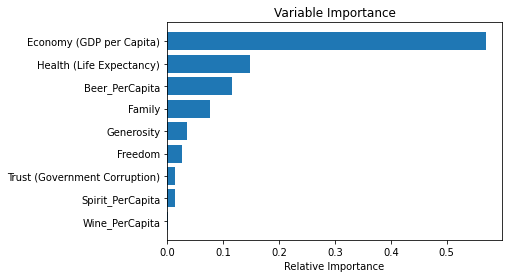

In [97]:
plot_feature_importances_sorted(regressor_forest)

We will train random forest but keep only the most important features and see if we can get a better accuracy than Ridge.

In [98]:
X = df_hap.iloc[:,1:]
y = df_hap['Happiness Score']
Xcolumns = X.columns
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)
pd.DataFrame(X)

X = np.delete(X, WINE, 1)
X = np.delete(X, SPIRIT, 1)
y = df_hap['Happiness Score']

X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
regressor_forest = RandomForestRegressor(random_state = 69, max_depth=2)
regressor_forest.fit(X_train, y_train)
regressor_forest.score(X_test,y_test)
print("Random Forest: R^2 on train data is {} and on test data is {}".format(regressor_forest.score(X_train, y_train), 
                                                              regressor_forest.score(X_test,y_test)))

Random Forest: R^2 on train data is 0.8326492428156251 and on test data is 0.667166565435729


Ridge has the best performance.

We will compare the accuracy of training a model with each one of the features seperately using linear regression.

In [99]:
X = df_hap.iloc[:,1].values.reshape(-1,1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Economy: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

X = df_hap.iloc[:,2].values.reshape(-1,1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Family: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

X = df_hap.iloc[:,3].values.reshape(-1,1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Health: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

X = df_hap.iloc[:,4].values.reshape(-1,1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Freedom: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

X = df_hap.iloc[:,5].values.reshape(-1,1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Trust: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

X = df_hap.iloc[:,6].values.reshape(-1,1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Generosity: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

X = df_hap.iloc[:,7].values.reshape(-1,1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Beer: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

X = df_hap.iloc[:,8].values.reshape(-1,1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Spirit: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

X = df_hap.iloc[:,9].values.reshape(-1,1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Wine: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

Economy: R^2 on train data is 0.6854382630802429 and on test data is 0.5663184780870714
Family: R^2 on train data is 0.526469021145125 and on test data is 0.5786411376823299
Health: R^2 on train data is 0.5265406846559759 and on test data is 0.5547078441889846
Freedom: R^2 on train data is 0.3125806992772868 and on test data is 0.4115933580570228
Trust: R^2 on train data is 0.24512367376479682 and on test data is 0.25333282518759226
Generosity: R^2 on train data is 0.07715095666439076 and on test data is 0.07544304195161933
Beer: R^2 on train data is 0.3929679893383089 and on test data is 0.049712140263640237
Spirit: R^2 on train data is 0.026623641872914994 and on test data is 0.03806296991174385
Wine: R^2 on train data is 0.1661412431313125 and on test data is 0.18887881399226503


| Feature | Train score | Test score |
|---------|-------------|------------|
| Economy | 0.68544 | 0.56632 |
| Family | 0.52647 | 0.57864 |
| Health | 0.52654 | 0.55471 |
| Freedom | 0.31258 | 0.41159 |
| Trust | 0.24512 | 0.25333 |
| Generosity | 0.07715 | 0.07544 |
| Beer | 0.39297 | 0.04971 |
| Spirit | 0.02662 | 0.03806 |
| Wine | 0.16614 | 0.18888 |

As also seen before when we found the correlation, the performance is better for Economy, Family and Health. However, the performance is worse than the model with all features so we can conclude that a combination of these features makes a country happy. We will use Ridge for feature selection.

In [100]:
# reset data
X = df_hap.iloc[:,1:]
y = df_hap['Happiness Score']
Xcolumns = X.columns
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8
0,1.106305,1.292497,0.904595,1.356911,2.717426,1.060275,0.813166,-0.205308,2.366801
1,1.331347,1.218619,1.211045,1.399515,2.432123,0.412142,0.440475,0.037467,2.389352
2,1.066532,1.370448,1.230427,1.265826,0.129687,1.982390,0.899172,-0.460860,0.111704
3,1.463163,1.145381,0.907975,1.472272,1.955712,1.198428,0.287576,-0.333084,0.686753
4,1.012132,1.176289,0.976126,1.299023,2.414654,0.204512,1.185857,0.459128,0.325938
...,...,...,...,...,...,...,...,...,...
113,-1.445914,-0.254981,-1.069776,-0.453799,-0.737281,0.683720,-0.983395,-1.163628,-0.756509
114,-2.404715,-1.343978,-1.634764,-0.869597,-0.758964,0.089999,-1.145850,0.701902,-0.745233
115,-1.647307,-2.938698,-1.731085,0.098592,-0.598405,-0.221166,-1.002508,-1.189184,-0.621203
116,-1.946556,-3.354769,-1.560574,-0.251987,-0.167730,-0.434566,-0.983395,-1.214739,-0.553550


In [101]:
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)

ridgecv = RidgeCV(alphas = alphas)
ridgecv.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(ridgecv.score(X_train, y_train), 
                                                              ridgecv.score(X_test,y_test)))

pd.Series(ridgecv.coef_, index=Xcolumns)

R^2 on train data is 0.809673655221876 and on test data is 0.7631040176342635


Economy (GDP per Capita)         0.348945
Family                           0.257445
Health (Life Expectancy)         0.171703
Freedom                          0.116715
Trust (Government Corruption)    0.156693
Generosity                       0.100187
Beer_PerCapita                   0.184716
Spirit_PerCapita                -0.026831
Wine_PerCapita                  -0.082030
dtype: float64

We will remove the least important features. Wine and Spirit.

In [102]:
# reset data
X = df_hap.iloc[:,1:]
y = df_hap['Happiness Score']
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)
pd.DataFrame(X)

X = np.delete(X, WINE, 1)
X = np.delete(X, SPIRIT, 1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ridgecv = RidgeCV(alphas = alphas)
ridgecv.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(ridgecv.score(X_train, y_train), 
                                                              ridgecv.score(X_test,y_test)))

pd.Series(ridgecv.coef_, index=Xcolumns[0:7])

R^2 on train data is 0.7969862776947938 and on test data is 0.7668038411987816


Economy (GDP per Capita)         0.297983
Family                           0.244439
Health (Life Expectancy)         0.163010
Freedom                          0.135679
Trust (Government Corruption)    0.148611
Generosity                       0.090124
Beer_PerCapita                   0.163046
dtype: float64

We will keep these features as they seem to have similar importance. We will train different models with the features Economy, Family, Health, Freedom, Trust, Generosity, Beer.

In [103]:
# reset data
X = df_hap.iloc[:,1:]
y = df_hap['Happiness Score']
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)
pd.DataFrame(X)

X = np.delete(X, WINE, 1)
X = np.delete(X, SPIRIT, 1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)

In [104]:
ODS = LinearRegression()
ODS.fit(X_train, y_train)
print("Linear Regression: R^2 on train data is {} and on test data is {}".format(ODS.score(X_train, y_train), 
                                                              ODS.score(X_test,y_test)))

alphas = 10**np.linspace(-10, 10, 100)

ridgecv = RidgeCV(alphas = alphas)
ridgecv.fit(X_train, y_train)

print("Ridge: R^2 on train data is {} and on test data is {}".format(ridgecv.score(X_train, y_train), 
                                                              ridgecv.score(X_test,y_test)))

lassocv = LassoCV(alphas = None, cv = 10, max_iter = 100000)
lassocv.fit(X_train, y_train)

print("Lasso: R^2 on train data is {} and on test data is {}".format(lassocv.score(X_train, y_train), 
                                                              lassocv.score(X_test,y_test)))

e_netCV = ElasticNetCV(alphas = None, max_iter = 10000)
e_netCV.fit(X_train, y_train)

print("Elastic Net: R^2 on train data is {} and on test data is {}".format(e_netCV.score(X_train, y_train), 
                                                              e_netCV.score(X_test,y_test)))

regressor = DecisionTreeRegressor(random_state = 69)
regressor.fit(X_train, y_train)
print("Decision Tree: R^2 on train data is {} and on test data is {}".format(regressor.score(X_train, y_train), 
                                                              regressor.score(X_test,y_test)))


regressor_forest = RandomForestRegressor(random_state = 69, max_depth=2)
regressor_forest.fit(X_train, y_train)
regressor_forest.score(X_test,y_test)
print("Random Forest: R^2 on train data is {} and on test data is {}".format(regressor_forest.score(X_train, y_train), 
                                                              regressor_forest.score(X_test,y_test)))


boost = GradientBoostingRegressor(random_state=69, max_depth=1)
boost.fit(X_train,y_train)
print("Gradient: R^2 on train data is {} and on test data is {}".format(boost.score(X_train, y_train), 
                                                              boost.score(X_test,y_test)))

ada = AdaBoostRegressor(random_state=69)
ada.fit(X_train,y_train)
print("Ada Boost: R^2 on train data is {} and on test data is {}".format(ada.score(X_train, y_train), 
                                                              ada.score(X_test,y_test)))

Linear Regression: R^2 on train data is 0.8032210045447299 and on test data is 0.7590406179801248
Ridge: R^2 on train data is 0.7969862776947938 and on test data is 0.7668038411987816
Lasso: R^2 on train data is 0.8032070467578001 and on test data is 0.7588620463923423
Elastic Net: R^2 on train data is 0.8029405011774073 and on test data is 0.7603046550881256
Decision Tree: R^2 on train data is 1.0 and on test data is 0.47246494234347336
Random Forest: R^2 on train data is 0.8326492428156251 and on test data is 0.667166565435729
Gradient: R^2 on train data is 0.9194812328880763 and on test data is 0.7371589378156305
Ada Boost: R^2 on train data is 0.9436833257711875 and on test data is 0.6828886263073815


Below are all of the scores with the 4 best highlighted.

| Model | Train score | Test score |
|-------|-------------|------------|
| **Linear Regression** | 0.80322 | **0.75904** | 
| **Ridge** | 0.79699  | **0.76680** |
| **Lasso** | 0.80321 | **0.75886** |
| **Elastic Net** | 0.80294  | **0.76030** |
| Decision Tree | 1.00000 | 0.47247 |
| Random Forest | 0.83265 | 0.66717 |
| Gradient | 0.91948 | 0.73716 |
| Ada Boost | 0.94368 | 0.68289 |


The best model is Ridge, followed by Elastic, then Linear Regression, then Lasso. The other models are not good candidates as most are overfitting and have worse accuracy than the first models.

### 6. Fine-tune the system
1. Fine-tune the hyperparameters
2. Once you are confident about your final model, measure its performance on the test set to estimate the generalisation error

In [105]:
# reset data
X = df_hap.iloc[:,1:]
y = df_hap['Happiness Score']
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)
pd.DataFrame(X)

X = np.delete(X, WINE, 1)
X = np.delete(X, SPIRIT, 1)
y = df_hap['Happiness Score']
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=69)
ridgecv = RidgeCV(alphas = alphas)
ridgecv.fit(X_train, y_train)

print("R^2 on train data is {} and on test data is {}".format(ridgecv.score(X_train, y_train), 
                                                              ridgecv.score(X_test,y_test)))

pd.Series(ridgecv.coef_, index=Xcolumns[0:7])

R^2 on train data is 0.7969862776947938 and on test data is 0.7668038411987816


Economy (GDP per Capita)         0.297983
Family                           0.244439
Health (Life Expectancy)         0.163010
Freedom                          0.135679
Trust (Government Corruption)    0.148611
Generosity                       0.090124
Beer_PerCapita                   0.163046
dtype: float64

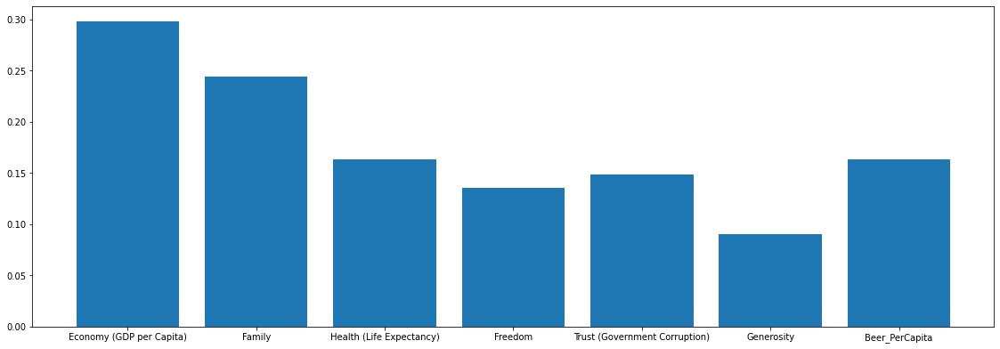

In [106]:
fig = plt.figure(figsize=(15, 5))
ax = fig.add_axes([0,0,1,1])
ax.bar(Xcolumns[0:7], list(ridgecv.coef_) )
plt.show()

The best model is therefore RidgeCV with a test score of 0.76680

### 7. Present your solution
1. Document what you have done
2. Create a nice 15 minute video presentation with slides
    * Make sure you highlight the big picture first
3. Explain why your solution achieves the business objective
4. Don't forget to present interesting points you noticed along the way:
    * Describe what worked and what did not
    * List your assumptions and you model's limitations
5. Ensure your key findings are communicated through nice visualisations or easy-to-remember statements (e.g. "the median income is the number-one predictor of housing prices")
6. Upload the presentation to some online platform, e.g. YouTube or Vimeo, and supply a link to the video in the notebook.

## References

Géron, A. 2017, *Hands-On Machine Learning with Scikit-Learn and Tensorflow*, Appendix B, O'Reilly Media, Inc., Sebastopol.